# InGAIA Learning: Marcellus

## **How to work with this notebook?**

The purpose of this file is to teach how to use and update the models developed during the InGAIA project for the Marcellus zone, as well as to create new ones. 

For this purpose, this file has been designed in Jupyter Notebook format and contains a mixture of text cells and Python code. 

If you want to read the contents of the file without making any changes, it is recommended to open the file ***"InGAIA_Marcellus.html"***. In this file you will find the contents of the notebook with all the cells that have been executed and their stored results. 


If you want to run the Python code or make any changes, it is recommended to open the file ***InGAIA_Marcellus.ipynb*** in a development environment such as [Visual Studio Code](https://code.visualstudio.com/download) or [Jupyter](https://jupyter.org/install) and follow the configuration steps described in section **0. Setting up InGAIA**. It is important to note that this notebook has been designed to be executed sequentially, from the top cells to the bottom ones, so it is crucial to respect this order, otherwise the execution of the cells may lead to unexpected errors. It is therefore recommended that you execute the cells in this order by clicking on the *Execute* button for each cell, or by pressing ***Shift+Enter*** or ***Ctrl+Enter***.




## **Introduction**

The oil exploration industry relies heavily on accurate data analysis and forecasting models. At areas such as Libya and Marcellus, drilling for oil requires an understanding of the complex geological formations that make up the subsurface. One of the key variables in this context is porosity, which reflects the amount of void space in the rock that may contain oil or gas. Another important variable is water saturation, which reflects the amount of water present in the rock.

This project stems from Repsol's InGAIA initiative, launched through HackIA 2022.3 in which Repsol and Capgemini collaborated. For two months, a first project was carried out in which a team of Data Scientists worked to predict porosity and water saturation in sets of numerous wells in Marcellus and Libya areas using machine learning techniques. 

Given the good results obtained in that project, it was decided to perform an extension in which predictive models of rock type were created for Marcellus. By predicting rock type, geologists can steer the well along optimal trajectories, avoiding unstable formations or undesirable rock types. This helps maintain wellbore stability, minimize drilling complications and reduce the risk of wellbore collapse or formation damage.

Again, the results were very promising, which justified the creation of a new project scope, called L2-Lybia. This new scope consisted in the creation of improved regression models for porosity prediction (PHI) in Libya using only 3 vertical wells. The difference with the original approach was that in this case better quality data were provided, as well as a very small number of wells. This implied the need to implement models that ensured some level of generalization despite the small number of wells used. In addition to the porosity predictions, a set of parameters was provided to quantify the variability of the predicted PHI values. These variability parameters are values obtained by quantile regression of the porosity values.

After this extension and due to the good results obtained in the new set of Libya wells, it was decided to carry out a new extension of the work done in Marcellus, with the objective of obtaining better predictions for porosity using the results of explainability obtained in the first approximation, also to obtain parameters that will help to evaluate the variability of the predictions, and to improve the classification models of rock typologies.

The following diagram gives an overview of the different algorithms developed during the project for the two different types of wells.

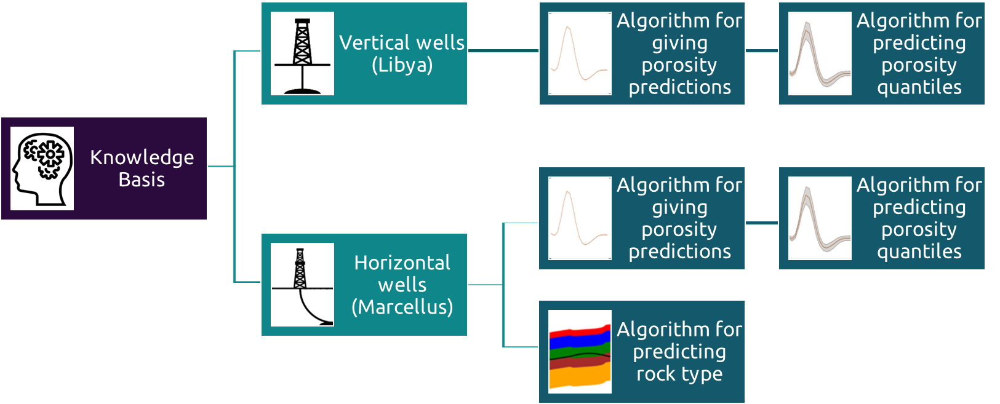

### **How were models developed?**

Although the developed algorithms are different in nature and purpose, they have all been developed using the same methodology. This methodology relies on the following steps: 

1. **Processing of wells data**:  First, a data processing stage was developed for each of the models. In this stage, several analyses were carried out and different methods were developed to ensure that all the data was properly cleaned for subsequent use. The main tasks in this data pre-processing stage are listed below:

    - Creation of dictionaries to rename columns due to inconsistencies in variable names and mnemonics.
    - Normalisation of column measurement units in Drill (FT/H → FT/HR, etc.).
    - Extraction of zones of interest based on Petro data.
    - Interpolate values to join Petro, Drill, Gas and Gamma Ray data sets over depth.
    - Identification and removal of outliers.

2. **Similarity analysis:** A similarity analysis was then performed between the variables of the wells available in the dataset. This allowed the identification of wells with variables showing anomalous behaviour and the optimisation of the training set to ensure the greatest possible generality of the models. 

3. **Models training**: Finally, using this training set and the code associated with each of the designed algorithms, the training processes of each of the models were carried out.

The below diagram shows the steps just explained.

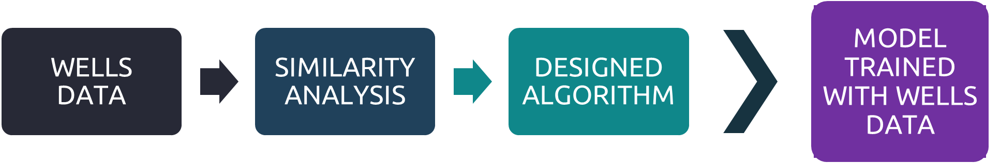

The design of these algorithms allows them to be easily exportable, so that their subsequent use is simple. This facilitates the process of applying the models to new wells. Further on, in section ***1. Applying developed models to new wells***, it will be explained in detail how to use these models for prediction tasks on new wells.

### **How can new wells be added to developed models?**

In addition to applying the models described above to new wells, their training datasets can also be extended to try to improve the models performance. 

In order to do this, the following methodology should be followed:

1. **Processing of the new data:** The data from the new wells should be analysed, cleaned and processed according to the work done on the original wells so that they match in format. It is crucial that the variables follow a standard nomenclature and measure units.  If this standard is not followed, the correct functioning of processing and cleaning data functions cannot be ensured

2. **Similarity analysis:** This step analyses and compares the similarity of the new wells to the wells previously used for training. It is crucial that these wells are similar to each other, because if they are not, including the data from the new wells would only add noise to the model.

3. **Re-training the models:** As long as the wells are similar to those originally used to train the models, they are re-trained using the code developed for each of the algorithms. 

All these steps are explained in the following figure: 

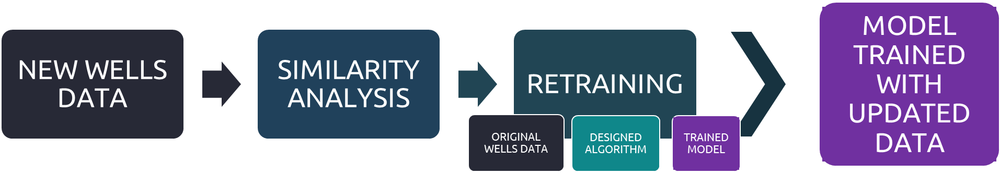

As before, once the models have been re-trained, they can be exported and applied to new well data to make predictions.

Section ***2. Adding new wells to developed models*** serves as a guide of the code to be executed to perform this process of adding new wells and re-training the models.


### **How can new models be created for other regions?**

On the other hand, the developed modelling work that has been made for creating Libya and Marcellus models can be replicated from scratch with wells from new geographical regions to create new models. 

To do this, the same methodology discussed above should be followed, as shown in the following diagram:

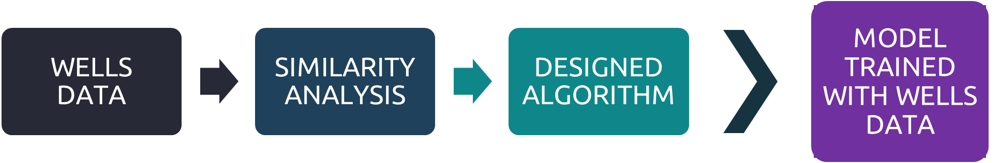

When carrying out these steps, it is important to carry out a thorough similarity analysis so that the training set is as uniform as possible and the models have the greatest possible generalisation capacity.

Section ***3. Creating new models for new geographies*** shows the steps to follow for this process of creating new models for different geographies.

Summarising and putting together all the diagrams shown above, we have the following scheme. This scheme shows the different possible strategies and steps to follow with the developed models, both in the case of wanting to extend the training sets of the models already developed, and in the case of wanting to create new models for other geographical regions.

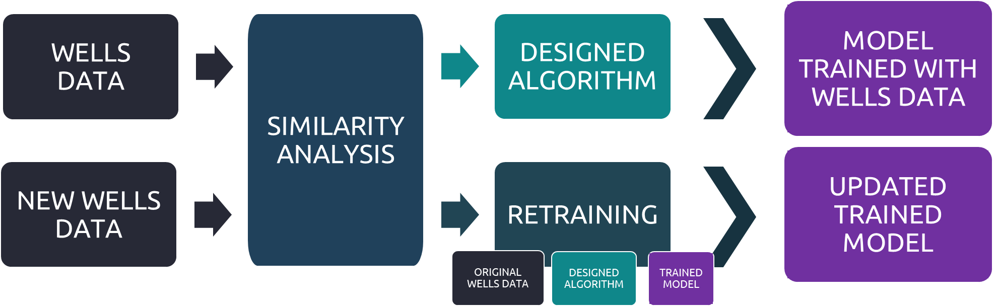


# 0. Setting up InGAIA

In this section, we delve into the essential components for the trouble-free execution of the notebook. You will be guided through the technical details of creating a proper Python environment, ensuring that all necessary dependencies are in place for a proper workflow. In addition, the configuration of global variables within the notebook will be explored, allowing you to customise and tailor the configuration to your specific requirements.

## 0.1. Setting up python environment and dependencies

### 0.1.1. Installing python version

Before executing this notebook, ensure that 64-bit Python 3.10 is installed on your system. If not, you can download it from the [official Python website](https://www.python.org/downloads/release/python-31011/) and follow the installation steps for your operating system.

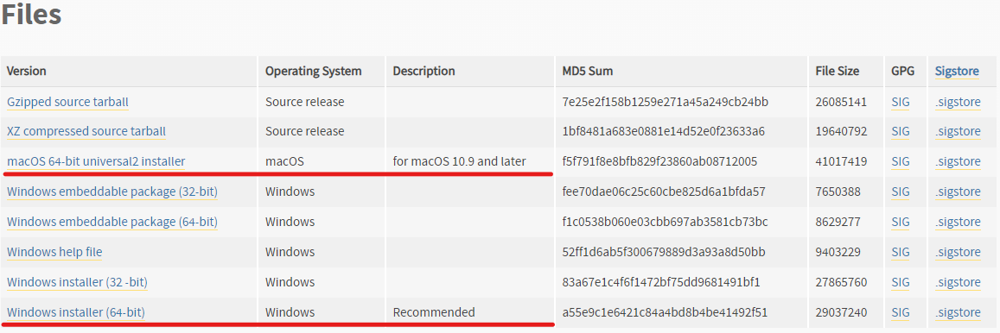

If 3.10 python version is correctly installed, the result of the following cell should start with 3.10.X.

In [12]:
import sys

sys.version

'3.10.11 (tags/v3.10.11:7d4cc5a, Apr  5 2023, 00:38:17) [MSC v.1929 64 bit (AMD64)]'

### 0.1.2. Setting up the environment

Before setting and creating the python environment, it is needed to know what system your machine is running on. The following cell displays the type of machine that you are using.

In [13]:
import sys
sys.platform

'win32'

#### A. Windows Systems

Once ensured that the appropiated python version is installed in your system, a virtual environment must be created for dealing with all package dependencies without coming into conflict with your system libraries.

For that purpose, follow the following steps: 

1. **Locate 3.10 python executable file**: This step is crutial for carrying out the remaining steps. Navigate through your system till finding the *python.exe* file associated to the 3.10 python version. The usual path for this file is the following:

          C:/Users/<your user>/AppData/Local/Programs/Python/Python310/python.exe

2. **Copy the python.exe path**. Once found the *python.exe* file, copy its path. This can be done right-clicking in the file, and selecting *Copy as path* option. In the following steps, this path will be refered to as *<python.exe path>*.

3. **Open a system terminal**: Press *Windows + R*, type *cmd* and press *Enter*, or use application menu for opening a system terminal.

4. **Navigate to the project root directory**: Use the *cd* command to navigate to the root directory of this project. For example:

           cd path/to/your/project/folder/CWS_DECOM_VS2

5. **Create the virtual enviroment**: For creating the virtual environment, execute the following commands:

           <python.exe path> -m venv ingaia_env

6. **Activate the virtual environment**: This can be done by running the below commands

           cd ingaia_env/Scripts
           activate
           cd ../..

9. **Install project dependencies**:

           pip install -r requirements/requirements.txt

8. **Install ipykernel and Set Up Jupyter Kernel**:

           pip install ipykernel
           python -m ipykernel install --user --name=ingaia_env


9. **Re-open the Notebook:**
    - After running the cell, close and reopen this notebook in the code platform you are using (e.g., Jupyter Notebook, Visual Studio Code).
    - Addittionally, if you are using Jupyter Notebook, restart your Jupyter Notebook server. You can do this by stopping the notebook server and launching it again. 
   
11. **Select the Correct Kernel:**
    - If you are using **Jupyter Notebook**, in the Jupyter interface, click on the ***Kernel*** menu. Choose ***Change Kernel*** and select ***Python (ingaia_env)*** or the name of your virtual environment.
    - If you are using **Visual Studio Code**, locate the kernel selector in the top-right corner of the notebook editor. Click on the kernel name and choose ***ingaia_env (Python 3.10.0)*** or the name of your virtual environment.

11. **Run the Notebook:** Now you're ready to run the notebook with the selected kernel.

If you encounter any issues, read the following articles for a better understanding of virtual environments:
   - [Virtual environments in Visual Studio](https://code.visualstudio.com/docs/datascience/jupyter-kernel-management#:~:text=You%20can%20open%20the%20kernel,Notebook%3A%20Select%20Notebook%20Kernel%20command.&text=Note%3A%20In%20the%20previous%20versions,all%20available%20kernels%20by%20default.)
   - [Virtual environments in Jupyter Notebook](https://www.geeksforgeeks.org/using-jupyter-notebook-in-virtual-environment/)


#### B. Linux/Unix Systems

Once ensured that the appropiated python version is installed in your system, a virtual environment must be created for dealing with all package dependencies without coming into conflict with your system libraries.

For that purpose, follow the following steps: 

1. **Be sure that you have super-user rights**: Super-user rights will be needed for installing virtual environments tools, so make sure you have super-user rights in your user profile.

2. **Open a system terminal**: Press *Ctrl + Alt + T* or use application menu for opening a system terminal.

3. **Navigate to the project root directory**: Use the *'cd'* command to navigate to the root directory of this project. For example:

           cd path/to/your/project/folder/CWS_DECOM_V2

4. **Install venv package**: For creating the virtual environment, venv package needs to be installed. Run the following commands:

           sudo apt-get update  
           sudo apt-get install python3-venv

5. **Create the virtual enviroment**: For creating the virtual environment, execute the following commands:

           python3.10 -m venv ingaia_env

6. **Activate the virtual environment**: This can be done by running:

           source ingaia_env/bin/activate

7. **Install project dependencies**:

           source ingaia_env/bin/activate
           pip install -r requirements/requirements.txt

8. **Install ipykernel and Set Up Jupyter Kernel**:

           pip install ipykernel
           python -m ipykernel install --user --name=ingaia_env

9. **Re-open the Notebook:**
   - After running the cell, close and reopen this notebook in the code platform you are using (e.g., Jupyter Notebook, Visual Studio Code).
   - Addittionally, if you are using Jupyter Notebook, restart your Jupyter Notebook server. You can do this by stopping the notebook server and launching it again. 
   10. **Select the Correct Kernel:**
    - If you are using **Jupyter Notebook**, in the Jupyter interface, click on the ***Kernel*** menu. Choose ***Change Kernel*** and select ***Python (ingaia_env)*** or the name of your virtual environment.
    - If you are using **Visual Studio Code**, locate the kernel selector in the top-right corner of the notebook editor. Click on the kernel name and choose ***ingaia_env (Python 3.10.0)*** or the name of your virtual environment.

11. **Run the Notebook:** Now you're ready to run the notebook with the selected kernel.

If you encounter any issues, read the following articles for a better understanding of virtual environments:
   - [Virtual environments in Visual Studio](https://code.visualstudio.com/docs/datascience/jupyter-kernel-management#:~:text=You%20can%20open%20the%20kernel,Notebook%3A%20Select%20Notebook%20Kernel%20command.&text=Note%3A%20In%20the%20previous%20versions,all%20available%20kernels%20by%20default.)
   - [Virtual environments in Jupyter Notebook](https://www.geeksforgeeks.org/using-jupyter-notebook-in-virtual-environment/)

### 0.1.3. Importing dependencies

If everything has been propperly installed and activated, the execution of the following cell should not give any error.

In [21]:
import matplotlib.pyplot
import numpy
import os
import pandas
import sklearn.metrics
import sys
import warnings
import welly

sys.path.append('../..')
%matplotlib inline


import src.config.core
import src.curtains_model.predict_model
import src.curtains_model.train_model
import src.data.make_curtains_dataset
import src.data.make_porosity_dataset
import src.data_modelling.curtain_along_depth_analysis
import src.data_modelling.error_along_depth_analysis
import src.data_modelling.quantiles_along_depth_analysis
import src.data_modelling.utils
import src.data_modelling.well_similarity
import src.data_processing.curtains_processing
import src.plot_welly.plot_wellys
import src.porosity_model.predict_model
import src.porosity_model.train_model
import src.porosity_quantiles_model.predict_model
import src.porosity_quantiles_model.train_model
import src.processing.training_processing
import src.utils.utils

## 0.2. Setting up the notebook

Once the virtual environment has been created and activated for running this notebook, several global parameters must be set for the propper execution of the cells.

The following cell serves as the control center for configuring the global parameters of this notebook. These settings must be customized according to the modelling goals, including:

- **Geographical Zone**: Specify the zone where the data belongs, whether it be 'Libya' or 'Marcellus'. In this notebook, we will be working with the Marcellus zone. 

- **Output path**: Specifies the path where outputs will be saved. By default, it is:

        CWS_DECOM_VS2/outputs/InGAIA Learning/Marcellus/


In [22]:
zone = 'Marcellus' 

output_path = os.path.join(
    src.config.core.ROOT,
    src.config.core.config.outputs_folder,
    "InGAIA Learning",
    zone
)

Once all the configuration cells have been successfully executed, you can proceed to execute the cells associated with each of the different strategies available in the Marcellus region.

# 1. Applying developed models to new wells

##  Introduction

The main objective of the InGAIA project in the Marcellus region was to develop machine learning algorithms for predicting the following goals: 

| Goal | Description  |
|:-------------------------|:--------------------------|
| Porosity prediction | Given different drilling data (Torque, RPM, Gases, Gamma Ray, ...) we seek to give a prediction of the porosity value to optimise extractions.    | 
| Detection of variability in porosity predictions | Given the porosity prediction, the aim is to quantify the variability of the porosity. | 
| Classification of rock typologies | Given different drilling data (Torque, RPM, Gases, Gamma Ray, ...), a classification of the rock typology in the borehole is sought in order to maintain the stability of the drilling trajectory and reduce risks.    |

After a process of study and testing, it was decided to use each of the following methodologies to solve each problem:

1. **Porosity prediction**: The central predictor used was XGBoost, which uses a strong learning machine to perform the prediction task. XGBoost is a popular model based on the *gradient boosting* technique, which is known for its high efficiency and prediction accuracy. In addition, hyper-parameter optimisation has been applied to find the best combination of values resulting in optimal model performance. Bayesian optimisation algorithms and cross-validation techniques were used for this purpose.


2. **Quantile calculation to determine the variability in porosity predictions**: An algorithm was developed to provide the degree of variability of the predictions by providing a confidence interval of the porosity value. This was done by running a regression on the 5th, 50th and 95th quantiles of porosity. This modelling was carried out using the QXGBoost method, _quantile extreme gradient boosting_, which combines regression with XGBoost.


3. **Rock types classification**: As in the case of porosity prediction, XGBoost was used as the central predictor. Bayesian optimisation algorithms, cross-validation techniques and data balancing techniques such as SMOTE were also used to ensure the correct balance of classes to be predicted. It should be noted that, on the recommendation of E&P, it was decided to consider only 2 of the 4 rock classification cases studied in the first part of the project, namely cases 2 and 3. 

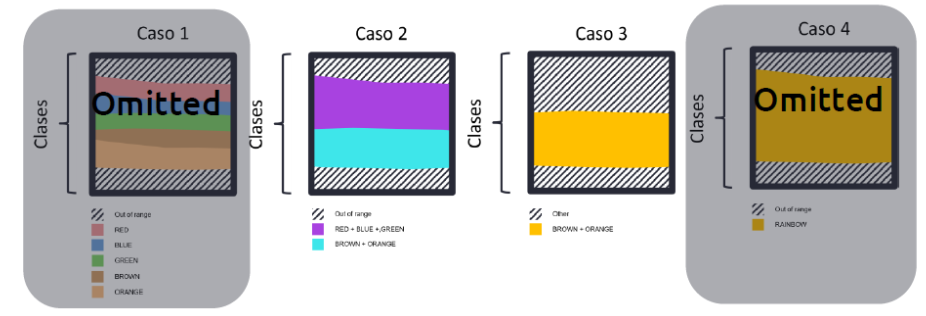

These rock classification cases were based on the merging of the classes in order to obtain a balanced training dataset for each of the classes. Therefore, the resulting classes of each curtains case were the following: 

| Curtains case | Class | Description | 
|:-------------:|:-------------:|:-------------| 
| 2 | Class 0 | Above rainbow | 
| 2 | Class 1 | Red + Blue + Green | 
| 2 | Class 2 | Brown + Orange | 
| 3 | Class 0 | Above rainbow + Red + Blue + Green | 
| 3 | Class 1 | Brown + Orange | 

The study showed that the best results were obtained when the models were trained with the following set of wells and features: 

|||
|:-|:----------------|
|**Discarded** | ALDERSON_05_269_7H, DCNR_587_02_5H, DCNR_587_02_9H, DCNR_587_02_11H, DCNR_587_02_13H, DCNR_587_02_15H, JOHNSON_02_135_1H, JOHNSON_02_135_7H, JOHNSON_02_135_13H JOHNSON_02_135_14H, OMR_02_188_4H, OMR_02_188_3H, SHAW_05_272_8H | 
|**Training** | WARNER_05_121_9H, CLDC_02_177_9H, CLDC_02_177_7H, CLDC_02_177_10H, CLDC_02_177_11H, HARALAMBOUS_03_074_10H, HARALAMBOUS_03_074_16H, MORGAN_01_074_9H, SHAW_05_272_7H, SHAW_05_272_2H, WARNER_05_121_1H, WARNER_05_121_7H | 
|**Validation**| CLDC_02_177_8H, CUMMINGS_01_081_7H, MORGAN_01_074_6H  |



| Prediction goal | Model features | 
|:--|:-|
| Porosity | ROP, GR |
| Porosity quantiles | ROP, GR |
| Curtains case 2 | GR, C2, RPM |
| Curtains case 3 | TORQUE, ROP, FLOW, RPM, WOB, SPP, TOTAL_GAS, GR |


Once trained and validated, these models were exported and saved as *.pkl* format files. These files can be found in the *CWS_DECOM_VS2/models/Marcellus/* folder and are ready for use on new wells in the Marcellus region. 

### Developed algorithms objective

The algorithms that we are going to detail below have been trained with a set of wells from the Marcellus region which, due to their similarity, have taught the algorithms to predict based on the experience of past wells. This algorithms will be able to predict the behaviour of a new well as long as this new well has a similar behaviour to the wells with which the algorithms was trained. 

Therefore, in case we want to test the algorithm:

1. With a well for which we already have all the information of the navigation results, it is advisable to check the similarity of this well with respect to the training wells.

2. With a well in real time for which we do not have the navigation information, we can detect two types of situations: 

    a. If the new well is similar to the training wells, the algorithm will be able to provide valuable predictions to the geosteerers.

    b. If the new well is **NOT** similar to the training wells, the algorithm will not be able to provide correct predictions.

### Steps to follow

The following diagram outlines the sequential process of steps that must be followed for applying the developed models on new wells.

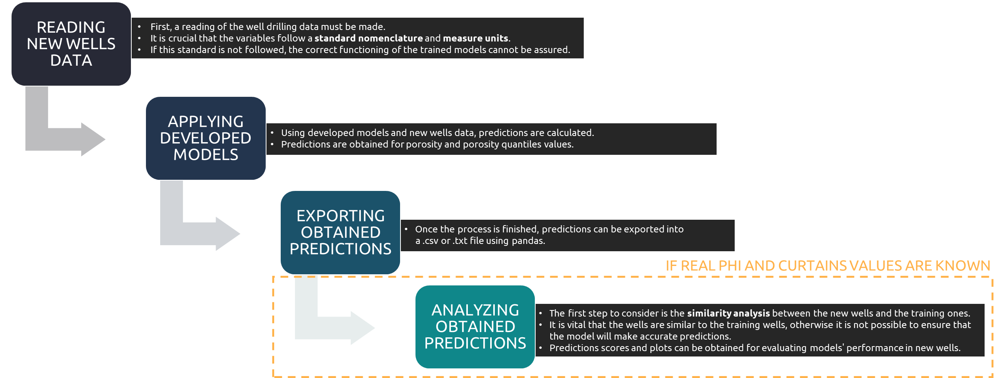

### Configuration parameters

Taking into account the details explained in the previous sections, and in order to make the development of the next sections easier to understand, the following configuration parameters need to be created.

In [3]:
## In this variable, we list the IDs of the wells used for training the developed models
wells_used_for_training_the_developed_models = [
    'CLDC_02_177_9H',
    'CLDC_02_177_7H',
    'CLDC_02_177_10H',
    'CLDC_02_177_11H',
    'HARALAMBOUS_03_074_10H',
    'HARALAMBOUS_03_074_16H',
    'MORGAN_01_074_9H',
    'SHAW_05_272_7H',
    'SHAW_05_272_2H',
    'WARNER_05_121_1H',
    'WARNER_05_121_9H',
    'WARNER_05_121_7H',
]

# 1. Porosity models parameters

## This variable shows the name of the .pkl file associated to the porosity model
developed_phi_model_name = 'XGBoost' 

## This variable shows the name of the .pkl file associated to the porosity quantile 0.05 model
developed_phi_05_model_name = 'XGBQuantile_0.05_pinball'

## This variable shows the name of the .pkl file associated to the porosity quantile 0.50 model
developed_phi_50_model_name = 'XGBQuantile_0.5_pinball'

## This variable shows the name of the .pkl file associated to the porosity quantile 0.95 model
developed_phi_95_model_name = 'XGBQuantile_0.95_pinball'

## This variable lists the drilling parameters used for training the developed models.
features_used_for_training_developed_porosity_model = [
    'ROP',
    'GR',
]

# 2. Curtains case 2 parameters

## This variable lists the drilling parameters used for training the developed models for case 2 curtains
features_used_for_training_developed_curtains_2_model = [
    'GR',
    'C2',
    'RPM',
]

## This variable shows the name of the .pkl file associated to the case 2 curtains model
developed_curtains_2_model_name = 'XGBoost'

# 3. Curtains case 3 parameters

## This variable lists the drilling parameters used for training the developed models for case 3 curtains
features_used_for_training_developed_curtains_3_model = [
    'TORQUE',
    'ROP',
    'FLOW', 
    'RPM',
    'WOB',
    'SPP', 
    'TOTAL_GAS',
    'GR',
]

## This variable shows the name of the .pkl file associated to the case 3 curtains model
developed_curtains_3_model_name = 'XGBoost'

## 1.1. Reading new wells data

The first step in applying the developed models to new wells is to import the data from the new wells. This process is left to the user's choice as the file format in which the data is stored can vary greatly. Once read, it must be transformed into a ***pandas.DataFrame()*** object where each column is a drilling variable and each row is a depth sample of the well. 

For the expected performance of the models, the following variables, matching the name and measure units, must be available for each of the wells:
    
<div style="display: flex; justify-content: center; align-items: center;">

| Variable              | Variable name                  | Measure unit           |
|--------------------------|---------------------------|------------------------|
| Depth                    | DEPTH                     | ft |
| Gamma Ray                | GR                        | gAPI |
| Rate of Penetration      | ROP                       | ft/h |
| Flow                     | FLOW                      | gpm |
| Weight on Bit            | WOB                       | klbf |
| Revolutions per Minute   | RPM                       | rpm |
| Standpipe Pressure       | SPP                       | psi |
| Torque                   | TORQUE                    | kft.lbf |
| C1 Gas                   | C1                        | ppm |
| C2 Gas                   | C2                        | ppm |
| C3 Gas                   | C3                        | ppm |
| C4 Gas                   | C4                        | ppm |
| C5 Gas                   | C5                        | ppm |
| Total Gas                | TOTAL_GAS                 | ppm |

</div> 


In our case, we will use an example well called *MARCELLUS_EXAMPLE_WELL* whose information can be found in a *.csv* file located inside the folder *CWS_DECOM_VS2/Notebooks/InGAIA Learning/EXAMPLE_FILES*.

In [4]:
new_well_id = 'MARCELLUS_EXAMPLE_WELL'

new_well_data_path  = os.path.join(
    'EXAMPLE_FILES',
    '6242ft_14574ft_MARCELLUS_EXAMPLE_WELL.csv'
)

new_well_df = pandas.read_csv(
    new_well_data_path,
    sep=',',
)

new_well_df.head()

,DEPTH,TORQUE,ROP,FLOW,RPM,WOB,SPP,C1,C2,C3,C4,C5,IC4,NC4,TOTAL_GAS,GR
0,6242.0,6.5010000000,146.7000000000,550.39,160.0000000000,30.6000000000,2950.0400000000,5.4746532534,3.7481880270,0.0000000000,3.3617278360,0,2.6989700043,3.2552725051,5.4892551684,175.3000000000
1,6243.0,6.7984036778,142.5660888787,550.39,160.0000000000,30.6499548381,3022.7551992194,5.4924683702,3.7558089110,0.0000000000,3.3617278360,0,2.6989700043,3.2552725051,5.5066269006,179.8205359024
2,6244.0,6.9538274817,126.8402065800,550.39,161.9990967628,30.6999096763,3023.6860969930,5.4955436483,3.7558748557,1.1548134072,3.3802194139,0,2.6990092297,3.2787536010,5.5098737393,181.6945342506
3,6245.0,6.5757963250,149.2054006695,550.39,160.0198760469,30.5019876047,2949.3960474222,5.4940305961,3.7558748557,1.4558434028,3.3977673332,0,2.7774313159,3.2787536010,5.5086764039,191.6302222443
4,6246.0,6.3322073544,157.8726993963,550.39,159.0008639768,30.0004319884,2914.2497467201,5.4844505704,3.7403763337,1.6319346619,3.3979400087,0,2.7781512504,3.2552933502,5.4990078074,204.4989583769


Once the new well data has been imported, visualizations of the variables can be plotted to check that everything is in order. 

The following cell shows how to plot all the available variables in the just imported well along its depth.

C:\Users\dgonza22\OneDrive - Capgemini\Desktop\Repsol\CWS_DECOM_V2\.venv\lib\site-packages\welly\curve.py:470: FutureWarning: RangeIndex.is_numeric is deprecated. Use pandas.api.types.is_any_real_numeric_dtype instead
  if self.df.index.is_numeric() and not self.df.index.empty:


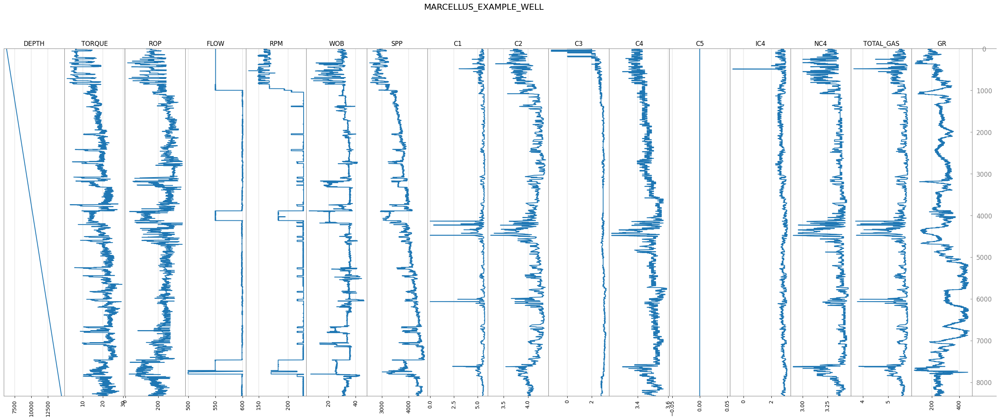

In [5]:
new_well_df["MD"] = new_well_df["DEPTH"]

src.plot_welly.plot_wellys.plot_well(
    welly.Well().from_df(
    new_well_df,
    name=new_well_id
    )
)

new_well_df['well_id'] = new_well_id

## 1.2. Making predicitions to new wells data

Now that the well data has been imported and transformed into the specified format, it is possible to make predictions using the developed models.

For this purpose, we will use the ***predict*** functions of the respective packages ***src.porosity_model.predict_model***, ***src.porosity_quantiles_model.predict_model*** and ***src.curtains_model.predict_model***.

### 1.2.1. Making porosity values and quantiles predictions

In [6]:
import src.porosity_model.predict_model

help(src.porosity_model.predict_model.predict)

Help on function predict in module src.porosity_model.predict_model:

predict(*, input_data: Union[numpy.ndarray, pandas.core.frame.DataFrame], model_name: str, zone: str) -> numpy.ndarray
    Make a prediction using a saved porosity model.
    
    Parameters:
        - input_data (typing.Union[numpy.ndarray, pandas.DataFrame]): The input data for prediction,
        which can be either a numpy array or a pandas DataFrame.
        - model_name (str): The name of the model to load.
        - zone (str): The zone to which the data belongs.
    
    Returns:
        - numpy.ndarray: The prediction made using the saved porosity model.



In [7]:
import src.porosity_quantiles_model.predict_model

help(src.porosity_quantiles_model.predict_model.predict)

Help on function predict in module src.porosity_quantiles_model.predict_model:

predict(*, input_data: Union[numpy.ndarray, pandas.core.frame.DataFrame], model_name: str, zone: str, scaling_yml_file_name: str = '', scale_input_data: bool = True, scale_output_data: bool = True) -> numpy.ndarray
    Make a prediction of a quantile using a saved model.
    
    Parameters:
        - input_data (typing.Union[numpy.ndarray, pandas.DataFrame]): The input data for prediction,
        which can be either a numpy array or a pandas DataFrame.
        - model_name (str): The name of the model to load.
        - zone (str): The zone to which the data belongs.
        - scaling_yml_file_name (str, optional): The name of the YAML file used for scaling.
        - scale_input_data (bool, optional): Whether to scale the input data. Default is True.
        - scale_output_data (bool, optional): Whether to scale the output data. Default is True.
    
    Returns:
        - numpy.ndarray: The prediction o

Using each the ***predict*** functions mentioned for each case, the processes of obtaining porosity values and quantiles predictions, and each curtains case predictions are straightforward.

In [8]:
new_well_phi_predictions = src.porosity_model.predict_model.predict(
    zone=zone, 
    input_data=new_well_df,
    model_name=developed_phi_model_name
)

new_well_phi_05_predictions = src.porosity_quantiles_model.predict_model.predict(
    zone=zone, 
    input_data=new_well_df,
    model_name=developed_phi_05_model_name
)

new_well_phi_50_predictions = src.porosity_quantiles_model.predict_model.predict(
    zone=zone, 
    input_data=new_well_df,
    model_name=developed_phi_50_model_name
)

new_well_phi_95_predictions = src.porosity_quantiles_model.predict_model.predict(
    zone=zone, 
    input_data=new_well_df,
    model_name=developed_phi_95_model_name
)

new_well_phi_predictions, new_well_phi_05_predictions, new_well_phi_50_predictions, new_well_phi_95_predictions

(array([0.07244855, 0.07320379, 0.07352446, ..., 0.07358877, 0.07389431,
        0.07389431], dtype=float32),
 array([0.05894974, 0.05286476, 0.05200958, ..., 0.05475324, 0.05140465,
        0.05140465], dtype=float32),
 array([0.07595406, 0.07590487, 0.07722874, ..., 0.07659817, 0.07661143,
        0.07661143], dtype=float32),
 array([0.09282239, 0.09179382, 0.09922548, ..., 0.09671748, 0.09619065,
        0.09619065], dtype=float32))

In [9]:
new_well_df_with_predictions = new_well_df.copy()

new_well_df_with_predictions["PHI_PRED"] = new_well_phi_predictions
new_well_df_with_predictions["PHI_PRED_0.05"] = new_well_phi_05_predictions
new_well_df_with_predictions["PHI_PRED_0.5"] = new_well_phi_50_predictions
new_well_df_with_predictions["PHI_PRED_0.95"] = new_well_phi_95_predictions

new_well_df_with_predictions.head()

,DEPTH,TORQUE,ROP,FLOW,RPM,WOB,SPP,C1,C2,C3,...,IC4,NC4,TOTAL_GAS,GR,MD,well_id,PHI_PRED,PHI_PRED_0.05,PHI_PRED_0.5,PHI_PRED_0.95
0,6242.0,6.5010000000,146.7000000000,550.39,160.0000000000,30.6000000000,2950.0400000000,5.4746532534,3.7481880270,0.0000000000,...,2.6989700043,3.2552725051,5.4892551684,175.3000000000,6242.0,MARCELLUS_EXAMPLE_WELL,0.0724485517,0.0589497387,0.0759540573,0.0928223878
1,6243.0,6.7984036778,142.5660888787,550.39,160.0000000000,30.6499548381,3022.7551992194,5.4924683702,3.7558089110,0.0000000000,...,2.6989700043,3.2552725051,5.5066269006,179.8205359024,6243.0,MARCELLUS_EXAMPLE_WELL,0.0732037872,0.0528647564,0.0759048685,0.0917938203
2,6244.0,6.9538274817,126.8402065800,550.39,161.9990967628,30.6999096763,3023.6860969930,5.4955436483,3.7558748557,1.1548134072,...,2.6990092297,3.2787536010,5.5098737393,181.6945342506,6244.0,MARCELLUS_EXAMPLE_WELL,0.0735244602,0.0520095788,0.0772287399,0.0992254764
3,6245.0,6.5757963250,149.2054006695,550.39,160.0198760469,30.5019876047,2949.3960474222,5.4940305961,3.7558748557,1.4558434028,...,2.7774313159,3.2787536010,5.5086764039,191.6302222443,6245.0,MARCELLUS_EXAMPLE_WELL,0.0743966699,0.0596877635,0.0807277858,0.0935235545
4,6246.0,6.3322073544,157.8726993963,550.39,159.0008639768,30.0004319884,2914.2497467201,5.4844505704,3.7403763337,1.6319346619,...,2.7781512504,3.2552933502,5.4990078074,204.4989583769,6246.0,MARCELLUS_EXAMPLE_WELL,0.0725548342,0.0454634279,0.0793493018,0.0998194143


As with the well variables, the porosity predictions can also be plotted along the depth of the well. The next cell shows how they can be visualised.

C:\Users\dgonza22\OneDrive - Capgemini\Desktop\Repsol\CWS_DECOM_V2\.venv\lib\site-packages\welly\curve.py:470: FutureWarning: RangeIndex.is_numeric is deprecated. Use pandas.api.types.is_any_real_numeric_dtype instead
  if self.df.index.is_numeric() and not self.df.index.empty:


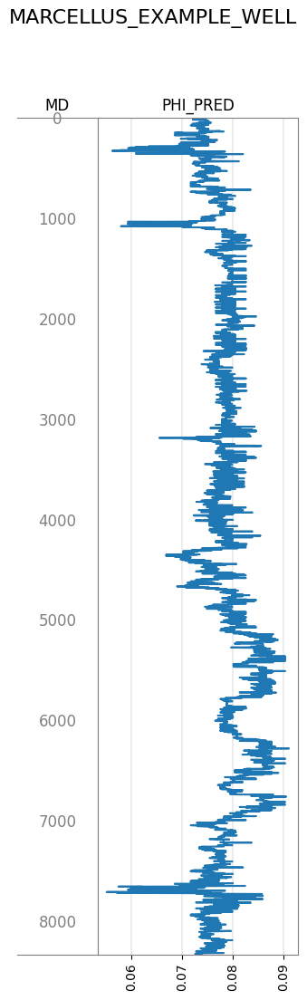

In [10]:
new_well_df_with_predictions["MD"] = new_well_df_with_predictions["DEPTH"]

src.plot_welly.plot_wellys.plot_well(
    welly.Well().from_df(
    new_well_df_with_predictions[["MD","PHI_PRED"]],
    name=new_well_id
    )
)

### 1.2.2. Making curtains predictions

The process for making case 2 and case 3 curtains predictions is similar in both cases. This process relies on using the ***predict*** function of the package ***src.curtains_model.predict_model***, as detailed before. 

In [11]:
import src.curtains_model.predict_model

help(src.curtains_model.predict_model.predict)

Help on function predict in module src.curtains_model.predict_model:

predict(*, input_data: numpy.ndarray, curtains_case: int, model_name: str, zone: str = 'Marcelus') -> Dict[str, numpy.ndarray]
    Make a curtains prediction choosing the curtains case.
    
    Parameters:
        - input_data (numpy.ndarray): The input data for prediction.
        - curtains_case (int): The case number for the curtains predictor.
        - model_name (str): The name of the model to load.
        - zone (str, optional): The zone to which the data belongs. Default is 'Marcellus'.
    
    Returns:
        - dict[str, numpy.ndarray]: A dictionary of curtains predictions, including curtains values and KPIs.



Using this ***predict*** function, curtains predictions and predictions KPIs for the **case 2** can be obtained as follows:

In [12]:
curtains_case_2_predictions = src.curtains_model.predict_model.predict(
    curtains_case=2,
    zone=zone,
    input_data=new_well_df,
    model_name=developed_curtains_2_model_name
)

curtains_case_2_predictions

{'CURTAINS': array([0, 0, 0, ..., 1, 1, 1], dtype=int64),
 'PROB_CLASS_0': array([0.85517603, 0.85517603, 0.85517603, ..., 0.28562853, 0.2668311 ,
        0.2668311 ], dtype=float32),
 'PROB_CLASS_1': array([0.11059754, 0.11059754, 0.11059754, ..., 0.5440114 , 0.54908824,
        0.54908824], dtype=float32),
 'PROB_CLASS_2': array([0.03422641, 0.03422641, 0.03422641, ..., 0.17036003, 0.1840806 ,
        0.1840806 ], dtype=float32),
 'MAX_PROB': array([0.85517603, 0.85517603, 0.85517603, ..., 0.5440114 , 0.54908824,
        0.54908824], dtype=float32)}

These curtains predictions can be added easily to the dataframe that contains all the predictions. To avoid confusion with the predictions of the other curtains case, we will add the prefix "CURTAINS_2" to each of the columns resulting from the predictions.

The following cell shows how to carry out this step.

In [13]:
renamed_curtains_case_2_keys = ['CASE_2_' + key for key in curtains_case_2_predictions.keys()] 

renamed_curtains_case_2_predictions = dict(zip(renamed_curtains_case_2_keys, curtains_case_2_predictions.values()))

renamed_curtains_case_2_predictions

new_well_df_with_predictions = new_well_df_with_predictions.assign(**renamed_curtains_case_2_predictions)

new_well_df_with_predictions.head()

,DEPTH,TORQUE,ROP,FLOW,RPM,WOB,SPP,C1,C2,C3,...,well_id,PHI_PRED,PHI_PRED_0.05,PHI_PRED_0.5,PHI_PRED_0.95,CASE_2_CURTAINS,CASE_2_PROB_CLASS_0,CASE_2_PROB_CLASS_1,CASE_2_PROB_CLASS_2,CASE_2_MAX_PROB
0,6242.0,6.5010000000,146.7000000000,550.39,160.0000000000,30.6000000000,2950.0400000000,5.4746532534,3.7481880270,0.0000000000,...,MARCELLUS_EXAMPLE_WELL,0.0724485517,0.0589497387,0.0759540573,0.0928223878,0,0.8551760316,0.1105975360,0.0342264064,0.8551760316
1,6243.0,6.7984036778,142.5660888787,550.39,160.0000000000,30.6499548381,3022.7551992194,5.4924683702,3.7558089110,0.0000000000,...,MARCELLUS_EXAMPLE_WELL,0.0732037872,0.0528647564,0.0759048685,0.0917938203,0,0.8551760316,0.1105975360,0.0342264064,0.8551760316
2,6244.0,6.9538274817,126.8402065800,550.39,161.9990967628,30.6999096763,3023.6860969930,5.4955436483,3.7558748557,1.1548134072,...,MARCELLUS_EXAMPLE_WELL,0.0735244602,0.0520095788,0.0772287399,0.0992254764,0,0.8551760316,0.1105975360,0.0342264064,0.8551760316
3,6245.0,6.5757963250,149.2054006695,550.39,160.0198760469,30.5019876047,2949.3960474222,5.4940305961,3.7558748557,1.4558434028,...,MARCELLUS_EXAMPLE_WELL,0.0743966699,0.0596877635,0.0807277858,0.0935235545,0,0.8559743762,0.1090864614,0.0349391326,0.8559743762
4,6246.0,6.3322073544,157.8726993963,550.39,159.0008639768,30.0004319884,2914.2497467201,5.4844505704,3.7403763337,1.6319346619,...,MARCELLUS_EXAMPLE_WELL,0.0725548342,0.0454634279,0.0793493018,0.0998194143,0,0.8363325000,0.1338767409,0.0297907777,0.8363325000


In the same way, **case 3** curtains predictions and KPIs can be obtained and merged to the new well dataframe containing all predictions as follows.

In [14]:
curtains_case_3_predictions = src.curtains_model.predict_model.predict(
    curtains_case=3,
    zone=zone,
    input_data=new_well_df,
    model_name=developed_curtains_3_model_name
)

renamed_curtains_case_3_keys = ['CASE_3_' + key for key in curtains_case_3_predictions.keys()] 

renamed_curtains_case_3_predictions = dict(zip(renamed_curtains_case_3_keys, curtains_case_3_predictions.values()))

new_well_df_with_predictions = new_well_df_with_predictions.assign(**renamed_curtains_case_3_predictions)

new_well_df_with_predictions.head()

,DEPTH,TORQUE,ROP,FLOW,RPM,WOB,SPP,C1,C2,C3,...,PHI_PRED_0.95,CASE_2_CURTAINS,CASE_2_PROB_CLASS_0,CASE_2_PROB_CLASS_1,CASE_2_PROB_CLASS_2,CASE_2_MAX_PROB,CASE_3_CURTAINS,CASE_3_PROB_CLASS_0,CASE_3_PROB_CLASS_1,CASE_3_MAX_PROB
0,6242.0,6.5010000000,146.7000000000,550.39,160.0000000000,30.6000000000,2950.0400000000,5.4746532534,3.7481880270,0.0000000000,...,0.0928223878,0,0.8551760316,0.1105975360,0.0342264064,0.8551760316,0,0.9999898672,0.0000101129,0.9999898672
1,6243.0,6.7984036778,142.5660888787,550.39,160.0000000000,30.6499548381,3022.7551992194,5.4924683702,3.7558089110,0.0000000000,...,0.0917938203,0,0.8551760316,0.1105975360,0.0342264064,0.8551760316,0,0.9999898672,0.0000101129,0.9999898672
2,6244.0,6.9538274817,126.8402065800,550.39,161.9990967628,30.6999096763,3023.6860969930,5.4955436483,3.7558748557,1.1548134072,...,0.0992254764,0,0.8551760316,0.1105975360,0.0342264064,0.8551760316,0,0.9999874830,0.0000125297,0.9999874830
3,6245.0,6.5757963250,149.2054006695,550.39,160.0198760469,30.5019876047,2949.3960474222,5.4940305961,3.7558748557,1.4558434028,...,0.0935235545,0,0.8559743762,0.1090864614,0.0349391326,0.8559743762,0,0.9999827147,0.0000172906,0.9999827147
4,6246.0,6.3322073544,157.8726993963,550.39,159.0008639768,30.0004319884,2914.2497467201,5.4844505704,3.7403763337,1.6319346619,...,0.0998194143,0,0.8363325000,0.1338767409,0.0297907777,0.8363325000,0,0.9999955893,0.0000044150,0.9999955893


In order to be able to interpret these predictions correctly, it is necessary to remember the following legend for each of the cases: 

| Curtains case | Class | Description | 
|:-------------:|:-------------:|:-------------| 
| 2 | 0 | Above rainbow | 
| 2 | 1 | Red + Blue + Green | 
| 2 | 2 | Brown + Orange | 
| 3 | 0 | Above rainbow + Red + Blue + Green | 
| 3 | 1 | Brown + Orange | 

Finally, as with porosity predictions, curtain predictions can be plotted against well depth. The following cells show how this can be done.

C:\Users\dgonza22\OneDrive - Capgemini\Desktop\Repsol\CWS_DECOM_V2\.venv\lib\site-packages\welly\curve.py:470: FutureWarning: RangeIndex.is_numeric is deprecated. Use pandas.api.types.is_any_real_numeric_dtype instead
  if self.df.index.is_numeric() and not self.df.index.empty:


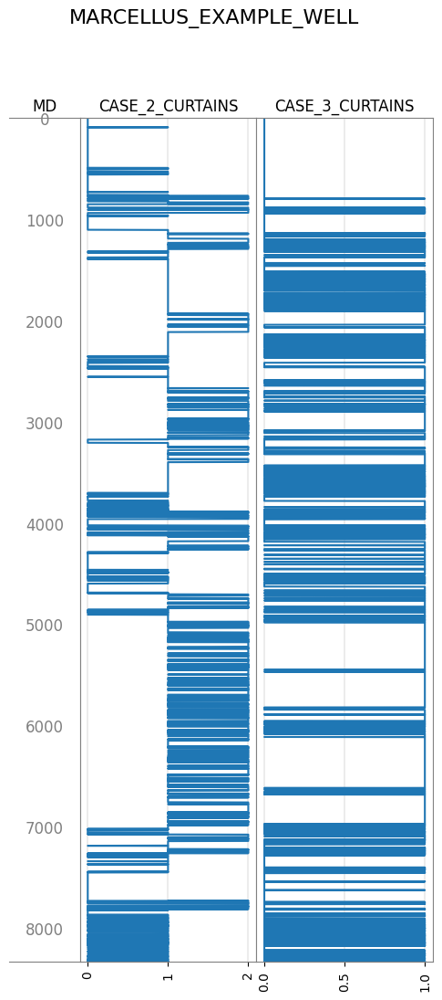

In [15]:
src.plot_welly.plot_wellys.plot_well(
    welly.Well().from_df(
    new_well_df_with_predictions[["MD","CASE_2_CURTAINS", "CASE_3_CURTAINS"]],
    name=new_well_id
    )
)

## 1.3. Export obtained predictions

All information from the well can be exported together with the predictions made. This can be done using any of the export methods in the Pandas package ([Exporting a DataFrame using Pandas](https://practicaldatascience.co.uk/data-science/how-to-export-data-from-pandas-dataframes)).

For example, the next cell shows how to export the data into a *.csv* file.

In [16]:
new_well_df_with_predictions.to_csv(
    os.path.join(
        output_path,
        "PREDICTIONS",
        f"{new_well_id}_predictions.csv"
    ),
    sep=',',
    index=False
)

## 1.4. Analyzing obtained predictions, if real PHI and curtains values are known

Once the predictions for the well have been made and the drilling activity for the well has been completed, an analysis of obtained predictions can be mode. 

In order to perform this analysis it is necessary to have the actual porosity values and curtainz available so that comparisons can be made between actual and predicted values.

The first step in the analysis is to import the data containing the actual porosity values. It is important to note that this data must contain information about the depth of each sample using the DEPTH variable, measured in feet, and it is also important that the porosity is named PHI and its unit of measurement is m3/m3.

In [17]:
new_well_porosity_data_path  = os.path.join(
    'EXAMPLE_FILES',
    '6242ft_14574ft_MARCELLUS_EXAMPLE_WELL_PHI.csv'
)

new_well_porosity = pandas.read_csv(
    new_well_porosity_data_path,
    sep=',',
    skiprows=[1]
)

new_well_porosity.head()

,DEPTH,PHI
0,6243.0,0.0700
1,6244.0,0.0664
2,6245.0,0.0627
3,6246.0,0.0593
4,6247.0,0.0567


The second step is to import the file containing the information on the actual values of the rock types in the well drilling. 

In our case, this information is contained in a file called ***MARCELLUS_EXAMPLE_WELL_CURTAINS***, with the following structure.

In [18]:
new_well_curtains_data_path = os.path.join(
    'EXAMPLE_FILES',
    'MARCELLUS_EXAMPLE_WELL_CURTAINS.csv'
)

new_well_curtains = pandas.read_csv(
    new_well_curtains_data_path,
    sep=',',
)

new_well_curtains.head()

,MD,TVT,GR_MODEL,GR,DEVI,HAZI,TVDSS,VS,X,Y,...,UPPER_MARCELLUS,CHERRY_VALLEY,UNION_SPRINGS,RED,BLUE,GREEN,BROWN,ORANGE,ONONDAGA,TD
0,0.0,0.0,106.200,-,0.000,0.00,-1336.5,0.0,2411772.176,601029.698,...,4635.319,4722.277,4736.21,4800.726,4808.036,4820.648,4828.455,4844.877,4863.523,4913.751
1,1.0,1.0,126.647,-,0.000,209.19,-1335.5,0.0,2411772.176,601029.698,...,4635.319,4722.277,4736.21,4800.726,4808.036,4820.648,4828.455,4844.877,4863.523,4913.751
2,2.0,2.0,144.762,-,0.000,209.19,-1334.5,0.0,2411772.176,601029.698,...,4635.319,4722.277,4736.21,4800.726,4808.036,4820.648,4828.455,4844.877,4863.523,4913.751
3,3.0,3.0,157.310,-,0.001,209.19,-1333.5,0.0,2411772.176,601029.698,...,4635.319,4722.277,4736.21,4800.726,4808.036,4820.648,4828.455,4844.877,4863.523,4913.751
4,4.0,4.0,163.419,-,0.001,209.19,-1332.5,0.0,2411772.176,601029.698,...,4635.319,4722.277,4736.21,4800.726,4808.036,4820.648,4828.455,4844.877,4863.523,4913.751


In order to be able to work with this new curtains information, a processing step is necessary. To do this, it is sufficient to use the following function:

In [19]:
new_well_processed_curtains = src.data_processing.curtains_processing.process_curtains_df(
    df=new_well_curtains,
    well_id=new_well_id,
    verbose=False
)

new_well_processed_curtains.head()

,DEPTH,well_id,TVD,TVDSS,ELK_TOP,ELK_BASE,GENESEO,TULLY,MOSCOW,MOSCOW_C,...,BROWN,ORANGE,ONONDAGA,TD,ORIGINAL_CURTAIN,ORIGINAL_DIST_ABOVE,ORIGINAL_DIST_BELOW,RW_CURTAIN,RW_DIST_ABOVE,RW_DIST_BELOW
0,0.0,MARCELLUS_EXAMPLE_WELL,0.0,-1336.5,-766.325,626.826,2702.982,2881.402,2993.699,3617.318,...,4828.455,4844.877,4863.523,4913.751,ABOVE ELK_TOP,inf,570.175,NaN,inf,570.175
1,1.0,MARCELLUS_EXAMPLE_WELL,1.0,-1335.5,-766.324,626.826,2702.982,2881.402,2993.699,3617.318,...,4828.455,4844.877,4863.523,4913.751,ABOVE ELK_TOP,inf,569.176,NaN,inf,569.176
2,2.0,MARCELLUS_EXAMPLE_WELL,2.0,-1334.5,-766.324,626.826,2702.982,2881.402,2993.699,3617.318,...,4828.455,4844.877,4863.523,4913.751,ABOVE ELK_TOP,inf,568.176,NaN,inf,568.176
3,3.0,MARCELLUS_EXAMPLE_WELL,3.0,-1333.5,-766.324,626.827,2702.982,2881.402,2993.699,3617.318,...,4828.455,4844.877,4863.523,4913.751,ABOVE ELK_TOP,inf,567.176,NaN,inf,567.176
4,4.0,MARCELLUS_EXAMPLE_WELL,4.0,-1332.5,-766.324,626.827,2702.982,2881.402,2993.699,3617.318,...,4828.455,4844.877,4863.523,4913.751,ABOVE ELK_TOP,inf,566.176,NaN,inf,566.176


After this data processing, new columns have been created which will be very useful for the analysis of curtains predictions. 

Now that we have real porosity and curtains values imported, we can proceed to merging these values to the well dataframe in order to having all the information together. This can be done by:

In [20]:
new_well_df_with_predictions = new_well_df_with_predictions.set_index("DEPTH")
new_well_porosity = new_well_porosity.set_index("DEPTH")
new_well_processed_curtains = new_well_processed_curtains.set_index("DEPTH")

new_well_df_with_predictions["PHI"] = new_well_porosity["PHI"]
new_well_df_with_predictions["RW_CURTAIN"] = new_well_processed_curtains["RW_CURTAIN"]

new_well_df_with_predictions = new_well_df_with_predictions.reset_index("DEPTH")

new_well_df_with_predictions.head()

,DEPTH,TORQUE,ROP,FLOW,RPM,WOB,SPP,C1,C2,C3,...,CASE_2_PROB_CLASS_0,CASE_2_PROB_CLASS_1,CASE_2_PROB_CLASS_2,CASE_2_MAX_PROB,CASE_3_CURTAINS,CASE_3_PROB_CLASS_0,CASE_3_PROB_CLASS_1,CASE_3_MAX_PROB,PHI,RW_CURTAIN
0,6242.0,6.5010000000,146.7000000000,550.39,160.0000000000,30.6000000000,2950.0400000000,5.4746532534,3.7481880270,0.0000000000,...,0.8551760316,0.1105975360,0.0342264064,0.8551760316,0,0.9999898672,0.0000101129,0.9999898672,NaN,ABOVE_RAINBOW
1,6243.0,6.7984036778,142.5660888787,550.39,160.0000000000,30.6499548381,3022.7551992194,5.4924683702,3.7558089110,0.0000000000,...,0.8551760316,0.1105975360,0.0342264064,0.8551760316,0,0.9999898672,0.0000101129,0.9999898672,0.0700,ABOVE_RAINBOW
2,6244.0,6.9538274817,126.8402065800,550.39,161.9990967628,30.6999096763,3023.6860969930,5.4955436483,3.7558748557,1.1548134072,...,0.8551760316,0.1105975360,0.0342264064,0.8551760316,0,0.9999874830,0.0000125297,0.9999874830,0.0664,ABOVE_RAINBOW
3,6245.0,6.5757963250,149.2054006695,550.39,160.0198760469,30.5019876047,2949.3960474222,5.4940305961,3.7558748557,1.4558434028,...,0.8559743762,0.1090864614,0.0349391326,0.8559743762,0,0.9999827147,0.0000172906,0.9999827147,0.0627,ABOVE_RAINBOW
4,6246.0,6.3322073544,157.8726993963,550.39,159.0008639768,30.0004319884,2914.2497467201,5.4844505704,3.7403763337,1.6319346619,...,0.8363325000,0.1338767409,0.0297907777,0.8363325000,0,0.9999955893,0.0000044150,0.9999955893,0.0593,ABOVE_RAINBOW


The next step consists on making the predictions analysis. This analysis of the predictions is based on the following three fundamental steps:

1. **Analyzing new wells' similarity to training wells**: The goal of this step is evaluate how well the drilling variables of new wells align with those in the training subset, using statistichal methods. This step ensures the model's applicability to diverse conditions.

2. **Obtaining prediction scores**: Models metrics like *Mean Absolute Error (MAE)* or *Prediction Interval Coverage Probability (PICP)* are obtained for evaluating the models performance over this new well.

3. **Plotting obtained predictions versus real values**: The visualisation of both predicted values and quantiles next to the actual porosity values can be very useful, for example, to identify areas in the borehole where the variability is the largest.


### 1.4.1. Analyzing new wells similarity to training wells

This is the most important part because it sets the stage for what we can expect from the model's predictions. The aim is to identify and quantify the similarities/dissimilarities between the variables of the new well and the training wells.


**Ideally, for the model to perform as expected, the new well should be relatively similar to the training wells in all variables, particularly porosity**.

**If any variable is markedly dissimilar to the training wells, it cannot be guaranteed that the model will perform as expected.**

The first step to follow for analyzing the similarity is obtaining the dataset that contains training wells data. This can be made using the following two functions:
1. ***make_porosity_dataset***, from the package ***src.data.make_porosity_dataset***: This function read and process all Marcellus wells drilling information. 
2. ***make_curtains_dataset***, from the package ***src.date.make_curtains_dataset***: Using the porosity dataset, this function appends all the curtains information to the created dataset. Therefore, it is necessary to execute the two functions in sequence for their correct operation.

Once obtained the Marcellus dataset, it is concatenated with the new well data for making the analysis.

In [21]:
warnings.filterwarnings('ignore', category=FutureWarning, module='welly')

marcellus_porosity_dataset = src.data.make_porosity_dataset.make_porosity_dataset(
    zone=zone,
    save_file=False,
    verbose=False,
)


[INFO] Triggering analysis for CLDC (02-177) 9H well.

[INFO] Triggering analysis for CLDC_02-177-07_7H well.

[INFO] Triggering analysis for CLDC_02-177-08_8H well.

[INFO] Triggering analysis for CLDC_02-177-10_10H well.

[INFO] Triggering analysis for CLDC_02-177-11_11H well.

[INFO] Triggering analysis for CUMMINGS LUMBER (01-081) 7H well.

[INFO] Triggering analysis for DCNR 587 (02-003-09) 9H well.

[INFO] Triggering analysis for DCNR 587 02-017-05 well.

[INFO] Triggering analysis for DCNR_587-02-003-11H well.

[INFO] Triggering analysis for DCNR_587-02-003-13H well.

[INFO] Triggering analysis for DCNR_587-02-003-15H well.

[INFO] Triggering analysis for HARALAMBOUS 03-074-10H well.

[INFO] Triggering analysis for HARALAMBOUS 03-074-16H well.

[INFO] Triggering analysis for JOHNSON (02-135) 13H well.

[INFO] Triggering analysis for JOHNSON (02-135) 14H well.

[INFO] Triggering analysis for JOHNSON (02-135) 1H well.


Only engine='normal' can read wrapped files
Only engine='normal' can read wrapped files



[INFO] Triggering analysis for JOHNSON_02-135-07_K_7H well.

[INFO] Triggering analysis for MORGAN 01-074-06H well.

[INFO] Triggering analysis for MORGAN 01-074-09H well.

[INFO] Triggering analysis for OMR 02-188-04H ST1 well.

[INFO] Triggering analysis for OMR_02-188-03_3H well.

[INFO] Triggering analysis for SHAW J 05-272-7H well.


Only engine='normal' can read wrapped files
Only engine='normal' can read wrapped files



[INFO] Triggering analysis for SHAW J 05-272-8H well.


Only engine='normal' can read wrapped files
Only engine='normal' can read wrapped files



[INFO] Triggering analysis for SHAW_05-272-02_J_2H well.

[INFO] Triggering analysis for WARNER (05-121-01) W 1H well.

[INFO] Triggering analysis for Warner (05-121-09) 9H well.

[INFO] Triggering analysis for warner_05-121-07_w_7h well.

[INFO] Triggering analysis for SHAW_05_272_4H well.

[INFO] Triggering analysis for WARNER_05_121_8H well.
[INFO] Porosity training dataset for Marcellus region process finished.

[INFO] The available wells for training are:
	CLDC_02_177_9H
	CLDC_02_177_7H
	CLDC_02_177_8H
	CLDC_02_177_10H
	CLDC_02_177_11H
	CUMMINGS_01_081_7H
	DCNR_02_003_9H
	DCNR 587 02-017-05
	DCNR_02_003_11H
	DCNR_02_003_13H
	DCNR_02_003_15H
	HARALAMBOUS_03_074_10H
	HARALAMBOUS_03_074_16H
	JOHNSON_02_135_13H
	JOHNSON_02_135_14H
	JOHNSON_02_135_1H
	JOHNSON_02_135_7H
	MORGAN_01_074_6H
	MORGAN_01_074_9H
	OMR 02-188-04H ST1
	OMR_02_188_3H
	SHAW_05_272_7H
	SHAW_05_272_8H
	SHAW_05_272_2H
	WARNER_05_121_1H
	WARNER_05_121_9H
	WARNER_05_121_7H
	SHAW_05_272_4H
	WARNER_05_121_8H


In [22]:
warnings.filterwarnings('ignore', category=FutureWarning, module='welly')

marcellus_curtains_dataset = src.data.make_curtains_dataset.make_curtains_dataset(
    zone=zone,
    verbose=False,
)


[INFO] Triggering analysis for CLDC_02_177_10H well.

[INFO] Triggering analysis for CLDC_02_177_11H well.

[INFO] Triggering analysis for CLDC_02_177_7H well.

[INFO] Triggering analysis for CLDC_02_177_8H well.

[INFO] Triggering analysis for CLDC_02_177_9H well.

[INFO] Triggering analysis for CUMMINGS_01_081_7H well.

[INFO] Triggering analysis for DCNR 587 02-017-05 well.

[INFO] Triggering analysis for DCNR_02_003_11H well.

[INFO] Triggering analysis for DCNR_02_003_13H well.

[INFO] Triggering analysis for DCNR_02_003_15H well.

[INFO] Triggering analysis for DCNR_02_003_9H well.

[INFO] Triggering analysis for HARALAMBOUS_03_074_10H well.

[INFO] Triggering analysis for HARALAMBOUS_03_074_16H well.

[INFO] Triggering analysis for JOHNSON_02_135_13H well.

[INFO] Triggering analysis for JOHNSON_02_135_14H well.

[INFO] Triggering analysis for JOHNSON_02_135_1H well.

[INFO] Triggering analysis for JOHNSON_02_135_7H well.

[INFO] Triggering analysis for MORGAN_01_074_6H well.



In [23]:
comparing_df = pandas.concat(
    [
        marcellus_curtains_dataset,
        new_well_df_with_predictions
    ],
    axis=0,
)

Now that we have a dataframe containing new well and training wells data, we can proceed with the analysis of similarity.

This analysis consists in the following two stages.

Once the data from the new wells have been imported and processed, they need to be analysed and compared with the original wells to ensure consistency with the original wells. This is done by performing a similarity analysis between the new wells and the original training set. 

When performing this analysis on a new well, we may encounter any of the following situations

1. The well is similar to the original training set. In this case, the data from the new well can be included in the training data set. 

2. The well is **NOT** similar to the training set of wells. In this situation the well should not be included in the training set as it would not help to maintain uniformity within the training set. 


To carry out this analysis, it is necessary to create a parameter that groups all the variables to be studied. To do this, it is sufficient to execute the following cell.

In [24]:
features_of_interest = list(
    set(
        features_used_for_training_developed_porosity_model +
        features_used_for_training_developed_curtains_2_model + 
        features_used_for_training_developed_curtains_3_model
    )
)

features_of_interest

['TORQUE', 'GR', 'SPP', 'RPM', 'ROP', 'FLOW', 'WOB', 'TOTAL_GAS', 'C2']

1. **Features plots**: A comparison of each of the well's drilling variables is made to look for anomalous or out-of-range behaviour. 

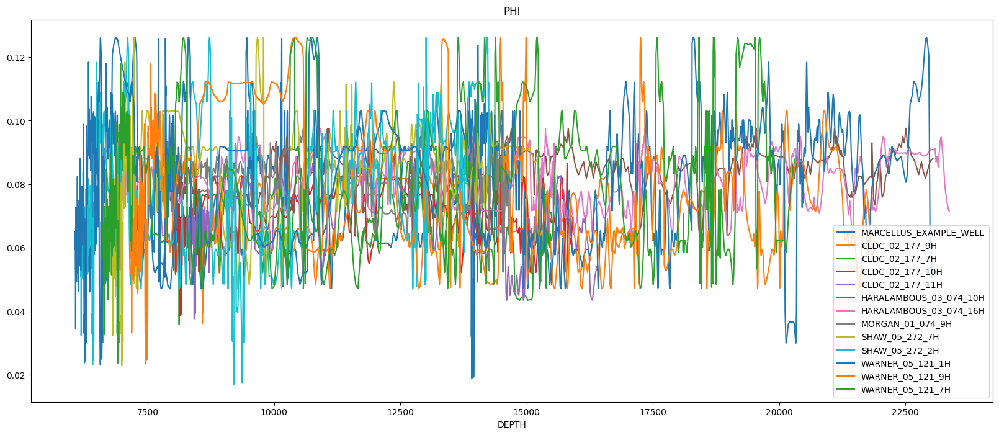

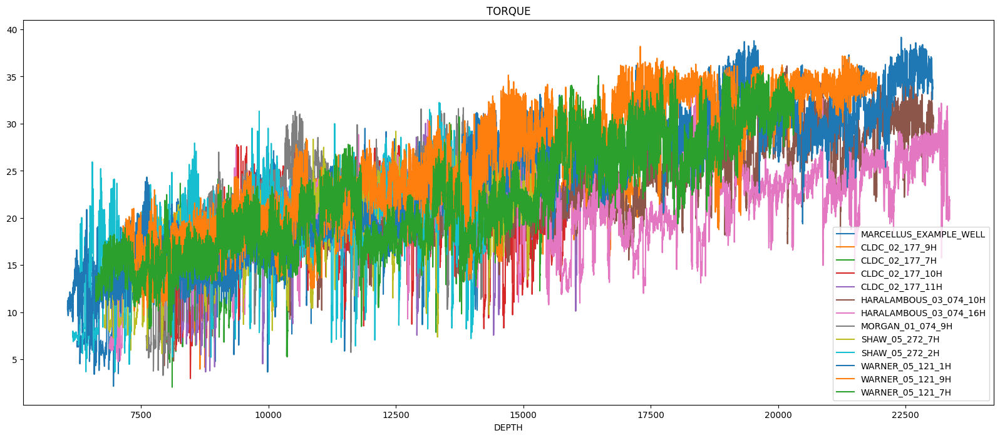

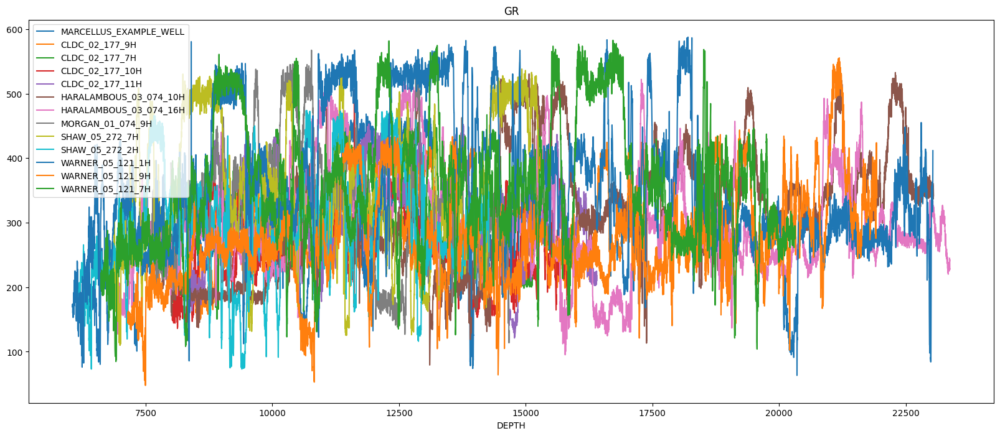

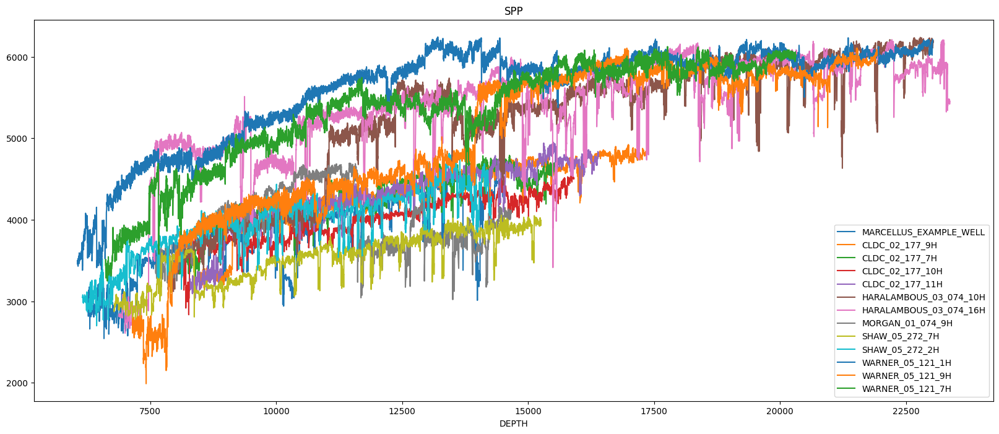

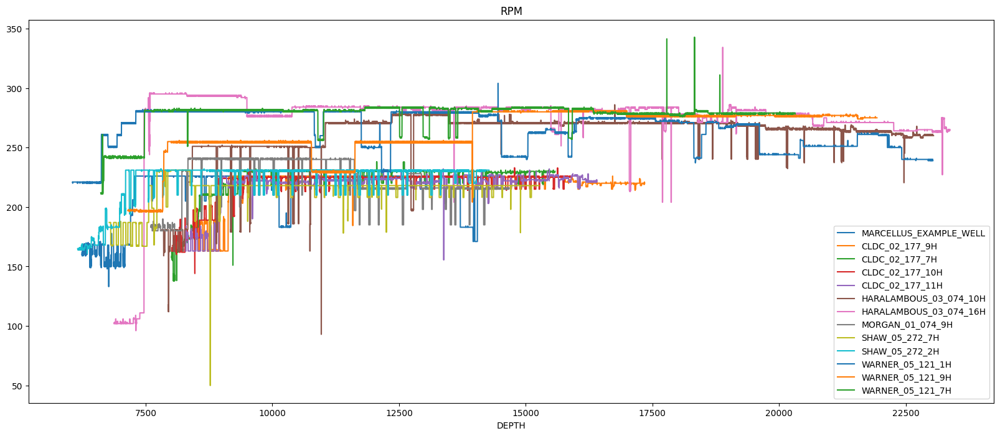

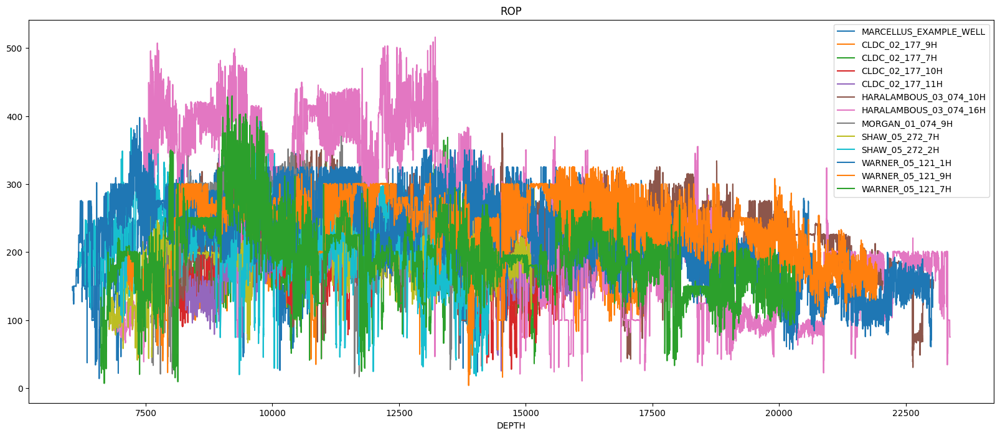

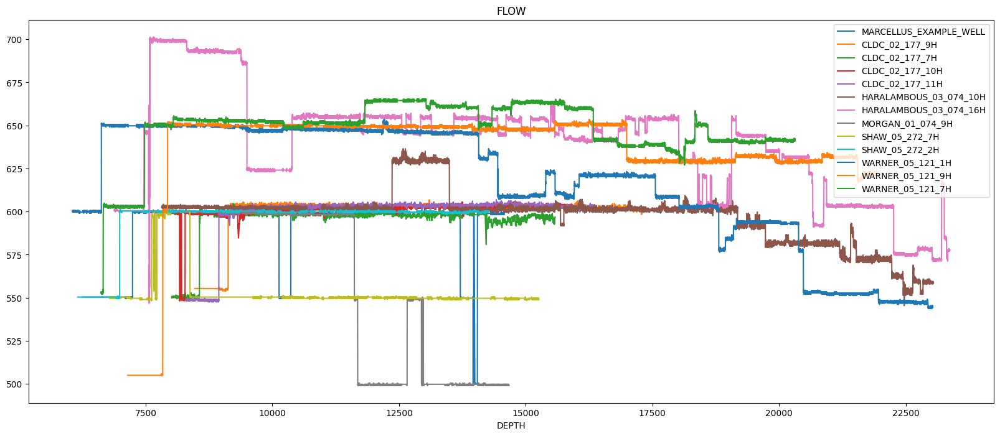

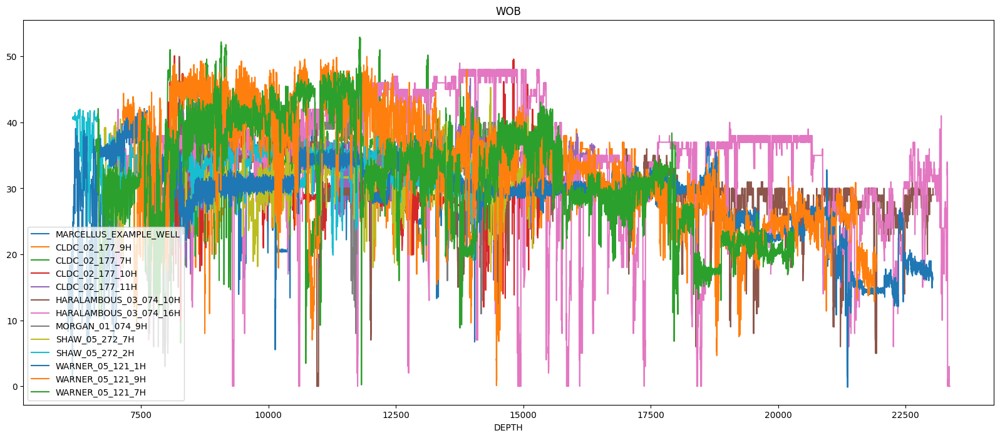

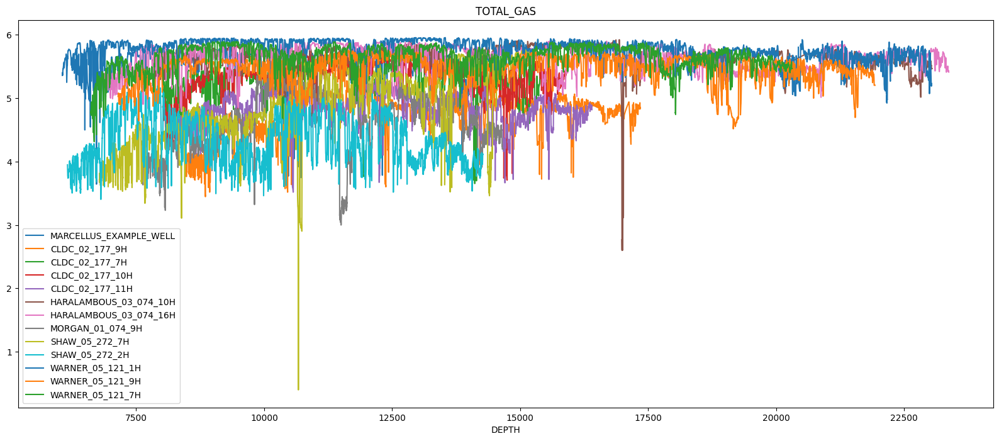

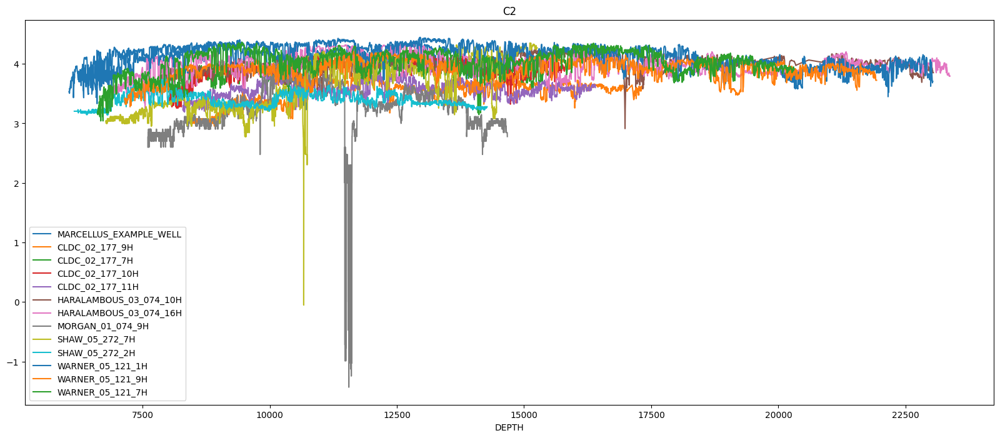

In [25]:
for feature in ["PHI"] + features_of_interest:
    fig, ax = matplotlib.pyplot.subplots(1, 1, figsize=(20, 8))

    for well in ([new_well_id] + wells_used_for_training_the_developed_models):
        
        well_df = comparing_df[comparing_df['well_id'] == well].set_index('DEPTH')
        ax.plot(
            well_df[feature],
            label=well
        )

    matplotlib.pyplot.title(feature)
    matplotlib.pyplot.xlabel("DEPTH")
    matplotlib.pyplot.legend()

2. **Similarities heatmaps**: Statistical techniques such as Dynamic Time Warping or Kolmogorov-Smirnov distance are used to create similarity heat maps between the wells variables to determine whether or not they are similar.

Heatmaps legend:
0: CLDC_02_177_10H
1: CLDC_02_177_11H
2: CLDC_02_177_7H
3: CLDC_02_177_9H
4: HARALAMBOUS_03_074_10H
5: HARALAMBOUS_03_074_16H
6: MORGAN_01_074_9H
7: SHAW_05_272_2H
8: SHAW_05_272_7H
9: WARNER_05_121_1H
10: WARNER_05_121_7H
11: WARNER_05_121_9H
12: MARCELLUS_EXAMPLE_WELL


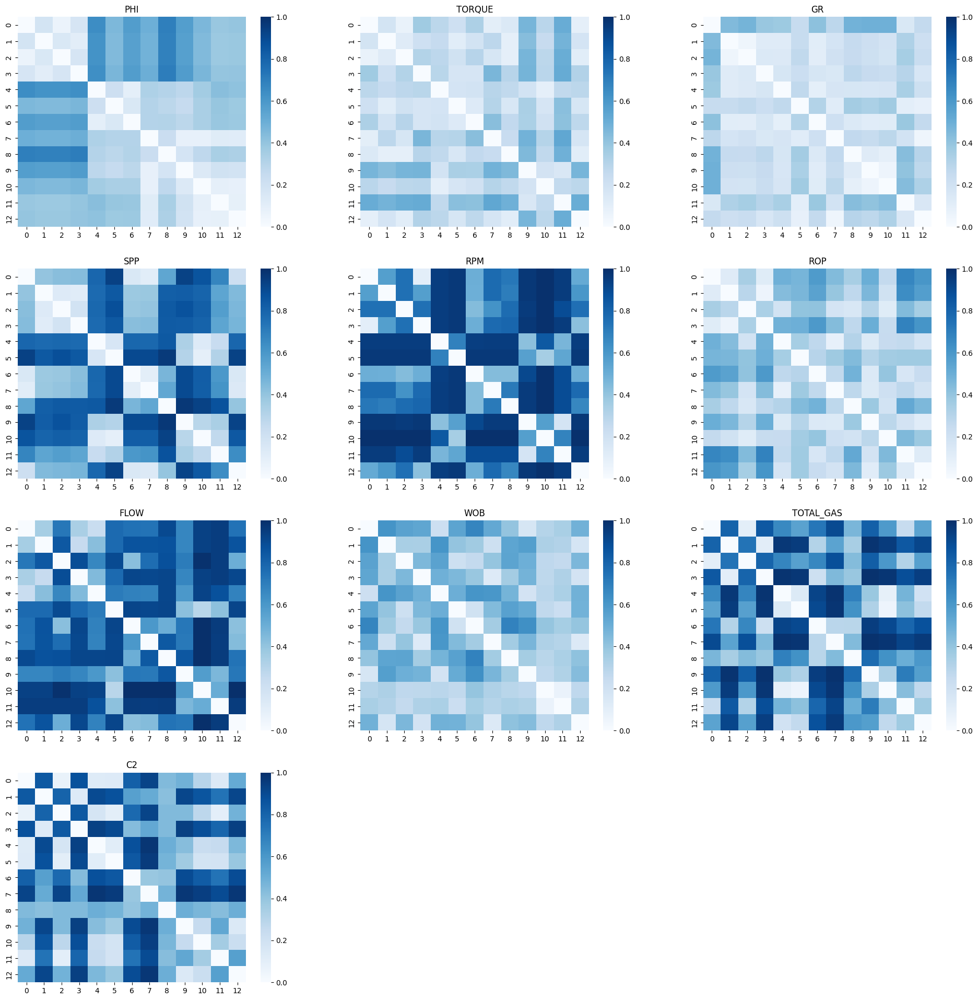

In [26]:
similarities = src.data_modelling.well_similarity.obtain_well_similarity_to_subset(
    df=comparing_df,
    zone=zone,
    well_name=new_well_id,
    subset_names=wells_used_for_training_the_developed_models,
    features=['PHI'] + features_of_interest,
    splitted_variables=True
)

The above heatmap matrices represent similarity between well variables using a color scheme to visually represent the degree of similarity or dissimilarity among variables. Technically, each cell in the heatmap matrix corresponds to the similarity score or distance metric between one variable in two wells. The color intensity in each cell is determined by the magnitude of the similarity or dissimilarity value. In this context, white color indicates high similarity, while blue color represents dissimilarity. For example, the cell in row 1 and column 2 of the PHI matrix shows the simillarity between the wells 1 and 2 in terms of the PHI variable.

Therefore, after analyzing the similarity between the new well and the training ones, the following two conclussions can be drawn:

- If the new well is similar to the training wells, it is expected that the algorithm will be able to provide valuable predictions to the geosteerers.

- If the new well is **NOT** similar to the training wells, the algorithm will not be able to provide correct predictions.

### 1.4.2. Obtaining predictions scores

Having analysed the similarity of the new well to the training wells and ensured that it is similar to them, the next step is to obtain several metrics that will help us evaluate the performance of the models.

#### 1.4.2.1. Obtaining porosity predictions scores

In first place, for evaluating porosity model results, the following two metrics are considered: 

1. **MAE (Mean Absolute Error)**:

    The Mean Absolute Error (MAE) measures the average absolute difference between the observed porosity values and the predicted ones. 
    
    It reflects the average magnitude of errors without considering their sign. 
    
    A lower MAE indicates better accuracy.

2. **RMSE (Root Mean Squared Error)**:

    The Root Mean Squared Error (RMSE) calculates the square root of the average of the squared differences between the observed and predicted porosity values. 
    
    It offers a measure of the overall magnitude of errors, assigning more weight to larger errors. 
    
    Importantly, RMSE is in the same unit as the target variable. 
    
    As well as the MAE metric, a lower RMSE is indicative of better accuracy.

In [27]:
nan_mask = ~numpy.isnan(new_well_df_with_predictions["PHI"].values) & ~numpy.isnan(new_well_df_with_predictions["PHI_PRED"].values)

mae = sklearn.metrics.mean_absolute_error(
    new_well_df_with_predictions["PHI"].values[nan_mask],
    new_well_df_with_predictions["PHI_PRED"].values[nan_mask],
)

rmse = sklearn.metrics.mean_squared_error(
    new_well_df_with_predictions["PHI"].values[nan_mask],
    new_well_df_with_predictions["PHI_PRED"].values[nan_mask],
    squared=False,
)

print(
    f"MAE: {mae:.4f}\n"
    f"RMSE: {rmse:.4f}"
)

MAE: 0.0162
RMSE: 0.0196


In second place, for the evaluation of porosity quantiles predictions, the following metrics are calculated:

1. **PICP (Prediction Interval Coverage Probability)**:

    Measures the percentage of observed porosity values (PHI) that fall within the predicted 5-95% quantile range (PHI_PRED_05 to PHI_PRED_95).
    
    High PICP indicates the model's ability to provide accurate and reliable prediction intervals.
    
2. **PICP Prediction (Prediction Interval Coverage Probability for Predictions)**:

    Similar to PICP but applied to the predicted porosity values (PHI_PRED) rather than observed values.
    
    Assesses how well the prediction intervals cover the predicted values.

3. **PINAW (Prediction Interval Normalized Average Width)**:

    Measures the average width of the prediction intervals normalized by the range of the target variable.

    A lower PINAW suggests narrower and more precise prediction intervals.

4. **PWC (Prediction Interval Width Criterion)**:

    Combines the PICP and PINAW into a single metric to evaluate the overall performance of prediction intervals.

    Balances the trade-off between coverage probability and interval width. In this case, the interval width is 90.

    Higher PWC indicates a better trade-off between coverage and precision.


In [28]:
picp = src.data_modelling.quantile_regression.prediction_interval_coverage_probability(
    new_well_df_with_predictions["PHI"],
    new_well_df_with_predictions["PHI_PRED_0.05"], 
    new_well_df_with_predictions["PHI_PRED_0.95"]
)

picp_pred = src.data_modelling.quantile_regression.prediction_interval_coverage_probability(
    new_well_df_with_predictions["PHI_PRED"],
    new_well_df_with_predictions["PHI_PRED_0.05"], 
    new_well_df_with_predictions["PHI_PRED_0.95"]
)

pinaw = src.data_modelling.quantile_regression.prediction_interval_normalized_average_width(
    new_well_df_with_predictions["PHI_PRED"], 
    new_well_df_with_predictions["PHI_PRED_0.05"].to_numpy(), 
    new_well_df_with_predictions["PHI_PRED_0.95"].to_numpy(), 
)

cwc = src.data_modelling.quantile_regression.coverage_width_based_criterion(
    90, 
    picp, 
    pinaw
)

print(
    f"PICP: {picp:.4f}\n"
    f"PICP Prediction: {picp_pred:.4f}\n"
    f"PINAW: {pinaw:.4f}\n"
    f"PWC: {cwc:.4f}\n"
)

PICP: 0.7452
PICP Prediction: 0.9971
PINAW: 1.3062
PWC: 318.2062



#### 1.4.2.2. Obtaining curtains predictions scores

In third and last place, metrics for evaluating the curtains models are calculated. The main metric calculated for this purpose is the accuracy score:

1. **Accuracy score**: This metric measures the number of correct predictions made by the model in relation to the total number of predictions made. In other words, it reflects the percentage of correct predicted samples divided by 100.

In [29]:
curtains_case_2_new_well_data = src.processing.training_processing.append_curtains_ids_to_dataframe(
    curtains_case=2,
    df=new_well_df_with_predictions
)

curtains_case_3_new_well_data = src.processing.training_processing.append_curtains_ids_to_dataframe(
    curtains_case=3,
    df=new_well_df_with_predictions
)

In [30]:
warnings.filterwarnings("ignore", category=FutureWarning)

common_indices = new_well_df_with_predictions.index.intersection(curtains_case_2_new_well_data.index)

curtains_case_2_accuracy = sklearn.metrics.accuracy_score(
        y_true=curtains_case_2_new_well_data['RW_CURTAIN_IDS'].loc[common_indices],
        y_pred=new_well_df_with_predictions['CASE_2_CURTAINS'].loc[common_indices],
    )

curtains_case_3_accuracy = sklearn.metrics.accuracy_score(
        y_true=curtains_case_3_new_well_data['RW_CURTAIN_IDS'].loc[common_indices],
        y_pred=new_well_df_with_predictions['CASE_3_CURTAINS'].loc[common_indices],
    )

print(
    f"Curtains Case 2 Accuracy Score: {curtains_case_2_accuracy:.4f}\n"
    f"Curtains Case 3 Accuracy Score: {curtains_case_3_accuracy:.4f}"
)

Curtains Case 2 Accuracy Score: 0.4722
Curtains Case 3 Accuracy Score: 0.6159


It is important to remember that it is essential that the well is similar to the training wells in order to obtain optimal values for the model metrics. If the well is not similar, there is no guarantee that these values will be accurate.

It should also be emphasised that the data used for this example has been generated synthetically and does not follow the logic of a real well, so it is to be expected that the models will not give the best possible results.

### 1.4.3. Plotting obtained predictions versus real values

The final step in the analysis of the predictions is the visualisation of the predictions with the actual porosity values.

#### 1.4.3.1. Plotting porosity predictions

In first place, we well take a look into real porosity values versus predicted ones. The below image shows the following two plots:

1. **Real vs. Predicted Values Plot**:
    the first plot offers a visual comparison between the actual porosity values and those predicted by the model. Real values are represented in blue, while predicted values are depicted in orange. 

2. **Absolute Error Plot**: 
    the second plot focuses on the absolute error between real and predicted values. The magnitude of absolute errors is represented, providing a deeper understanding of the model's accuracy across different porosity ranges.

These visualizations allow, not only to evaluate the quality of the model predictions, but also to identify patterns and trends crucial for interpreting the results. 

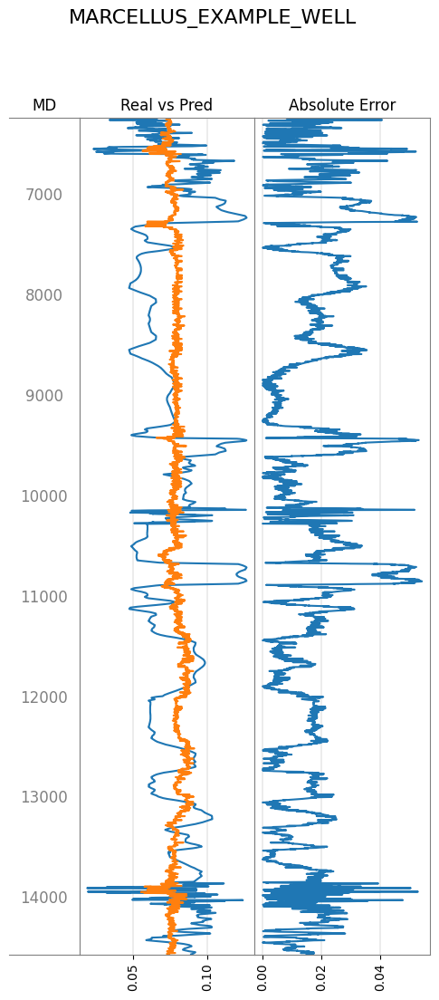

In [31]:
nan_mask = ~numpy.isnan(new_well_df_with_predictions["PHI"].values) & ~numpy.isnan(new_well_df_with_predictions["PHI_PRED"].values)

src.data_modelling.error_along_depth_analysis.validate_well_performance_based_on_estimations(
    well_info=new_well_id,
    X=new_well_df_with_predictions,
    y_real=new_well_df_with_predictions["PHI"].values[nan_mask],
    y_pred=new_well_df_with_predictions["PHI_PRED"].values[nan_mask],
    depth=new_well_df_with_predictions["DEPTH"].values[nan_mask],
    model_info='InGAIA Developed model',
    save_plot=False
)


In second and last place, we will take a look into porosity quantiles predictions among real values. The below graphic shows the following images:

1. **Real vs. Predicted Porosity Plot**:
    the initial plot combines the previously explained Real vs. Predicted Porosity values, showcasing a side-by-side comparison of actual and predicted porosity values. The real values are depicted in blue, while the predicted values are represented in orange.

2. **Absolute Error Plot**: 
    as before, the second plot focuses on the absolute error between real and predicted values.

3. **Model features**:
    the next plots offers the visualization of the features used for porosity and porosity quantiles models. 

3. **Quantile Interval and Prediction Plot**:
    the final plot integrates various elements, featuring a shaded blue region representing the interval between the 5th and 95th quantiles, a red line indicating the 50th quantile, a black line for the actual porosity values, and an orange line for the predicted porosity values. This comprehensive visualization allows for a thorough examination of the model's performance across quantiles, highlighting areas of greater variability.

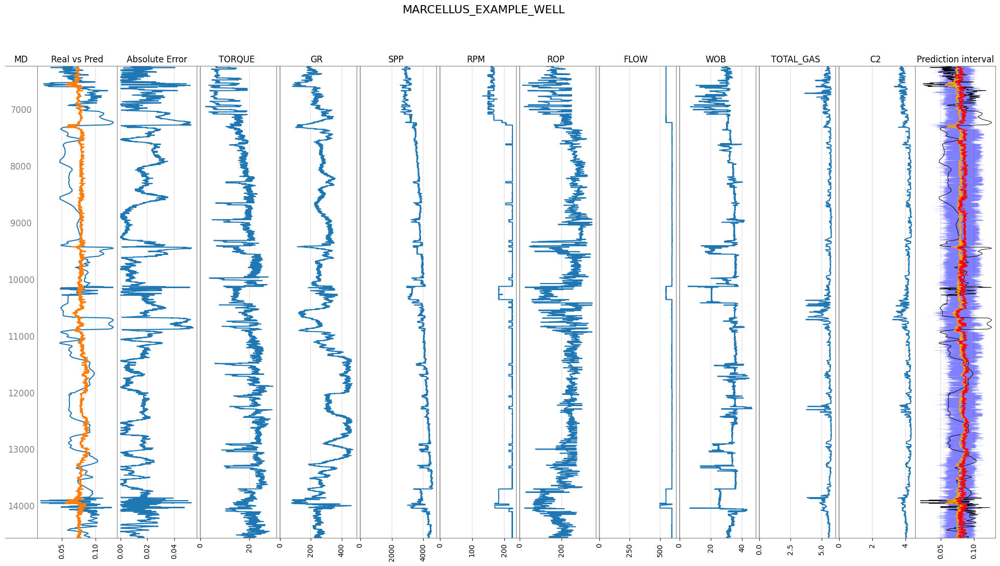

Prediction interval coverage probabilities... 
Test data: 0.75
Test prediction: 1.0
Prediction Interval Normalized Averaged Width (PINAW): 0.44
Coverage width based criterion (PWC): 0.62 



In [32]:
src.data_modelling.quantiles_along_depth_analysis.validate_well_performance_and_quantiles_based_on_estimations(
    well_info=new_well_id, 
    X=new_well_df_with_predictions[features_of_interest].values[nan_mask], 
    y_real=new_well_df_with_predictions["PHI"].values[nan_mask],
    y_pred=new_well_df_with_predictions["PHI_PRED"].values[nan_mask],
    y_lower=new_well_df_with_predictions["PHI_PRED_0.05"].values[nan_mask],
    y_upper=new_well_df_with_predictions["PHI_PRED_0.95"].values[nan_mask],
    y_median=new_well_df_with_predictions["PHI_PRED_0.5"].values[nan_mask],
    list_of_quantiles=[0.05, 0.5, 0.95],
    depth=new_well_df_with_predictions["DEPTH"].values[nan_mask],
    feature_names=features_of_interest,
    metric="mae", 
    model_info="InGAIA Developed model",
    save_plot=False
)

#### 1.4.3.2. Plotting curtains predictions

In the case of the graphs that can be obtained to analyse the curtain predictions, there are more columns to look at. These columns are the following:

1. **Features used to train the curtain model**: The first columns represent the variables used to predict the curtains, together with the depth of the well.
2. **REAL**: Using a coloured legend associated with the corresponding prediction case, the real rock types obtained in the well are plotted.
3. **PREDICTED**: Using the same coloured legend, the predictions obtained for the rock type are plotted. 
4. **PERFORMANCE**: This column compares the actual values of the curtains with the predictions, so that the depths where the predictions do not match the actual values are shown in black, and those where they do match are shown in white.
5. **Class probabilities**: These columns represent the probability that the actual rock type belongs to the respective class (0, 1 or 2). The further to the right the value is, the closer it is to a probability of 1.
6. **Maximum probability**: Finally, this column contains the maximum value of the probabilities of the classes to give a measure of the uncertainty in the prediction.

In first instance, these graphics can be obtained for case 2 curtains predictions executing the following cell: 

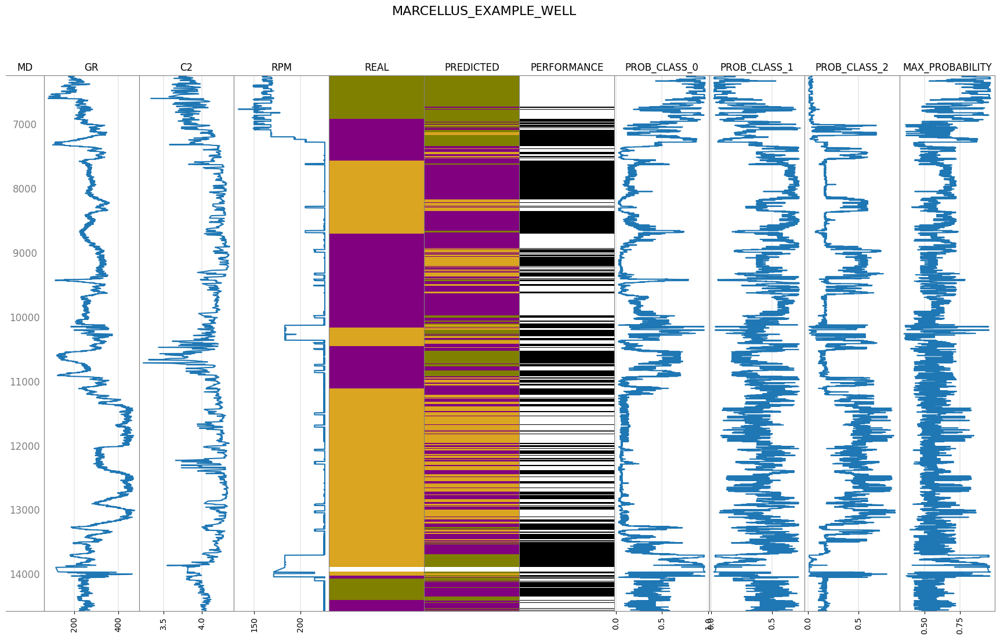

In [33]:
case_2_color_dict = {
    0: 'olive',
    1: 'purple',
    2: 'goldenrod'
}

color_dict_prob = src.data_modelling.utils.create_probabilities_color_dict(3, top_prob=95)

common_indices = new_well_df_with_predictions.index.intersection(curtains_case_2_new_well_data.index)

src.data_modelling.curtain_along_depth_analysis.validate_curtain_well_performance_w_predictors_probabilities_based_on_estimations(
    well_info=new_well_id,
    X=new_well_df_with_predictions.loc[common_indices],
    y_real=curtains_case_2_new_well_data["RW_CURTAIN_IDS"].loc[common_indices].values,
    y_pred=new_well_df_with_predictions["CASE_2_CURTAINS"].loc[common_indices].values,
    depth=new_well_df_with_predictions["DEPTH"].loc[common_indices],
    y_prob_classes=new_well_df_with_predictions[["CASE_2_PROB_CLASS_0", "CASE_2_PROB_CLASS_1", "CASE_2_PROB_CLASS_2" ]].loc[common_indices].values,
    color_dict=case_2_color_dict,
    color_dict_prob=color_dict_prob,
    model_info=developed_curtains_2_model_name,
    feature_names=features_used_for_training_developed_curtains_2_model
)

Secondly, the case 3 curtains predictions graphics can be obtained executing the below cell.

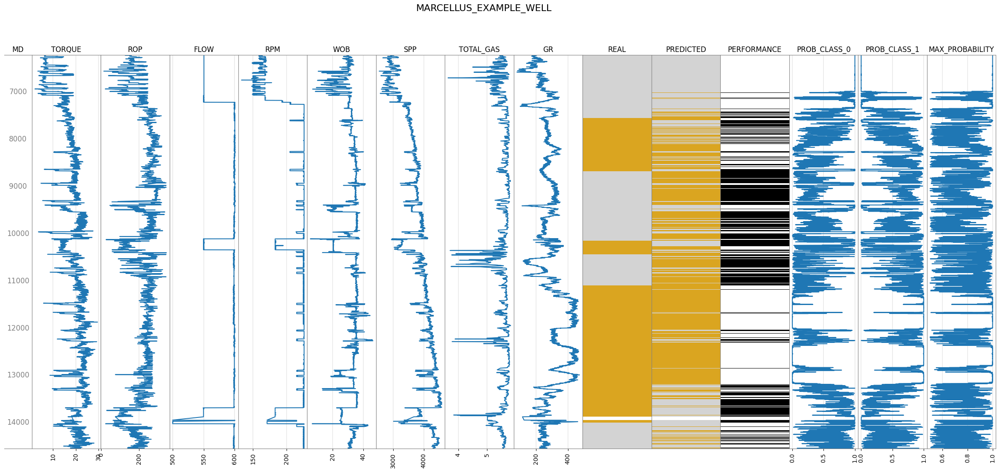

In [34]:
case_3_color_dict = {
    0: 'lightgray',
    1: 'goldenrod'
}

color_dict_prob = src.data_modelling.utils.create_probabilities_color_dict(
    n_classes=2, 
    top_prob=95
)

common_indices = new_well_df_with_predictions.index.intersection(curtains_case_3_new_well_data.index)

src.data_modelling.curtain_along_depth_analysis.validate_curtain_well_performance_w_predictors_probabilities_based_on_estimations(
    well_info=new_well_id,
    X=new_well_df_with_predictions.loc[common_indices],
    y_real=curtains_case_3_new_well_data["RW_CURTAIN_IDS"].loc[common_indices].values,
    y_pred=new_well_df_with_predictions["CASE_3_CURTAINS"].loc[common_indices].values,
    depth=new_well_df_with_predictions["DEPTH"].loc[common_indices],
    y_prob_classes=new_well_df_with_predictions[["CASE_3_PROB_CLASS_0", "CASE_3_PROB_CLASS_1"]].loc[common_indices].values,
    color_dict=case_3_color_dict,
    color_dict_prob=color_dict_prob,
    model_info=developed_curtains_3_model_name,
    feature_names=features_used_for_training_developed_curtains_3_model
)

# 2. Adding new wells to developed models

## Introduction

Recall that the algorithms developed to predict porosity in the Marcellus region were trained on a large set of 12 training wells, similar to each other. In order to have more generalisable models, it is possible to increase the set of training wells by adding information about new wells. 

To do this, the following steps must be followed:

1. **Reading new wells data**: The information from the new wells must be read and processed to match the format of the wells in the original data. This new information must be cleaned to avoid introducing any kind of noise into the model, as this will not only fail to improve the original model, but may actually produce a worse version of the model.

2. **Analyzing new wells similarity**: In this key step, the similarity of each of the new wells to the original training wells must be analysed. When performing such an analysis on each new well, we may be faced with the following two situations: 

    - If the new well has no significant similarity to the original training set, it should not be included in the new set.

    - If the new well is similar to the training wells, it can be included in the training set, but this does not guarantee that the model will perform better. 

3. **Retraining the models**: Once the training set has been selected and it has been verified that the wells in the training set are similar to each other, the models are re-trained using the developed code associated with each algorithm.

4. **Evaluation of the models**: Finally, once the models have been trained, they need to be evaluated to measure the performance of these updated versions and to check if the performance is better after the inclusion of the new data. Note that this will depend on the quality of the data associated with the new wells.

The diagram below summarises all the above steps.

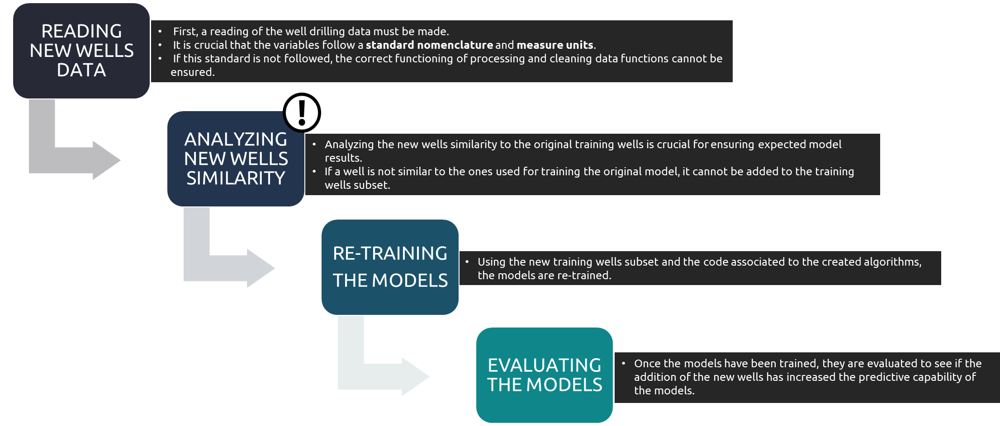

Before proceeding with the code cells associated with the steps described above, it is necessary to create a set of configuration variables.

In addition, to better exemplify the process explained in this section, we will use two new wells whose information has been extracted from SiteCom platform. This two wells are called ***SHAW_05_272_4H*** and ***WARNER_05_121_8H***.

In [35]:
# 1. Porosity models parameters

## In the same way, this variable lists the drilling parameters used for training the developed models.
features_used_for_training_developed_porosity_model = [
    'ROP',
    'GR',
]

# 2. Curtains case 2 parameters

## This variable lists the drilling parameters used for training the developed models for case 2 curtains
features_used_for_training_developed_curtains_2_model = [
    'GR',
    'C2',
    'RPM',
]

# 3. Curtains case 3 parameters

## This variable lists the drilling parameters used for training the developed models for case 3 curtains
features_used_for_training_developed_curtains_3_model = [
    'TORQUE',
    'ROP',
    'FLOW', 
    'RPM',
    'WOB',
    'SPP', 
    'TOTAL_GAS',
    'GR',
]

# 4. Parameters for re-trained models

## Name for saving the retrained models
retrained_model_name = 'XGBoost_with_added_new_wells'

# New wells IDs for analyzing and re-training the models
new_wells_ids = [
    'SHAW_05_272_4H',
    'WARNER_05_121_8H',
]

## This variable lists the IDs of the wells used for training the developed models
wells_used_for_training_the_developed_models = [
    'CLDC_02_177_9H',
    'CLDC_02_177_7H',
    'CLDC_02_177_10H',
    'CLDC_02_177_11H',
    'HARALAMBOUS_03_074_10H',
    'HARALAMBOUS_03_074_16H',
    'MORGAN_01_074_9H',
    'SHAW_05_272_7H',
    'SHAW_05_272_2H',
    'WARNER_05_121_1H',
    'WARNER_05_121_9H',
    'WARNER_05_121_7H',
]

## 2.1. Reading new wells data

In order to load new well data from Marcellus region, a number of guidelines must be followed in terms of file type, name, location and data format. These guidelines are:

1. **File type**: Data for each well should be collected in several *.las* or *.csv* files. That files must follow the following structure:
    
    - ***Drilling data***: All the drilling variables such as ROP, WOB or GR must be contained in the same file.
    - ***Petro data***: In this file, petro-physics variables must be contained. Most important ones are PHI and SW.
    - ***Curtains data***: Curtains completion data must be collected in this file.

3. **Files names and paths**: All of the files described above must follow guidelines for their name and path. These are listed in the table below:

| File | Information | File name | Path | 
|:-|:-:|:-|:-:|
| Drilling data | ROP,GR,WOB,...    | The structure of the data file name must be *\<initial_depth\>m\_\<final_depth\>m_\<well_id\>* or *\<initial_depth\>ft_\<final_depth\>ft_\<well_id\>*, depending on the depth measure unit.  | CWS_DECOM_VS2/data/Marcellus/raw/SITECOM WELLS/WELLS DATA | 
| Petro data    | PHI & SW             | Data file name must contain the **exact** well id. | CWS_DECOM_VS2/data/Marcellus/raw/SITECOM WELLS/PETRO DATA | 
| Curtains data | Curtains information | Data file name must contain the **exact** well id. | CWS_DECOM_VS2/data/Marcellus/raw/CURTAINS DATA | 
    For example, a valid name for a drilling data file is 32.31m_5886.3m_WARNER_05_121_8H, for a petro data file is Warner_05_121_8H_dynamic_logs_petrophysics and for a curtains data file is Warner_05_121_8H_Curtains_for_Completions.


6. **Data format**: For correct processing and extraction of well data it is essential that each of this file maintain a structured format.

    Firstly, the drilling data file must be a ***.csv*** file that follows the following formatting guidelines:

    - The value separator must be the comma character (',') and the decimal separator must be the dot character ('.').
    - The first line of the file must contain the name of each variable contained in the file. 
    - The second row of the file must contain the measure units of each of these variables. 
    - The following rows must contain the variables data in standard dataframe format. It is recommended that there is a single sample for each depth value. 

Secondly, the petro data file can be either a ***.csv*** file following the same guidelines as described above for the drilling data file, or a ***.las*** file containing the porosity and water saturation information of the well. 

Finally, the curtains data file must be a ***.csv*** file containing the information of the rock type in each drilling depth. 

The following cells serves as an example of the format that must be followed by each of the mentioned files.

In [36]:
print("\n----------------- DRILLING DATA FILE -----------------\n")

drilling_example_file_path = '../../data/Marcellus/raw/SITECOM WELLS/WELLS DATA/32.31m_5886.3m_WARNER_05_121_8H.csv'

with open(drilling_example_file_path, 'r') as f:
    content = f.readlines()[:10]
    for line in content:
        print(line, end="")

print("\n----------------- PETRO DATA FILE -----------------\n")

drilling_example_file_path = '../../data/Marcellus/raw/SITECOM WELLS/PETRO DATA/Warner_05_121_8H_dynamic_logs_petrophysics.las'

with open(drilling_example_file_path, 'r') as f:
    content = f.readlines()[:30]
    for line in content:
        print(line, end="")
        
print("\n----------------- CURTAINS DATA FILE -----------------\n")

curtains_example_file_path = '../../data/Marcellus/raw/CURTAINS DATA/Warner_05_121_8H_Curtains_for_Completions.csv'

with open(curtains_example_file_path, 'r') as f:
    content = f.readlines()[:10]
    for line in content:
        print(line, end="")


----------------- DRILLING DATA FILE -----------------

DEPTH,3GAS,ADEP,AZ,BDEP,GAM,HDIAM,INCL,PC1G,PC2G,PC3G,PC4G,PC5G,PGAS,PGASP,PIC4G,PNC4G,PTGN,SPP,TGAS,TOR,WOB,CTOR,OBR,TPO,BR
m,%,ft,dega,ft,gAPI,in,dega,ppm,ppm,ppm,ppm,ppm,ppm,ppm,ppm,ppm,ppm,psi,ppm,Euc,klbf,kft.lbf,ft/h,galUS/min,rpm
32.614,0,107.01,53.23,107,-999.25,8.5,0.3,0,400,0,200,0,600,600,100,100,600,602.5,600,16.276,25.2,16.276,107.45,441.76,146
32.918,0,108.01,53.23,108,-999.25,8.5,0.3,0,300,0,200,0,500,500,100,100,500,422.5,500,18.085,25.5,18.085,115.56,441.76,146
33.223,0,109,53.23,109,-999.25,8.5,0.3,0,400,0,200,0,500,500,100,100,500,446.25,500,14.851,24.1,14.851,118.93,441.76,146
33.528,0,110,53.23,110,-999.25,8.5,0.3,0,400,0,200,0,500,500,100,100,600,421.25,600,15.071,22.4,15.071,103.9,441.76,146
33.833,0,111,53.23,111,-999.25,8.5,0.3,0,400,0,200,0,500,500,100,100,600,426.25,600,14.413,22.5,14.413,88.5,441.76,146
34.138,0,112,53.23,112,-999.25,8.5,0.3,0,400,0,200,0,500,500,100,100,600,407.5,600,13.536,22.1,13.53

Furthermore, for the correct functioning of the reading and processing functions, it is advisory to follow some naming and measurement standards. The below table lists the necessary variables that must be contained in this file, among these mentioned standards. 

| Variable              | Variable name                  | Measure unit           |
|--------------------------|---------------------------|------------------------|
| Depth                    | DEPTH                     | ft |
| Gamma Ray                | GR                        | gAPI |
| Rate of Penetration      | ROP                       | ft/h |
| Flow                     | FLOW                      | gpm |
| Weight on Bit            | WOB                       | klbf |
| Revolutions per Minute   | RPM                       | rpm |
| Standpipe Pressure       | SPP                       | psi |
| Torque                   | TORQUE                    | kft.lbf |
| C1 Gas                   | C1                        | ppm |
| C2 Gas                   | C2                        | ppm |
| C3 Gas                   | C3                        | ppm |
| C4 Gas                   | C4                        | ppm |
| C5 Gas                   | C5                        | ppm |
| Total Gas                | TOTAL_GAS                 | ppm |
| Porosity                 | PHI                       | m3/m3 |

Once the new wells have been added following the instructions detailed before, the process of reading, loading and processing this new data is quite simple.

This process is done using the function ***make_porosity_dataset*** of the package ***src.data.make_porosity_dataset***:

In [37]:
import src.data.make_porosity_dataset

help(src.data.make_porosity_dataset.make_porosity_dataset)

Help on function make_porosity_dataset in module src.data.make_porosity_dataset:

make_porosity_dataset(*, zone: str, save_file: bool = True, verbose: bool = False) -> pandas.core.frame.DataFrame
    Generate training dataset for porosity prediction.
    
    Parameters:
        - zone (str): Zone where the data belongs to.
        - save_file (bool, optional): Flag for determining if creating and saving the dataset in a file.
        - verbose (bool, optional): Defaults to False.
    
    Returns:
        - pandas.DataFrame: Dataset prepared for training.



The training dataset can be build up as follows: 

In [5]:
warnings.filterwarnings('ignore', category=FutureWarning, module='welly')

marcellus_porosity_dataset = src.data.make_porosity_dataset.make_porosity_dataset(
    zone=zone,
    save_file=True,
    verbose=False,
)


[INFO] Triggering analysis for CLDC (02-177) 9H well.

[INFO] Triggering analysis for CLDC_02-177-07_7H well.

[INFO] Triggering analysis for CLDC_02-177-08_8H well.

[INFO] Triggering analysis for CLDC_02-177-10_10H well.

[INFO] Triggering analysis for CLDC_02-177-11_11H well.

[INFO] Triggering analysis for CUMMINGS LUMBER (01-081) 7H well.

[INFO] Triggering analysis for DCNR 587 (02-003-09) 9H well.

[INFO] Triggering analysis for DCNR 587 02-017-05 well.

[INFO] Triggering analysis for DCNR_587-02-003-11H well.

[INFO] Triggering analysis for DCNR_587-02-003-13H well.

[INFO] Triggering analysis for DCNR_587-02-003-15H well.

[INFO] Triggering analysis for HARALAMBOUS 03-074-10H well.

[INFO] Triggering analysis for HARALAMBOUS 03-074-16H well.

[INFO] Triggering analysis for JOHNSON (02-135) 13H well.

[INFO] Triggering analysis for JOHNSON (02-135) 14H well.

[INFO] Triggering analysis for JOHNSON (02-135) 1H well.


Only engine='normal' can read wrapped files
Only engine='normal' can read wrapped files



[INFO] Triggering analysis for JOHNSON_02-135-07_K_7H well.

[INFO] Triggering analysis for MORGAN 01-074-06H well.

[INFO] Triggering analysis for MORGAN 01-074-09H well.

[INFO] Triggering analysis for OMR 02-188-04H ST1 well.

[INFO] Triggering analysis for OMR_02-188-03_3H well.

[INFO] Triggering analysis for SHAW J 05-272-7H well.


Only engine='normal' can read wrapped files
Only engine='normal' can read wrapped files



[INFO] Triggering analysis for SHAW J 05-272-8H well.


Only engine='normal' can read wrapped files
Only engine='normal' can read wrapped files



[INFO] Triggering analysis for SHAW_05-272-02_J_2H well.

[INFO] Triggering analysis for WARNER (05-121-01) W 1H well.

[INFO] Triggering analysis for Warner (05-121-09) 9H well.

[INFO] Triggering analysis for warner_05-121-07_w_7h well.

[INFO] Triggering analysis for SHAW_05_272_4H well.

[INFO] Triggering analysis for WARNER_05_121_8H well.
[INFO] Porosity training dataset for Marcellus region process finished.
[INFO] The training file is located at C:\Users\dgonza22\OneDrive - Capgemini\Desktop\Repsol\CWS_DECOM_V2\data\Marcellus\processed/Marcellus_clean_data_interest_zone_interpolation.csv.

[INFO] The available wells for training are:
	CLDC_02_177_9H
	CLDC_02_177_7H
	CLDC_02_177_8H
	CLDC_02_177_10H
	CLDC_02_177_11H
	CUMMINGS_01_081_7H
	DCNR_02_003_9H
	DCNR 587 02-017-05
	DCNR_02_003_11H
	DCNR_02_003_13H
	DCNR_02_003_15H
	HARALAMBOUS_03_074_10H
	HARALAMBOUS_03_074_16H
	JOHNSON_02_135_13H
	JOHNSON_02_135_14H
	JOHNSON_02_135_1H
	JOHNSON_02_135_7H
	MORGAN_01_074_6H
	MORGAN_01_074_9

After running this function, several datasets containing all wells data are created and saved in the path:

        CWS_DECOM_VS2/data/Marcellus/processed

The following table explains the created datasets: 

<div style="display: flex; justify-content: center; align-items: center;">

| Dataset name | Description |
|:-------|:-------|
| Marcellus_raw_data | File containing raw data information for all wells in the Marcellus zone, grouped by well IDs. |
| Marcellus_raw_data_interest_zone | Subset of raw data focusing on the specific zone of interest within the Marcellus zone. |
| Marcellus_raw_data_interest_zone_interpolation | Interpolated data for the interest zone, filling missing values and providing a continuous dataset. |
| Marcellus_clean_data_interest_zone_interpolation | Cleaned and pre-processed data for the interest zone, removing outliers and ensuring data quality. |
| Marcellus_clean_smooth_data_interest_zone_interpolation | Smoothed version of the cleaned data for the interest zone, reducing noise and fluctuations in the dataset. |

</div>

It is important to note that from all this datasets, the one that will be used by default for training the models associated to porosity is the ***Marcellus_clean_data_interest_zone_interpolation*** one.

In addition, in order to train the rock type classification models, it is necessary to run the following function, which processes the curtain files and combines them with the information available for each well. 

In [38]:
warnings.filterwarnings('ignore', category=FutureWarning, module='welly')

marcellus_curtains_dataset = src.data.make_curtains_dataset.make_curtains_dataset(
    zone=zone,
    verbose=False,
)


[INFO] Triggering analysis for CLDC_02_177_10H well.

[INFO] Triggering analysis for CLDC_02_177_11H well.

[INFO] Triggering analysis for CLDC_02_177_7H well.

[INFO] Triggering analysis for CLDC_02_177_8H well.

[INFO] Triggering analysis for CLDC_02_177_9H well.

[INFO] Triggering analysis for CUMMINGS_01_081_7H well.

[INFO] Triggering analysis for DCNR 587 02-017-05 well.

[INFO] Triggering analysis for DCNR_02_003_11H well.

[INFO] Triggering analysis for DCNR_02_003_13H well.

[INFO] Triggering analysis for DCNR_02_003_15H well.

[INFO] Triggering analysis for DCNR_02_003_9H well.

[INFO] Triggering analysis for HARALAMBOUS_03_074_10H well.

[INFO] Triggering analysis for HARALAMBOUS_03_074_16H well.

[INFO] Triggering analysis for JOHNSON_02_135_13H well.

[INFO] Triggering analysis for JOHNSON_02_135_14H well.

[INFO] Triggering analysis for JOHNSON_02_135_1H well.

[INFO] Triggering analysis for JOHNSON_02_135_7H well.

[INFO] Triggering analysis for MORGAN_01_074_6H well.



In the same way as the porosity dataset, after running the ***make_curtains_dataset*** function, several datasets are created and saved in the following path:

        CWS_DECOM_VS2/data/Marcellus/processed

The following table explains the created datasets: 

<div style="display: flex; justify-content: center; align-items: center;">

| Dataset name | Description |
|:-------|:-------|
| Marcellus_curtains_data_clean_merged | Cleaned and pre-processed data for the interest zone among the information of rock classification in each depth sample. |
| Marcellus_curtains_data_clean_smooth_merged | Smoothed version of the cleaned data for the interest zone, among the information of rock classification in each depth sample. |
</div>

From all this datasets, the one that will be used by default for making the curtains classification models training is the one called by ***Marcellus_curtains_data_clean_merged***.

Additionally, new wells can be plotted for checking that everything has been imported and processed as expected. Next cells shows an example of how to create these plots for PHI, GR and ROP variables.

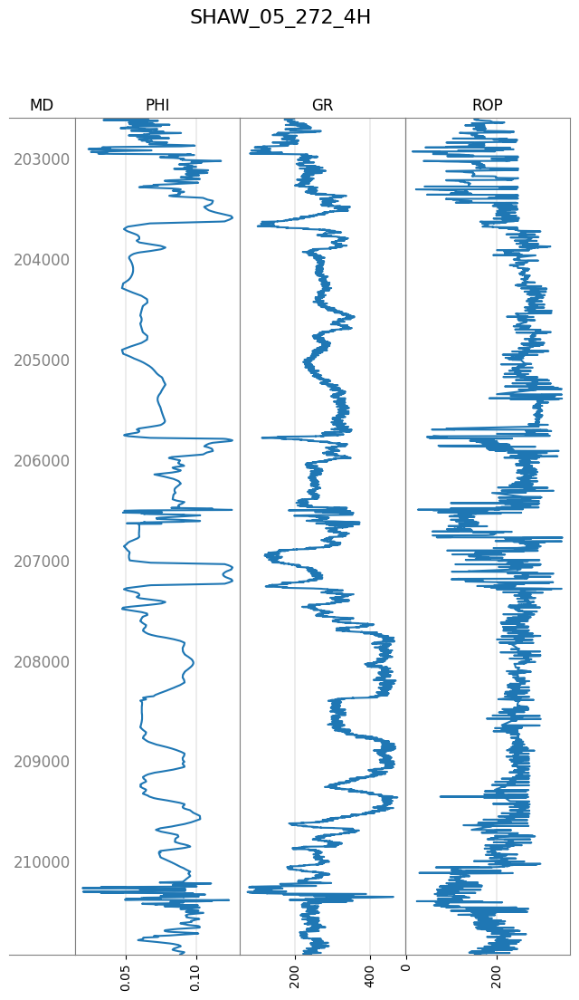

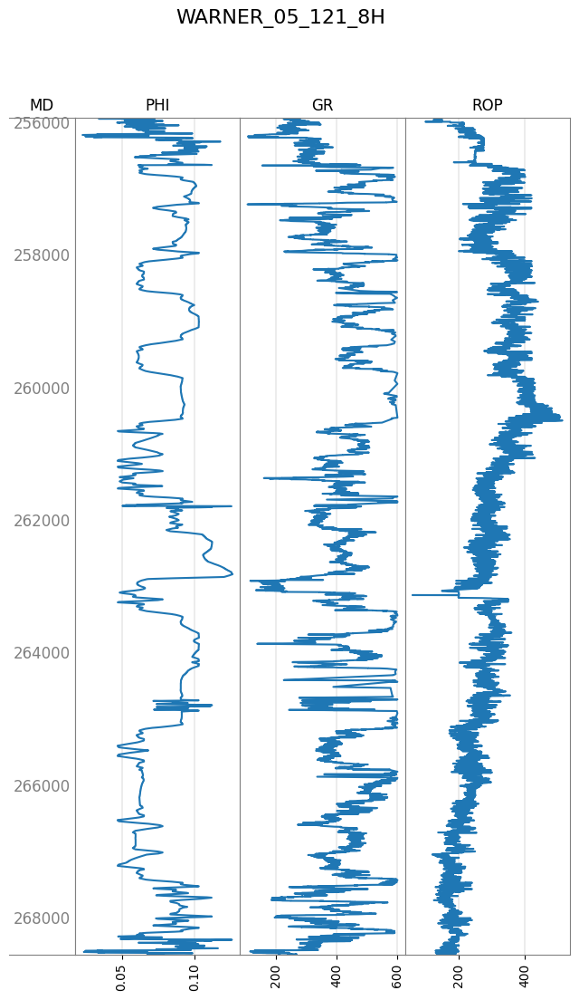

In [41]:
for well_id in new_wells_ids:

    new_well_df = marcellus_curtains_dataset.query(f"well_id==\"{well_id}\"")
    
    new_well_df["MD"] = new_well_df["DEPTH"]

    src.plot_welly.plot_wellys.plot_well(
        welly.Well().from_df(
        new_well_df[["MD", "PHI", "GR", "ROP"]],
        name=well_id
        )
    )

## 2.2. Analyzing new wells similarity

Once the data from the new wells have been imported and processed, they need to be analysed and compared with the original wells to ensure consistency with the original wells. This is done by performing a similarity analysis between the new wells and the original training set. 

When performing this analysis on a new well, we may encounter any of the following situations

1. The well is similar to the original training set. In this case, the data from the new well can be included in the training data set. 

2. The well is **NOT** similar to the training set of wells. In this situation the well should not be included in the training set as it would not help to maintain uniformity within the training set. 


To carry out this analysis, it is necessary to create a parameter that groups all the variables to be studied. To do this, it is sufficient to execute the following cell.

In [42]:
features_of_interest = list(
    set(
        features_used_for_training_developed_porosity_model +
        features_used_for_training_developed_curtains_2_model + 
        features_used_for_training_developed_curtains_3_model
    )
)

features_of_interest

['TORQUE', 'GR', 'SPP', 'RPM', 'ROP', 'FLOW', 'WOB', 'TOTAL_GAS', 'C2']

This similarity analysis consists in the following two stages: 

1. **Features plots**: A comparison of each of the well's drilling variables is made to look for anomalous or out-of-range behaviour. 

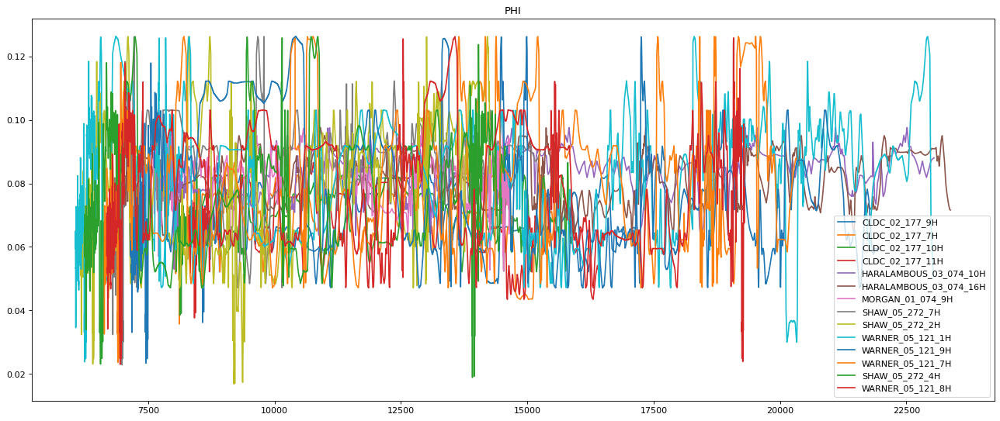

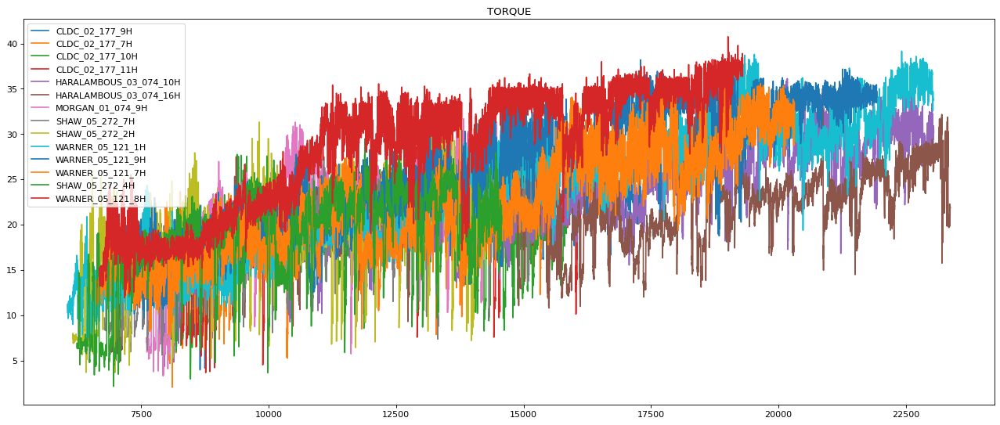

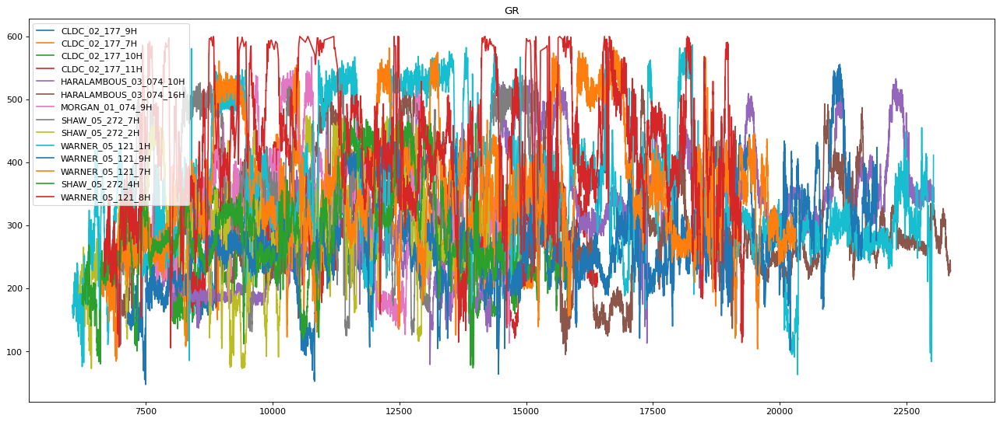

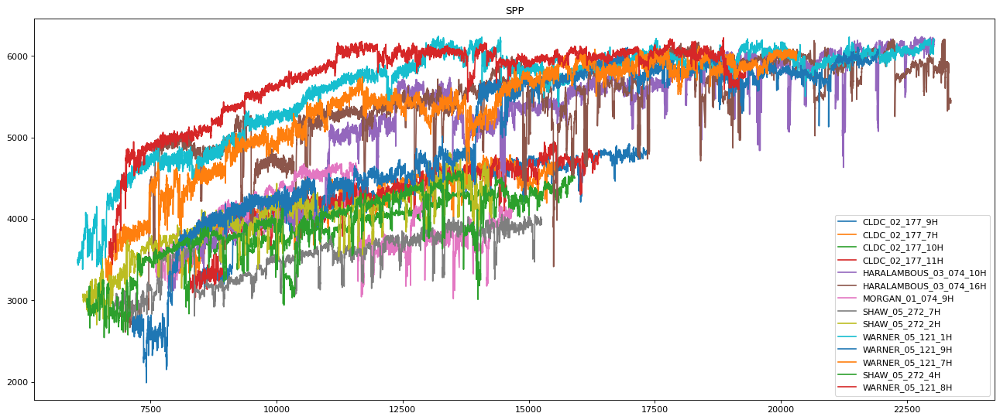

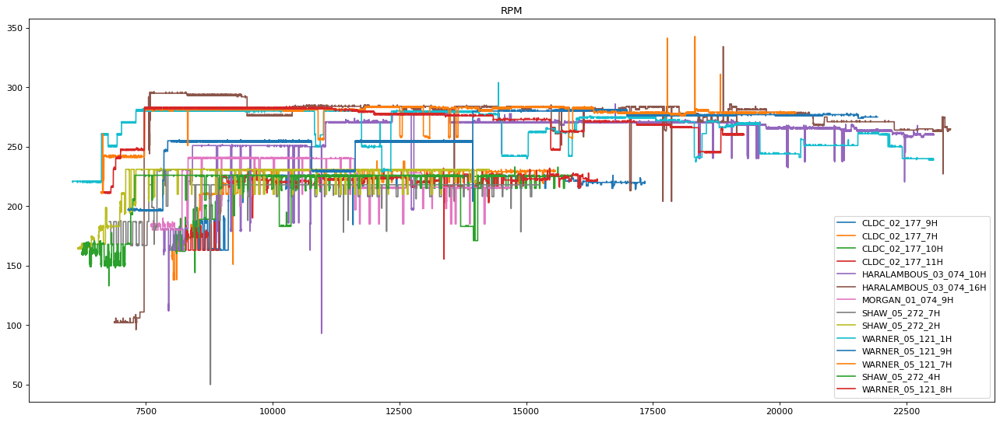

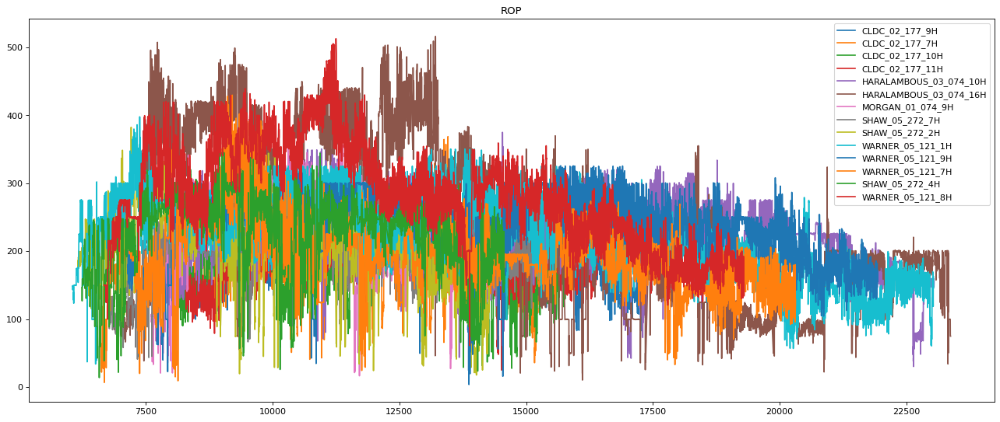

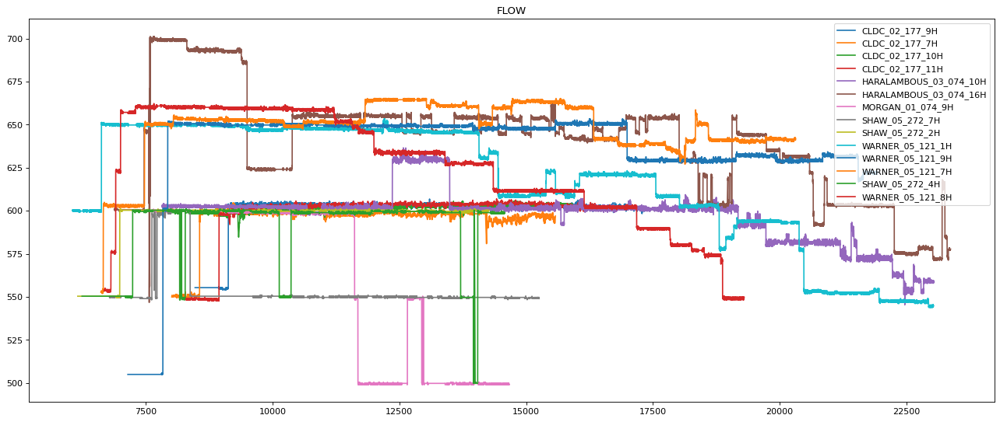

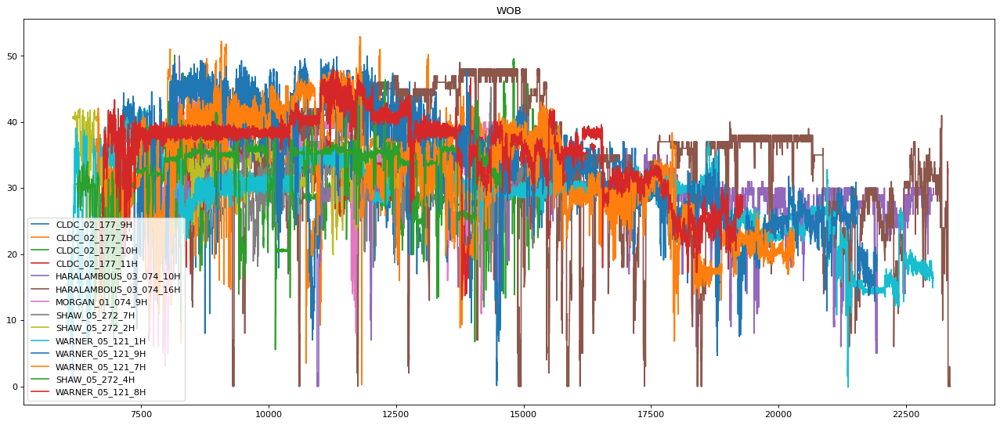

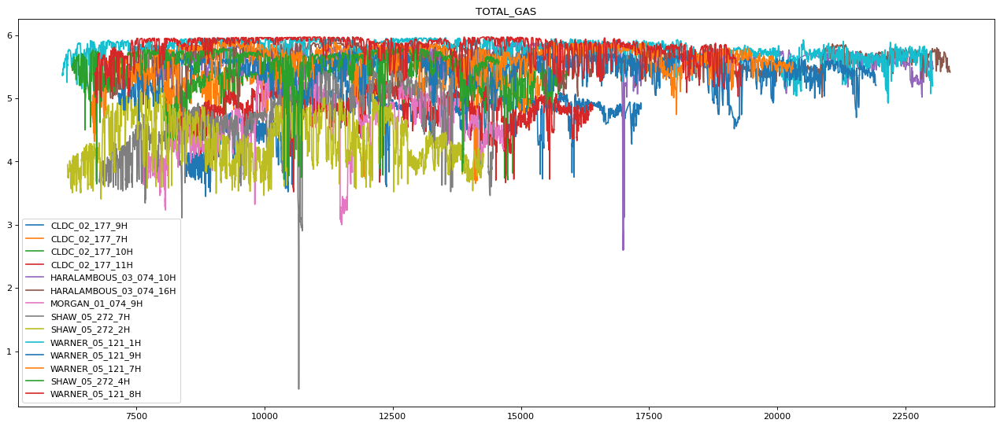

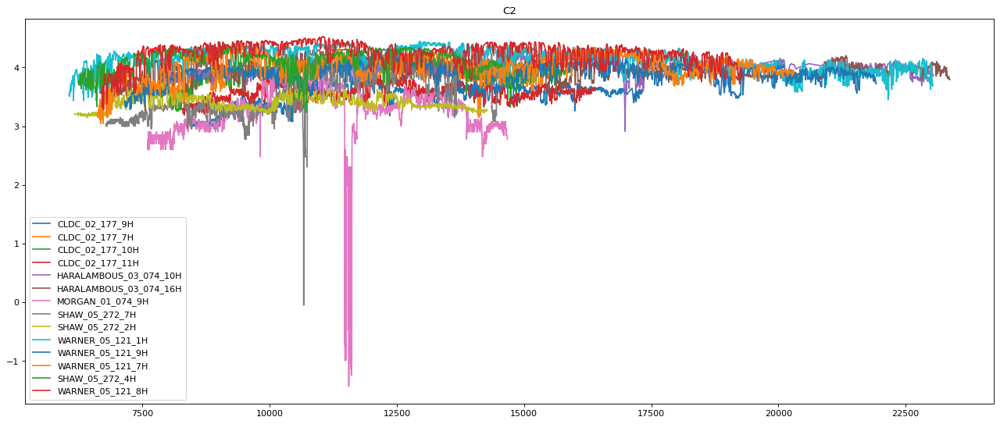

In [43]:
for feature in ["PHI"] + features_of_interest:

    fig, ax = matplotlib.pyplot.subplots(figsize=(20,8), dpi=80)

    for well in wells_used_for_training_the_developed_models + new_wells_ids:
        
        well_df = marcellus_porosity_dataset[marcellus_porosity_dataset['well_id'] == well].set_index('DEPTH')

        ax.plot(well_df[feature], label=well)
    
    matplotlib.pyplot.title(feature)
    matplotlib.pyplot.legend()
    matplotlib.pyplot.plot()


2. **Similarities heatmaps**: Statistical techniques such as Dynamic Time Warping or Kolmogorov-Smirnov distance are used to create similarity heat maps between the wells variables to determine whether or not they are similar.

Heatmaps legend:
0: CLDC_02_177_10H
1: CLDC_02_177_11H
2: CLDC_02_177_7H
3: CLDC_02_177_9H
4: HARALAMBOUS_03_074_10H
5: HARALAMBOUS_03_074_16H
6: MORGAN_01_074_9H
7: SHAW_05_272_2H
8: SHAW_05_272_4H
9: SHAW_05_272_7H
10: WARNER_05_121_1H
11: WARNER_05_121_7H
12: WARNER_05_121_8H
13: WARNER_05_121_9H


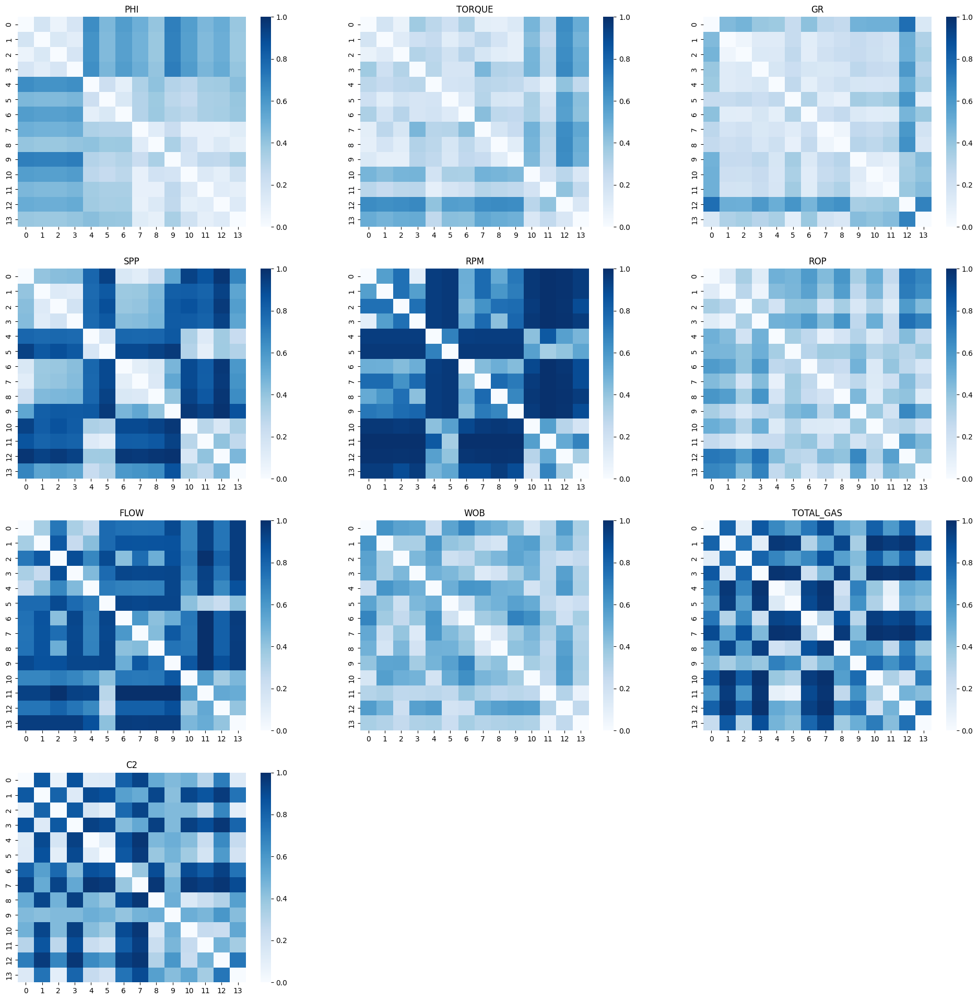

In [44]:
similarities = src.data_modelling.well_similarity.obtain_well_similarity_to_subset(
    zone=zone,
    df=marcellus_porosity_dataset,
    subset_names= wells_used_for_training_the_developed_models + new_wells_ids,
    features=["PHI"] + features_of_interest,
    distance='KS',
    plot=True,
    splitted_variables=True
)

The above heatmap matrices represent similarity between well variables using a color scheme to visually represent the degree of similarity or dissimilarity among variables. Technically, each cell in the heatmap matrix corresponds to the similarity score or distance metric between one variable in two wells. The color intensity in each cell is determined by the magnitude of the similarity or dissimilarity value. In this context, white color indicates high similarity, while blue color represents dissimilarity. For example, the cell in row 1 and column 2 of the PHI matrix shows the simillarity between the wells 1 and 2 in terms of the PHI variable.

Therefore, a thorough analysis of both the previously obtained plots and the similarity matrices must be performed to determine whether the new wells introduced are similar to those originally used and should be included in the training set. 

In this case, our wells of interest are SHAW_05_272_4H (well number 8) and WARNER_05_121_8H (well number 12). Analyzing the heatmap matrixes, it can be deduced that the similarity among the training wells and the WARNER_05_121_8H is quite low, as it is seen in TORQUE, ROP or GR variables. It can also be seen that SHAW_05_272_4H similarity to training wells seems to be higher.

This is why we consider that well WARNER_05_121_8H should not be included in the training set due to its low similarity to the training wells, whereas well SHAW_05_272_4H can be included. However, this inclusion does not ensure an improvement in the performance of the algorithm since this improvement depends on more factors than similarity, such as the quality of the data from this new well. 

Consequently, the new training subset should be: 

In [45]:
wells_used_for_re_training_the_developed_models = [
    'CLDC_02_177_9H',
    'CLDC_02_177_7H',
    'CLDC_02_177_10H',
    'CLDC_02_177_11H',
    'HARALAMBOUS_03_074_10H',
    'HARALAMBOUS_03_074_16H',
    'MORGAN_01_074_9H',
    'SHAW_05_272_7H',
    'SHAW_05_272_4H',
    'SHAW_05_272_2H',
    'WARNER_05_121_1H',
    'WARNER_05_121_9H',
    'WARNER_05_121_7H',
]

## 2.3. Re-training the models

Once the new wells have been read and processed, and their similarities to the original training wells have been analysed to determine the new training set, we can use the corresponding code of each algorithm to re-train the models. 

First, in the porosity algorithm case, the re-training can be performed using the ***train_porosity_model*** function from the ***src.porosity_model.train_model*** package, as shown in the following cell.

In [15]:
warnings.filterwarnings('ignore', category=FutureWarning)

retrained_original_porosity_model = src.porosity_model.train_model.train_porosity_model(
    zone=zone, 
    model_features=features_used_for_training_developed_porosity_model,
    training_wells_ids=wells_used_for_re_training_the_developed_models,
    model_output_file_name=retrained_model_name
)

[INFO] Reading and processing .csv...
[INFO] Training model...
XGBRegressor(base_score=None, booster=None, callbacks=None,
             colsample_bylevel=None, colsample_bynode=None,
             colsample_bytree=0.42435095389322064, early_stopping_rounds=None,
             enable_categorical=False, eval_metric=None, feature_types=None,
             gamma=None, gpu_id=None, grow_policy=None, importance_type=None,
             interaction_constraints=None, learning_rate=None, max_bin=None,
             max_cat_threshold=None, max_cat_to_onehot=None,
             max_delta_step=None, max_depth=2, max_leaves=None,
             min_child_weight=None, missing=nan, monotone_constraints=None,
             n_estimators=40, n_jobs=None, num_parallel_tree=None,
             predictor=None, random_state=0, ...)
{'n_estimators': 40, 'max_depth': 2, 'subsample': 0.40038030463445606, 'colsample_bytree': 0.42435095389322064}
0.01540290228937664
[INFO] Saving model...
[INFO] Model performance:
[INFO] 

Once the porosity model has been trained, it is saved in the following path: 

        CWS_DECOM_VS2/models/Marcellus/PHI/<retrained_model_name>.pkl

On the other hand, in the case of porosity quantile prediction algorithms, the function to be used for retraining is the ***train_porosity_quantiles_models*** function from the ***src.porosity_quantiles_model.train_model*** package.

In [17]:
retrained_original_quantiles_models = src.porosity_quantiles_model.train_model.train_porosity_quantiles_models(
    zone=zone, 
    model_features=features_used_for_training_developed_porosity_model,
    training_wells_ids=wells_used_for_re_training_the_developed_models,
    model_output_file_name=retrained_model_name
)

[INFO] Reading and processing .csv...
[INFO] Training models...
iteration 1
iteration 2
iteration 3
iteration 4
iteration 5
iteration 6
iteration 7
iteration 8
iteration 9
iteration 10
iteration 11
iteration 12
iteration 13
iteration 14
iteration 15
iteration 16
iteration 17
iteration 18
iteration 19
iteration 20
iteration 21
iteration 22
iteration 23
iteration 24
iteration 25
iteration 26
iteration 27
iteration 28
iteration 29
iteration 30
iteration 31
iteration 32
iteration 33
iteration 34
iteration 35
iteration 36
iteration 37
iteration 38
iteration 39
iteration 40
iteration 41
iteration 42
iteration 43
iteration 44
iteration 45
iteration 46
iteration 47
iteration 48
iteration 49
iteration 50
iteration 51
iteration 52
iteration 53
iteration 54
iteration 55
iteration 56
iteration 57
iteration 58
iteration 59
iteration 60
iteration 61
iteration 62
iteration 63
iteration 64
iteration 65
Model is well refined, NSGA2 is running...
Optimization done, get the front with .result.F and the s

As well as the porosity model, the models of the quantile prediction algorithms are stored in the following locations: 

        CWS_DECOM_VS2/models/Marcellus/PHI_QUANTILES/<retrained_model_name>_0.05.pkl
        CWS_DECOM_VS2/models/Marcellus/PHI_QUANTILES/<retrained_model_name>_0.5.pkl
        CWS_DECOM_VS2/models/Marcellus/PHI_QUANTILES/<retrained_model_name>_0.95.pkl

Finally, and analogously, re-training of the rock classification models are performed using the function ***train_curtains_model***, from package ***src.curtains_model.train_model*** package, as can be seen in the following cell.

In [22]:
retrained_original_curtains_case_2_model = src.curtains_model.train_model.train_curtains_model(
    zone=zone,
    curtains_case=2,
    model_features=features_used_for_training_developed_curtains_2_model,
    training_wells_ids=wells_used_for_re_training_the_developed_models,
    model_output_file_name=retrained_model_name,
)

[INFO] Reading and processing Marcellus_curtains_data_clean_merged.csv
[INFO] Training model...


   CHECK ON SPLITTING
Fold 0:
  Train (#elements=82610):
                 ('CLDC_02_177_11H', 5488)
                 ('CLDC_02_177_7H', 5105)
                 ('CLDC_02_177_9H', 5292)
                 ('HARALAMBOUS_03_074_10H', 11406)
                 ('HARALAMBOUS_03_074_16H', 12069)
                 ('MORGAN_01_074_9H', 4899)
                 ('SHAW_05_272_2H', 5589)
                 ('SHAW_05_272_4H', 5587)
                 ('SHAW_05_272_7H', 6242)
                 ('WARNER_05_121_7H', 9895)
                 ('WARNER_05_121_9H', 11038)

  Train (#elements=82610):

  Test (#elements=17801):
                 ('CLDC_02_177_10H', 5322)
                 ('WARNER_05_121_1H', 12479)
Unique classes test: [0 1 2]
Class 0 has originally 3313 elements.
Class 1 has originally 4019 elements.
Class 2 has originally 10469 elements.
Fold 1:
  Train (#elements=82854):
                 ('CLDC_02_177_10H'

[Parallel(n_jobs=-1)]: Using backend LokyBackend with 8 concurrent workers.
[Parallel(n_jobs=-1)]: Done   2 out of   5 | elapsed:   24.1s remaining:   36.2s
[Parallel(n_jobs=-1)]: Done   3 out of   5 | elapsed:   24.5s remaining:   16.3s
[Parallel(n_jobs=-1)]: Done   5 out of   5 | elapsed:   25.2s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 8 concurrent workers.
[Parallel(n_jobs=-1)]: Done   2 out of   5 | elapsed:   14.3s remaining:   21.4s
[Parallel(n_jobs=-1)]: Done   3 out of   5 | elapsed:   14.4s remaining:    9.6s
[Parallel(n_jobs=-1)]: Done   5 out of   5 | elapsed:   14.9s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 8 concurrent workers.
[Parallel(n_jobs=-1)]: Done   2 out of   5 | elapsed:   13.6s remaining:   20.4s
[Parallel(n_jobs=-1)]: Done   3 out of   5 | elapsed:   13.8s remaining:    9.2s
[Parallel(n_jobs=-1)]: Done   5 out of   5 | elapsed:   14.3s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 8 concurrent worker

XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=1.0, early_stopping_rounds=None,
              enable_categorical=False, eval_metric=None, feature_types=None,
              gamma=0.5, gpu_id=None, grow_policy=None, importance_type=None,
              interaction_constraints=None, learning_rate=0.01, max_bin=None,
              max_cat_threshold=None, max_cat_to_onehot=None,
              max_delta_step=None, max_depth=7, max_leaves=None,
              min_child_weight=None, missing=nan, monotone_constraints=None,
              n_estimators=97, n_jobs=None, num_parallel_tree=None,
              objective='multi:softprob', predictor=None, ...)
{'colsample_bytree': 1.0, 'gamma': 0.5, 'learning_rate': 0.01, 'max_depth': 7.240172609010736, 'n_estimators': 97.19931288833209, 'reg_alpha': 1.0, 'reg_lambda': 0.14437918598752303, 'subsample': 0.8}
0.5687031322059519
[INFO] SW_Category Train 

In [24]:
retrained_original_curtains_case_3_model = src.curtains_model.train_model.train_curtains_model(
    zone=zone,
    curtains_case=3,
    model_features=features_used_for_training_developed_curtains_3_model,
    training_wells_ids=wells_used_for_re_training_the_developed_models,
    model_output_file_name=retrained_model_name
)

[INFO] Reading and processing Marcellus_curtains_data_clean_merged.csv
[INFO] Training model...


   CHECK ON SPLITTING
Fold 0:
  Train (#elements=83683):
                 ('CLDC_02_177_10H', 5322)
                 ('CLDC_02_177_11H', 5488)
                 ('CLDC_02_177_7H', 5105)
                 ('CLDC_02_177_9H', 5292)
                 ('HARALAMBOUS_03_074_10H', 11406)
                 ('HARALAMBOUS_03_074_16H', 12069)
                 ('SHAW_05_272_2H', 5589)
                 ('WARNER_05_121_1H', 12479)
                 ('WARNER_05_121_7H', 9895)
                 ('WARNER_05_121_9H', 11038)

  Train (#elements=83683):
             Class 0 has originally 42771 elements.
             Class 1 has originally 57640 elements.
   Class to balance original  count  percentage
0                          0  42771        42.6
1                          1  57640        57.4
(83683, 9) (83683,)
             Class 0 has after resampling 45836 elements.
             Class 1 has after resampling 4

[Parallel(n_jobs=-1)]: Using backend LokyBackend with 8 concurrent workers.
[Parallel(n_jobs=-1)]: Done   2 out of   5 | elapsed:   28.1s remaining:   42.2s
[Parallel(n_jobs=-1)]: Done   3 out of   5 | elapsed:   28.2s remaining:   18.8s
[Parallel(n_jobs=-1)]: Done   5 out of   5 | elapsed:   29.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 8 concurrent workers.
[Parallel(n_jobs=-1)]: Done   2 out of   5 | elapsed:    8.5s remaining:   12.8s
[Parallel(n_jobs=-1)]: Done   3 out of   5 | elapsed:   10.3s remaining:    6.9s
[Parallel(n_jobs=-1)]: Done   5 out of   5 | elapsed:   10.6s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 8 concurrent workers.
[Parallel(n_jobs=-1)]: Done   2 out of   5 | elapsed:   30.5s remaining:   45.8s
[Parallel(n_jobs=-1)]: Done   3 out of   5 | elapsed:   30.6s remaining:   20.4s
[Parallel(n_jobs=-1)]: Done   5 out of   5 | elapsed:   32.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 8 concurrent worker

XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=0.5301273573537217, early_stopping_rounds=None,
              enable_categorical=False, eval_metric=None, feature_types=None,
              gamma=0.3455358329344827, gpu_id=None, grow_policy=None,
              importance_type=None, interaction_constraints=None,
              learning_rate=0.43685706136858776, max_bin=None,
              max_cat_threshold=None, max_cat_to_onehot=None,
              max_delta_step=None, max_depth=6, max_leaves=None,
              min_child_weight=None, missing=nan, monotone_constraints=None,
              n_estimators=90, n_jobs=None, num_parallel_tree=None,
              predictor=None, random_state=0, ...)
{'n_estimators': 90, 'max_depth': 6, 'subsample': 0.2546772509905398, 'gamma': 0.3455358329344827, 'reg_alpha': 0.43602059197347554, 'reg_lambda': 0.02025997522018817, 'learning_rate': 0.43685706136

In the same way as porosity models, the re-trained curtains models are saved in the following paths:

        CWS_DECOM_VS2/models/Marcellus/CURTAINS_2/<retrained_model_name>.pkl
        CWS_DECOM_VS2/models/Marcellus/CURTAINS_3/<retrained_model_name>.pkl

## 2.4. Evaluating the models

Once the models have been trained using the new training set, they must be evaluated to check whether there has been an improvement in the performance of the original models after the inclusion of the new data or, on the contrary, only redundant information has been introduced and the performance is the same or even worse. 

For this purpose, different metrics associated with each algorithm must be calculated to measure the performance of each of the models. Depending on the objective of each of the algorithms, these metrics will vary. To calculate each of them, it is necessary to establish the set of wells over which they will be calculated. In this example, the validation set consists on the following wells: 

- CLDC_02_177_8H
- CUMMINGS_01_081_7H
- MORGAN_01_074_6H

In [46]:
wells_used_for_validating_the_retrained_model = [
    'CLDC_02_177_8H',
    'CUMMINGS_01_081_7H',
    'MORGAN_01_074_6H',
]

### 2.4.1. Evaluating porosity models

In first place, for evaluating porosity model results, the following two metrics are considered: 

1. **MAE (Mean Absolute Error)**:

    The Mean Absolute Error (MAE) measures the average absolute difference between the observed porosity values and the predicted ones. 
    
    It reflects the average magnitude of errors without considering their sign. 
    
    A lower MAE indicates better accuracy.

2. **RMSE (Root Mean Squared Error)**:

    The Root Mean Squared Error (RMSE) calculates the square root of the average of the squared differences between the observed and predicted porosity values. 
    
    It offers a measure of the overall magnitude of errors, assigning more weight to larger errors. 
    
    Importantly, RMSE is in the same unit as the target variable. 
    
    As well as the MAE metric, a lower RMSE is indicative of better accuracy.

In [47]:
porosity_scores = {}

for well in wells_used_for_validating_the_retrained_model:

    well_df = marcellus_porosity_dataset[marcellus_porosity_dataset['well_id'] == well].set_index('DEPTH')

    well_predicted_porosity = src.porosity_model.predict_model.predict(
        zone=zone,
        input_data=well_df,
        model_name=retrained_model_name
    )

    well_mae = sklearn.metrics.mean_absolute_error(
        well_df["PHI"].values,
        well_predicted_porosity
    )

    well_rmse = sklearn.metrics.mean_squared_error(
        well_df["PHI"].values,
        well_predicted_porosity,
        squared=False
    )

    porosity_scores[well] = {
        'MAE': well_mae,
        'RMSE': well_rmse
    }

display(pandas.DataFrame(porosity_scores).round(4).T)

,MAE,RMSE
CLDC_02_177_8H,0.0117,0.0134
CUMMINGS_01_081_7H,0.0045,0.0066
MORGAN_01_074_6H,0.0056,0.0069


In second place, for the evaluation of porosity quantiles predictions, the following metrics are calculated:

1. **PICP (Prediction Interval Coverage Probability)**:

    Measures the percentage of observed porosity values (PHI) that fall within the predicted 5-95% quantile range (PHI_PRED_05 to PHI_PRED_95).
    
    High PICP indicates the model's ability to provide accurate and reliable prediction intervals.
    
2. **PICP Prediction (Prediction Interval Coverage Probability for Predictions)**:

    Similar to PICP but applied to the predicted porosity values (PHI_PRED) rather than observed values.
    
    Assesses how well the prediction intervals cover the predicted values.

3. **PINAW (Prediction Interval Normalized Average Width)**:

    Measures the average width of the prediction intervals normalized by the range of the target variable.

    A lower PINAW suggests narrower and more precise prediction intervals.

4. **PWC (Prediction Interval Width Criterion)**:

    Combines the PICP and PINAW into a single metric to evaluate the overall performance of prediction intervals.

    Balances the trade-off between coverage probability and interval width. In this case, the interval width is 90.

    Higher PWC indicates a better trade-off between coverage and precision.


In [48]:
porosity_quantiles_scores = {}

for well in wells_used_for_validating_the_retrained_model:

    well_df = marcellus_porosity_dataset[marcellus_porosity_dataset['well_id'] == well].set_index('DEPTH')

    well_predicted_porosity = src.porosity_model.predict_model.predict(
        zone=zone,
        input_data=well_df,
        model_name=retrained_model_name
    )

    well_predicted_porosity_005 = src.porosity_quantiles_model.predict_model.predict(
        zone=zone,
        input_data=well_df,
        model_name=f"{retrained_model_name}_0.05"
    )

    well_predicted_porosity_050 = src.porosity_quantiles_model.predict_model.predict(
        zone=zone,
        input_data=well_df,
        model_name=f"{retrained_model_name}_0.5"
    )

    well_predicted_porosity_095 = src.porosity_quantiles_model.predict_model.predict(
        zone=zone,
        input_data=well_df,
        model_name=f"{retrained_model_name}_0.95"
    )

    picp = src.data_modelling.quantile_regression.prediction_interval_coverage_probability(
        well_df["PHI"],
        well_predicted_porosity_005, 
        well_predicted_porosity_095
    )

    picp_pred = src.data_modelling.quantile_regression.prediction_interval_coverage_probability(
        well_predicted_porosity,
        well_predicted_porosity_005, 
        well_predicted_porosity_095
    )

    pinaw = src.data_modelling.quantile_regression.prediction_interval_normalized_average_width(
        well_predicted_porosity, 
        well_predicted_porosity_005, 
        well_predicted_porosity_095, 
    )

    cwc = src.data_modelling.quantile_regression.coverage_width_based_criterion(
        90, 
        picp, 
        pinaw
    )

    porosity_quantiles_scores[well] = {
        "PICP": picp,
        "PICP Prediction": picp_pred,
        "PINAW": pinaw,
        "PWC": cwc,
    }
    
display(pandas.DataFrame(porosity_quantiles_scores).round(4).T)

,PICP,PICP Prediction,PINAW,PWC
CLDC_02_177_8H,0.8918,0.9904,1.9570,475.9746
CUMMINGS_01_081_7H,0.9865,0.9927,1.4942,363.0339
MORGAN_01_074_6H,0.9854,0.9912,2.2033,535.3185


### 2.4.2. Evaluating curtains models

In third and last place, metrics for evaluating the curtains models are calculated. The main metric calculated for this purpose is the accuracy score:

1. **Accuracy score**: This metric measures the number of correct predictions made by the model in relation to the total number of predictions made. In other words, it reflects the percentage of correct predicted samples divided by 100.

In [49]:
curtains_case_2_marcellus_dataset = src.processing.training_processing.append_curtains_ids_to_dataframe(
    curtains_case=2,
    df=marcellus_curtains_dataset
)

curtains_case_3_marcellus_dataset = src.processing.training_processing.append_curtains_ids_to_dataframe(
    curtains_case=3,
    df=marcellus_curtains_dataset
)

In [50]:
curtains_scores = {}

for well_id in wells_used_for_validating_the_retrained_model:

    curtains_case_2_well_df = curtains_case_2_marcellus_dataset.query(f"well_id==\"{well_id}\"")

    curtains_case_3_well_df = curtains_case_3_marcellus_dataset.query(f"well_id==\"{well_id}\"")
    
    curtains_case_2_well_predictions = src.curtains_model.predict_model.predict(
        zone=zone, 
        curtains_case=2,
        input_data=curtains_case_2_well_df,
        model_name=retrained_model_name
    )

    curtains_case_3_well_predictions = src.curtains_model.predict_model.predict(
        zone=zone, 
        curtains_case=3,
        input_data=curtains_case_3_well_df,
        model_name=retrained_model_name
    )

    curtains_case_2_accuracy = sklearn.metrics.accuracy_score(
        y_true=curtains_case_2_well_df['RW_CURTAIN_IDS'],
        y_pred=curtains_case_2_well_predictions['CURTAINS'],
    )

    curtains_case_3_accuracy = sklearn.metrics.accuracy_score(
        y_true=curtains_case_3_well_df['RW_CURTAIN_IDS'],
        y_pred=curtains_case_3_well_predictions['CURTAINS'],
    )

    curtains_scores[well_id] = {
        'Curtains Case 2 Accuracy Score': curtains_case_2_accuracy,
        'Curtains Case 3 Accuracy Score': curtains_case_3_accuracy,
    }
    
display(pandas.DataFrame(curtains_scores).round(4).T)

,Curtains Case 2 Accuracy Score,Curtains Case 3 Accuracy Score
CLDC_02_177_8H,0.7577,0.6860
CUMMINGS_01_081_7H,0.7075,0.6953
MORGAN_01_074_6H,0.5478,0.5892


Therefore, using these metrics and comparing them with those obtained with the original models, it can be determined whether the inclusion of the new wells has favoured and increased the performance of the model or not.

# 3. Creating new models for new geographies

## Introduction

During the InGAIA project, algorithms with different objectives were developed for the geographical regions of Libya and Marcellus. In addition to these two regions, the code developed allows the creation of models for new geographical areas. 

In order to do this, the following steps must be taken: 

1. **Read and process the data**: The information from the wells associated with the new geographical region must be read and processed in order to be able to work with it. It is important to note that the code developed for this step is based on the data format of the Libya and Marcellus regions, so if the data of the new geographic area does not conform to this format, the current code will not work correctly. 

2. **Similarity analysis**: Using statistical techniques, a similarity analysis between wells must be performed to identify wells with anomalous behaviour. This step is key to determining the appropriate set of wells for model training, as this training set should be selected based on the similarity analysis to ensure uniformity and technical feasibility of the training wells.

3. **Training the models**: Once the set is selected, and using the designed code associated with each of the algorithms, the different models must be trained. 

4. **Evaluation of the models**: Finally, once the models have been trained, they need to be evaluated to ensure their correct performance. This process can be done by calculating the performance metrics of the models, and if these metrics are not as expected, the models must be retrained by varying parameters such as input variables or training wells.

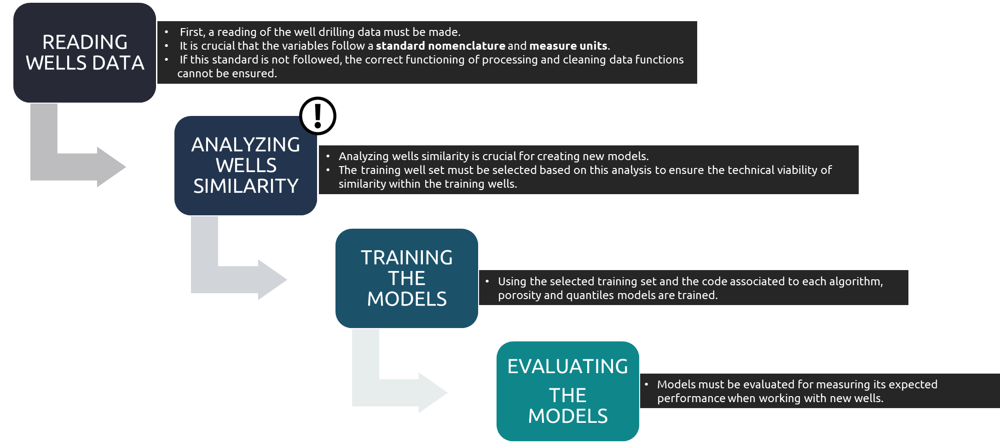

In this example, and to illustrate the process of creating a new model, we will focus on using all the wells named as CLDC as our new geographical zone. This geographical zone is composed of the following wells: 

    - CLDC_02_177_7H
    - CLDC_02_177_8H
    - CLDC_02_177_9H
    - CLDC_02_177_10H
    - CLDC_02_177_11H

Additionally, some parameters must be set for saving configuration parameters for the new models like, for example the features used for training the new models.

In [51]:
# List of wells IDs for creating new models
new_wells_ids = [
    'CLDC_02_177_7H',
    'CLDC_02_177_8H',
    'CLDC_02_177_9H',
    'CLDC_02_177_10H',
    'CLDC_02_177_11H',
]

# List of feature names used for training the new models
features_used_for_training_the_new_models = [
    "ROP",
    "GR",
    "C2",
    "RPM",
]

# Name for saving all the new models
new_model_name = 'XGBoost_for_CLDC_region'

## 3.1. Reading wells data

In order to use the information from the wells in the new geographic region, the wells must be read to conform to the expected data format. They also need to be cleaned to avoid introducing anomalous data or noise into the models.

### 3.1.1. Wells data reading

In order to load new well data according to Marcellus region data format, a number of guidelines must be followed in terms of file type, name, location and data format. These guidelines are:

1. **File type**: Data for each well should be collected in several *.las* or *.csv* files. That files must follow the following structure:
    
    - ***Drilling data***: All the drilling variables such as ROP, WOB or GR must be contained in the same file.
    - ***Petro data***: In this file, petro-physics variables must be contained. Most important ones are PHI and SW.
    - ***Curtains data***: Curtains completion data must be collected in this file.

3. **Files names and paths**: All of the files described above must follow guidelines for their name and path. These are listed in the table below:

| File | Information | File name | Path | 
|:-|:-:|:-|:-:|
| Drilling data | ROP,GR,WOB,...    | The structure of the data file name must be *\<initial_depth\>m\_\<final_depth\>m_\<well_id\>* or *\<initial_depth\>ft_\<final_depth\>ft_\<well_id\>*, depending on the depth measure unit.  | CWS_DECOM_VS2/data/Marcellus/raw/SITECOM WELLS/WELLS DATA | 
| Petro data    | PHI & SW             | Data file name must contain the **exact** well id. | CWS_DECOM_VS2/data/Marcellus/raw/SITECOM WELLS/PETRO DATA | 
| Curtains data | Curtains information | Data file name must contain the **exact** well id. | CWS_DECOM_VS2/data/Marcellus/raw/CURTAINS DATA | 
    For example, a valid name for a drilling data file is 32.31m_5886.3m_WARNER_05_121_8H, for a petro data file is Warner_05_121_8H_dynamic_logs_petrophysics and for a curtains data file is Warner_05_121_8H_Curtains_for_Completions.


6. **Data format**: For correct processing and extraction of well data it is essential that each of this file maintain a structured format.

    Firstly, the drilling data file must be a ***.csv*** file that follows the following formatting guidelines:

    - The value separator must be the comma character (',') and the decimal separator must be the dot character ('.').
    - The first line of the file must contain the name of each variable contained in the file. 
    - The second row of the file must contain the measure units of each of these variables. 
    - The following rows must contain the variables data in standard dataframe format. It is recommended that there is a single sample for each depth value. 

Secondly, the petro data file can be either a ***.csv*** file following the same guidelines as described above for the drilling data file, or a ***.las*** file containing the porosity and water saturation information of the well. 

Finally, the curtains data file must be a ***.csv*** file containing the information of the rock type in each drilling depth. 

The following cells serves as an example of the format that must be followed by each of the mentioned files.

In [11]:
print("\n----------------- DRILLING DATA FILE -----------------\n")

drilling_example_file_path = '../../data/Marcellus/raw/SITECOM WELLS/WELLS DATA/32.31m_5886.3m_WARNER_05_121_8H.csv'

with open(drilling_example_file_path, 'r') as f:
    content = f.readlines()[:10]
    for line in content:
        print(line, end="")

print("\n----------------- PETRO DATA FILE -----------------\n")

drilling_example_file_path = '../../data/Marcellus/raw/SITECOM WELLS/PETRO DATA/Warner_05_121_8H_dynamic_logs_petrophysics.las'

with open(drilling_example_file_path, 'r') as f:
    content = f.readlines()[:30]
    for line in content:
        print(line, end="")
        
print("\n----------------- CURTAINS DATA FILE -----------------\n")

curtains_example_file_path = '../../data/Marcellus/raw/CURTAINS DATA/Warner_05_121_8H_Curtains_for_Completions.csv'

with open(curtains_example_file_path, 'r') as f:
    content = f.readlines()[:10]
    for line in content:
        print(line, end="")


----------------- DRILLING DATA FILE -----------------

DEPTH,3GAS,ADEP,AZ,BDEP,GAM,HDIAM,INCL,PC1G,PC2G,PC3G,PC4G,PC5G,PGAS,PGASP,PIC4G,PNC4G,PTGN,SPP,TGAS,TOR,WOB,CTOR,OBR,TPO,BR
m,%,ft,dega,ft,gAPI,in,dega,ppm,ppm,ppm,ppm,ppm,ppm,ppm,ppm,ppm,ppm,psi,ppm,Euc,klbf,kft.lbf,ft/h,galUS/min,rpm
32.614,0,107.01,53.23,107,-999.25,8.5,0.3,0,400,0,200,0,600,600,100,100,600,602.5,600,16.276,25.2,16.276,107.45,441.76,146
32.918,0,108.01,53.23,108,-999.25,8.5,0.3,0,300,0,200,0,500,500,100,100,500,422.5,500,18.085,25.5,18.085,115.56,441.76,146
33.223,0,109,53.23,109,-999.25,8.5,0.3,0,400,0,200,0,500,500,100,100,500,446.25,500,14.851,24.1,14.851,118.93,441.76,146
33.528,0,110,53.23,110,-999.25,8.5,0.3,0,400,0,200,0,500,500,100,100,600,421.25,600,15.071,22.4,15.071,103.9,441.76,146
33.833,0,111,53.23,111,-999.25,8.5,0.3,0,400,0,200,0,500,500,100,100,600,426.25,600,14.413,22.5,14.413,88.5,441.76,146
34.138,0,112,53.23,112,-999.25,8.5,0.3,0,400,0,200,0,500,500,100,100,600,407.5,600,13.536,22.1,13.53

Furthermore, for the correct functioning of the reading and processing functions, it is advisory to follow some naming and measurement standards. The below table lists the necessary variables that must be contained in this file, among these mentioned standards. 

| Variable              | Variable name                  | Measure unit           |
|--------------------------|---------------------------|------------------------|
| Depth                    | DEPTH                     | ft |
| Gamma Ray                | GR                        | gAPI |
| Rate of Penetration      | ROP                       | ft/h |
| Flow                     | FLOW                      | gpm |
| Weight on Bit            | WOB                       | klbf |
| Revolutions per Minute   | RPM                       | rpm |
| Standpipe Pressure       | SPP                       | psi |
| Torque                   | TORQUE                    | kft.lbf |
| C1 Gas                   | C1                        | ppm |
| C2 Gas                   | C2                        | ppm |
| C3 Gas                   | C3                        | ppm |
| C4 Gas                   | C4                        | ppm |
| C5 Gas                   | C5                        | ppm |
| Total Gas                | TOTAL_GAS                 | ppm |
| Porosity                 | PHI                       | m3/m3 |

Once the new wells have been added following the instructions detailed before, the process of reading, loading and processing this new data is quite simple.

This process is done using the function ***make_porosity_dataset*** of the package ***src.data.make_porosity_dataset***:

In [4]:
import src.data.make_porosity_dataset

help(src.data.make_porosity_dataset.make_porosity_dataset)

Help on function make_porosity_dataset in module src.data.make_porosity_dataset:

make_porosity_dataset(*, zone: str, save_file: bool = True, verbose: bool = False) -> pandas.core.frame.DataFrame
    Generate training dataset for porosity prediction.
    
    Parameters:
        - zone (str): Zone where the data belongs to.
        - save_file (bool, optional): Flag for determining if creating and saving the dataset in a file.
        - verbose (bool, optional): Defaults to False.
    
    Returns:
        - pandas.DataFrame: Dataset prepared for training.



The training dataset can be build up as follows: 

In [5]:
warnings.filterwarnings('ignore', category=FutureWarning, module='welly')

marcellus_porosity_dataset = src.data.make_porosity_dataset.make_porosity_dataset(
    zone=zone,
    save_file=True,
    verbose=False,
)


[INFO] Triggering analysis for CLDC (02-177) 9H well.

[INFO] Triggering analysis for CLDC_02-177-07_7H well.

[INFO] Triggering analysis for CLDC_02-177-08_8H well.

[INFO] Triggering analysis for CLDC_02-177-10_10H well.

[INFO] Triggering analysis for CLDC_02-177-11_11H well.

[INFO] Triggering analysis for CUMMINGS LUMBER (01-081) 7H well.

[INFO] Triggering analysis for DCNR 587 (02-003-09) 9H well.

[INFO] Triggering analysis for DCNR 587 02-017-05 well.

[INFO] Triggering analysis for DCNR_587-02-003-11H well.

[INFO] Triggering analysis for DCNR_587-02-003-13H well.

[INFO] Triggering analysis for DCNR_587-02-003-15H well.

[INFO] Triggering analysis for HARALAMBOUS 03-074-10H well.

[INFO] Triggering analysis for HARALAMBOUS 03-074-16H well.

[INFO] Triggering analysis for JOHNSON (02-135) 13H well.

[INFO] Triggering analysis for JOHNSON (02-135) 14H well.

[INFO] Triggering analysis for JOHNSON (02-135) 1H well.


Only engine='normal' can read wrapped files
Only engine='normal' can read wrapped files



[INFO] Triggering analysis for JOHNSON_02-135-07_K_7H well.

[INFO] Triggering analysis for MORGAN 01-074-06H well.

[INFO] Triggering analysis for MORGAN 01-074-09H well.

[INFO] Triggering analysis for OMR 02-188-04H ST1 well.

[INFO] Triggering analysis for OMR_02-188-03_3H well.

[INFO] Triggering analysis for SHAW J 05-272-7H well.


Only engine='normal' can read wrapped files
Only engine='normal' can read wrapped files



[INFO] Triggering analysis for SHAW J 05-272-8H well.


Only engine='normal' can read wrapped files
Only engine='normal' can read wrapped files



[INFO] Triggering analysis for SHAW_05-272-02_J_2H well.

[INFO] Triggering analysis for WARNER (05-121-01) W 1H well.

[INFO] Triggering analysis for Warner (05-121-09) 9H well.

[INFO] Triggering analysis for warner_05-121-07_w_7h well.

[INFO] Triggering analysis for SHAW_05_272_4H well.

[INFO] Triggering analysis for WARNER_05_121_8H well.
[INFO] Porosity training dataset for Marcellus region process finished.
[INFO] The training file is located at C:\Users\dgonza22\OneDrive - Capgemini\Desktop\Repsol\CWS_DECOM_V2\data\Marcellus\processed/Marcellus_clean_data_interest_zone_interpolation.csv.

[INFO] The available wells for training are:
	CLDC_02_177_9H
	CLDC_02_177_7H
	CLDC_02_177_8H
	CLDC_02_177_10H
	CLDC_02_177_11H
	CUMMINGS_01_081_7H
	DCNR_02_003_9H
	DCNR 587 02-017-05
	DCNR_02_003_11H
	DCNR_02_003_13H
	DCNR_02_003_15H
	HARALAMBOUS_03_074_10H
	HARALAMBOUS_03_074_16H
	JOHNSON_02_135_13H
	JOHNSON_02_135_14H
	JOHNSON_02_135_1H
	JOHNSON_02_135_7H
	MORGAN_01_074_6H
	MORGAN_01_074_9

After running this function, several datasets containing all wells data are created and saved in the path:

        CWS_DECOM_VS2/data/Marcellus/processed

The following table explains the created datasets: 

<div style="display: flex; justify-content: center; align-items: center;">

| Dataset name | Description |
|:-------|:-------|
| Marcellus_raw_data | File containing raw data information for all wells in the Marcellus zone, grouped by well IDs. |
| Marcellus_raw_data_interest_zone | Subset of raw data focusing on the specific zone of interest within the Marcellus zone. |
| Marcellus_raw_data_interest_zone_interpolation | Interpolated data for the interest zone, filling missing values and providing a continuous dataset. |
| Marcellus_clean_data_interest_zone_interpolation | Cleaned and pre-processed data for the interest zone, removing outliers and ensuring data quality. |
| Marcellus_clean_smooth_data_interest_zone_interpolation | Smoothed version of the cleaned data for the interest zone, reducing noise and fluctuations in the dataset. |

</div>

It is important to note that from all this datasets, the one that will be used by default for training the models associated to porosity is the ***Marcellus_clean_data_interest_zone_interpolation*** one.

In addition, in order to train the rock type classification models, it is necessary to run the following function, which processes the curtain files and combines them with the information available for each well. 

In [6]:
warnings.filterwarnings('ignore', category=FutureWarning, module='welly')

marcellus_curtains_dataset = src.data.make_curtains_dataset.make_curtains_dataset(
    zone=zone,
    verbose=False,
)


[INFO] Triggering analysis for CLDC_02_177_10H well.

[INFO] Triggering analysis for CLDC_02_177_11H well.

[INFO] Triggering analysis for CLDC_02_177_7H well.

[INFO] Triggering analysis for CLDC_02_177_8H well.

[INFO] Triggering analysis for CLDC_02_177_9H well.

[INFO] Triggering analysis for CUMMINGS_01_081_7H well.

[INFO] Triggering analysis for DCNR 587 02-017-05 well.

[INFO] Triggering analysis for DCNR_02_003_11H well.

[INFO] Triggering analysis for DCNR_02_003_13H well.

[INFO] Triggering analysis for DCNR_02_003_15H well.

[INFO] Triggering analysis for DCNR_02_003_9H well.

[INFO] Triggering analysis for HARALAMBOUS_03_074_10H well.

[INFO] Triggering analysis for HARALAMBOUS_03_074_16H well.

[INFO] Triggering analysis for JOHNSON_02_135_13H well.

[INFO] Triggering analysis for JOHNSON_02_135_14H well.

[INFO] Triggering analysis for JOHNSON_02_135_1H well.

[INFO] Triggering analysis for JOHNSON_02_135_7H well.

[INFO] Triggering analysis for MORGAN_01_074_6H well.



In the same way as the porosity dataset, after running the ***make_curtains_dataset*** function, several datasets are created and saved in the following path:

        CWS_DECOM_VS2/data/Marcellus/processed

The following table explains the created datasets: 

<div style="display: flex; justify-content: center; align-items: center;">

| Dataset name | Description |
|:-------|:-------|
| Marcellus_curtains_data_clean_merged | Cleaned and pre-processed data for the interest zone among the information of rock classification in each depth sample. |
| Marcellus_curtains_data_clean_smooth_merged | Smoothed version of the cleaned data for the interest zone, among the information of rock classification in each depth sample. |
</div>

From all this datasets, the one that will be used by default for making the curtains classification models training is the one called by ***Marcellus_curtains_data_clean_merged***.

### 3.1.2. Wells visualizations

After loading and processing the wells data, the next step is to analyse this data before training the models. The main goals of this task is identifying patterns, outliers, and potential correlations among drilling parameters and porosity variable, providing a basis for informed decision making feature and wells selection during the subsequent model training phase.

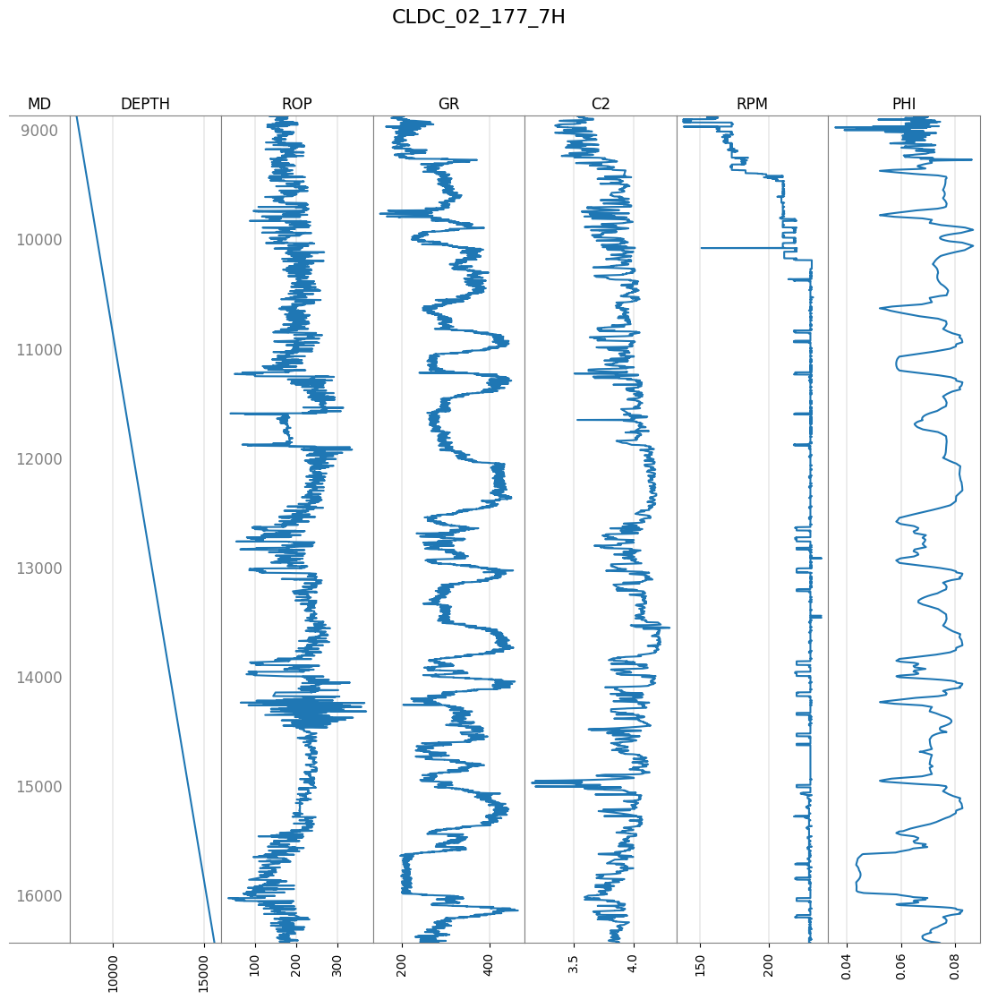

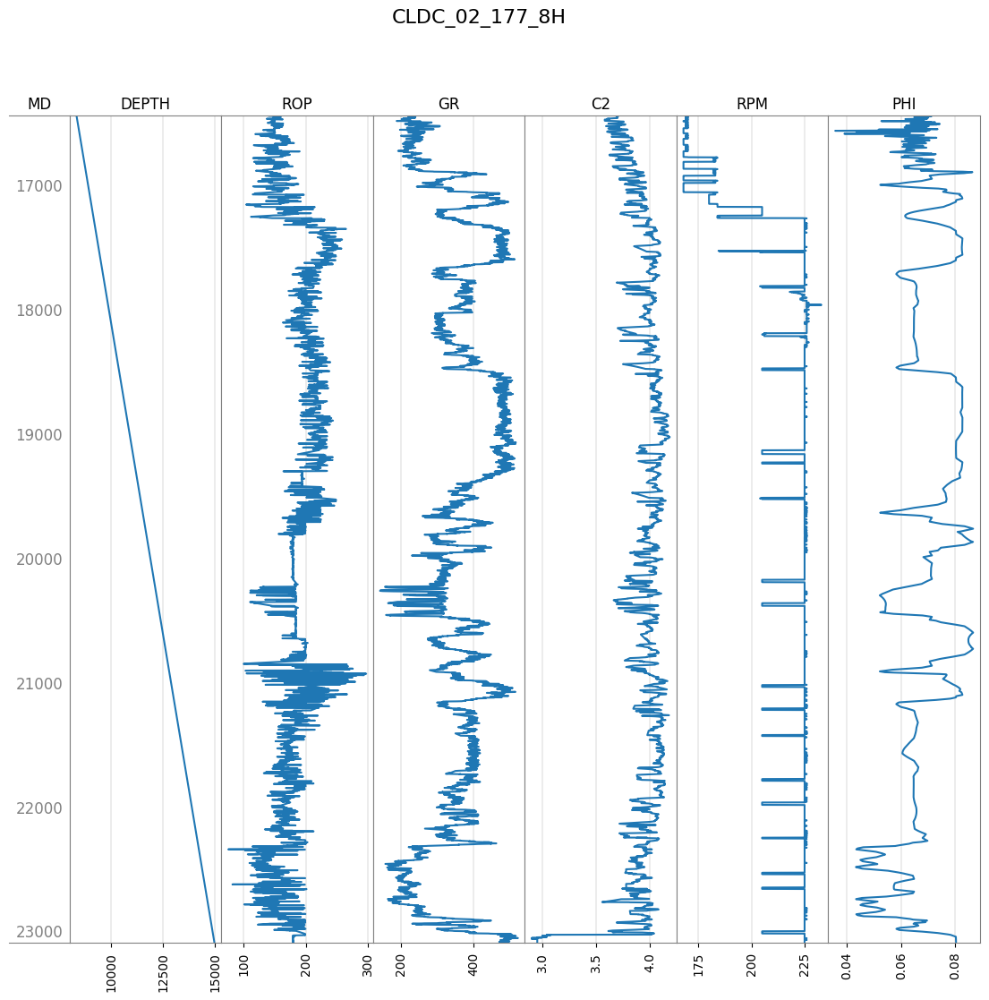

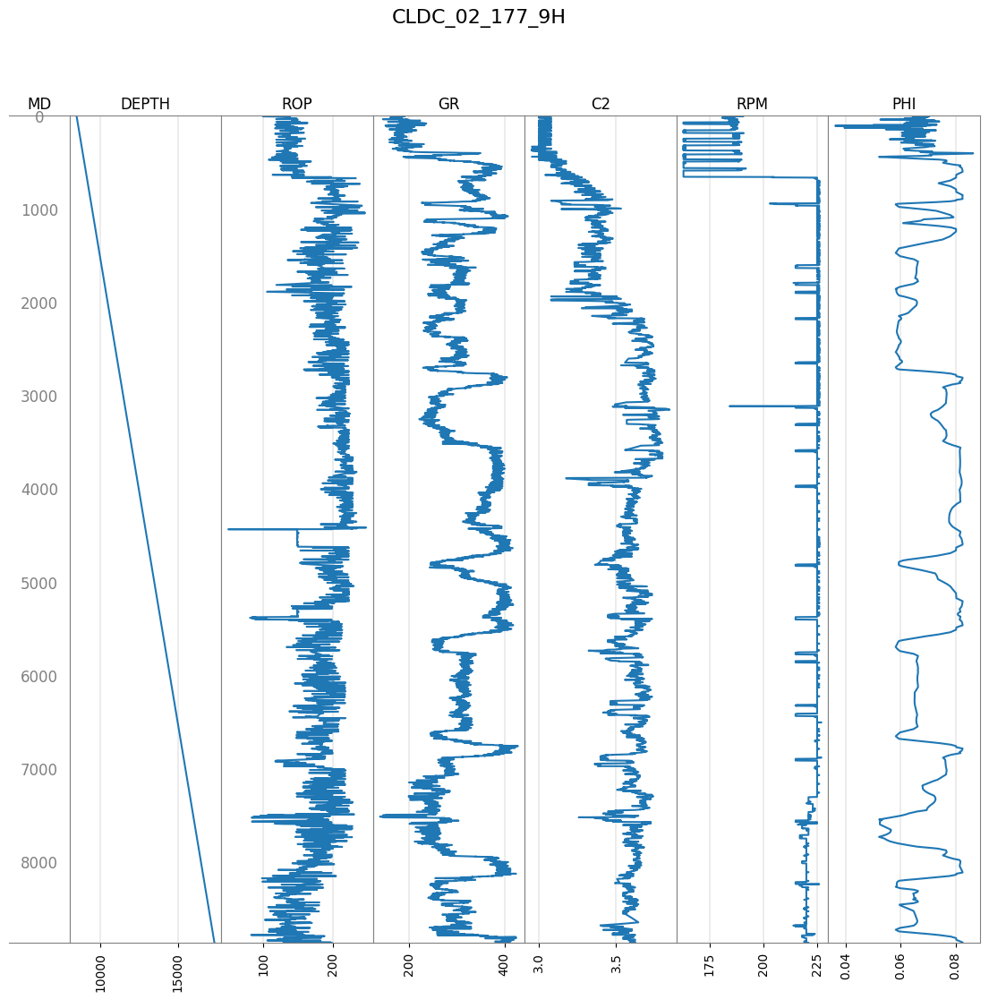

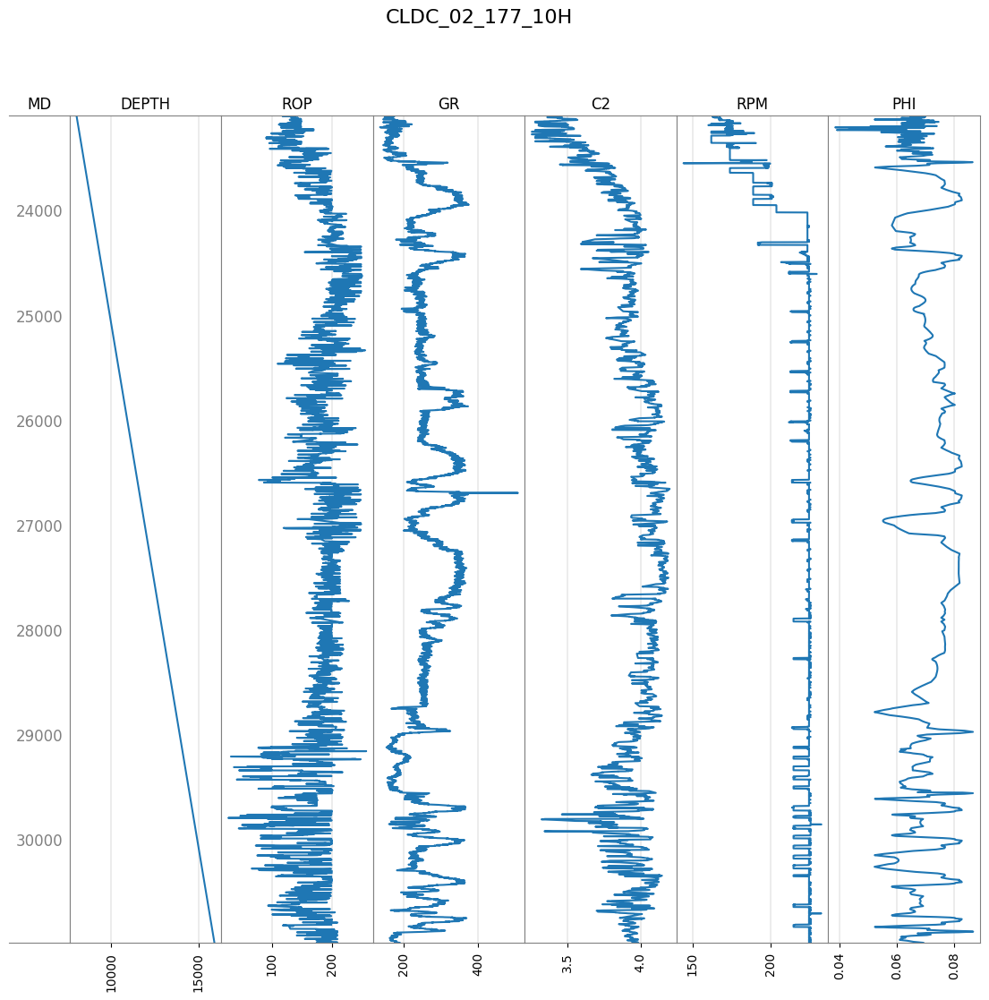

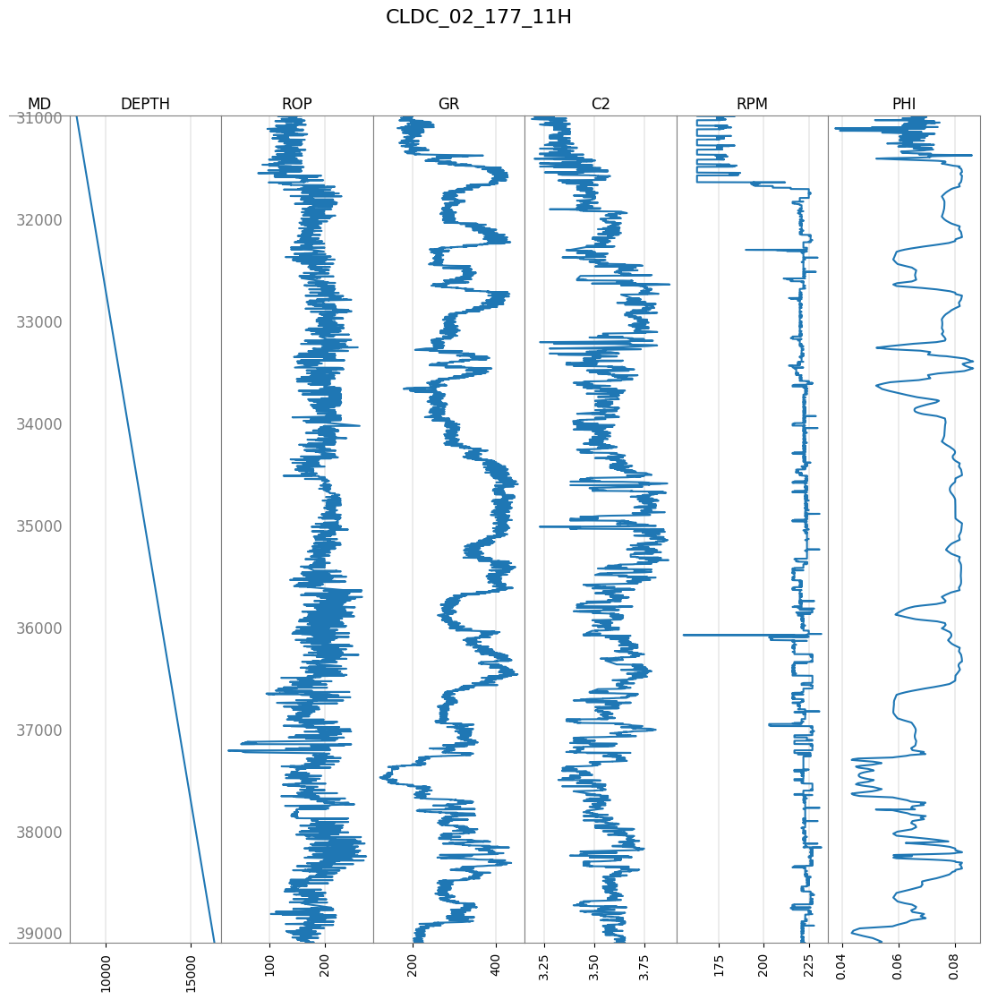

In [52]:
for well_id in new_wells_ids:

    well_df = marcellus_porosity_dataset[marcellus_porosity_dataset['well_id'] == well_id]
    well_df['MD'] = well_df['DEPTH']
        
    src.plot_welly.plot_wellys.plot_well(
        welly.Well().from_df(
            well_df[["MD", "DEPTH"] + features_used_for_training_the_new_models + ["PHI"]],
            name=well_id
        )
    )

## 3.2. Analyzing wells similarity

In this case, the purpose of this analysis is to identify and quantify the similarities or dissimilarities between different wells within the dataset. By employing various similarity metrics like Dynamic Time Warping or Kolmogorov Smirnov distance, the objective is to categorize wells based on their shared characteristics, allowing for the discovery of groups or patterns in the data for optimizing the wells subset used for training.

1. **Features plots**: A comparison of each of the well's drilling variables is made to look for anomalous or out-of-range behaviour. 

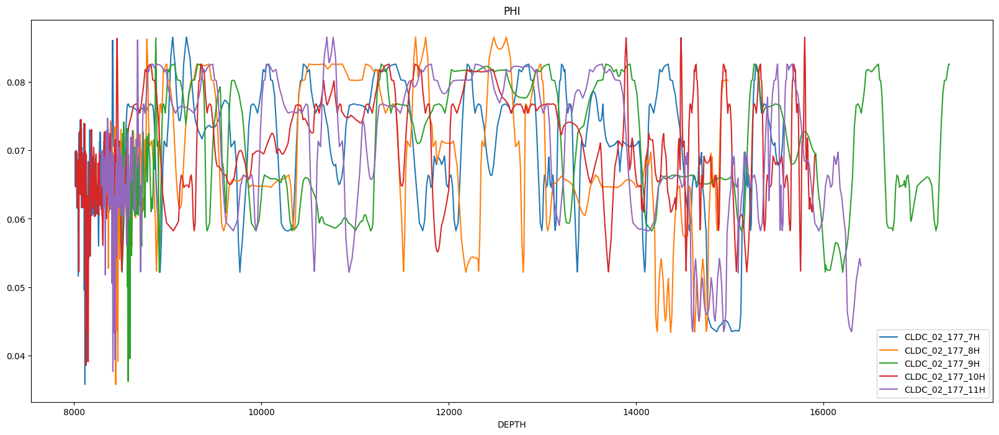

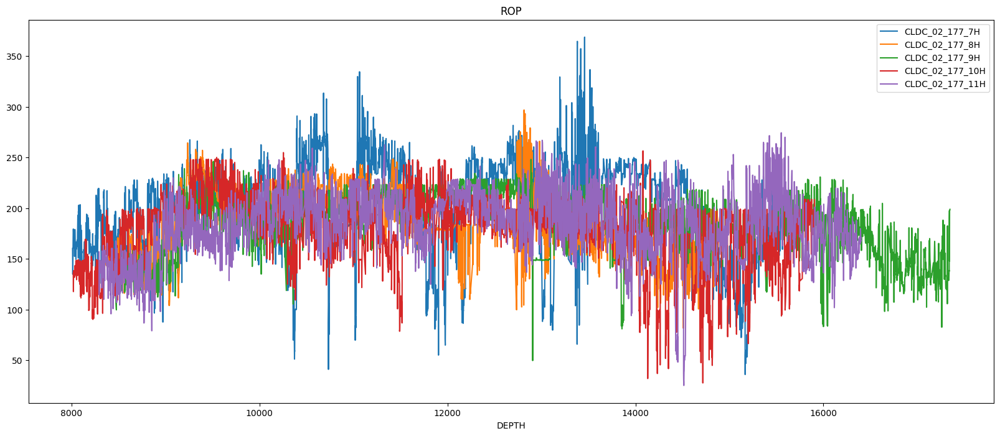

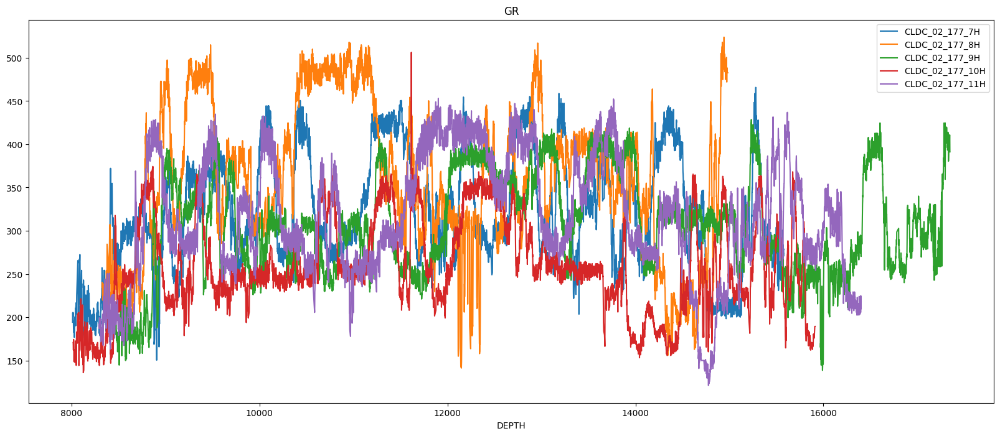

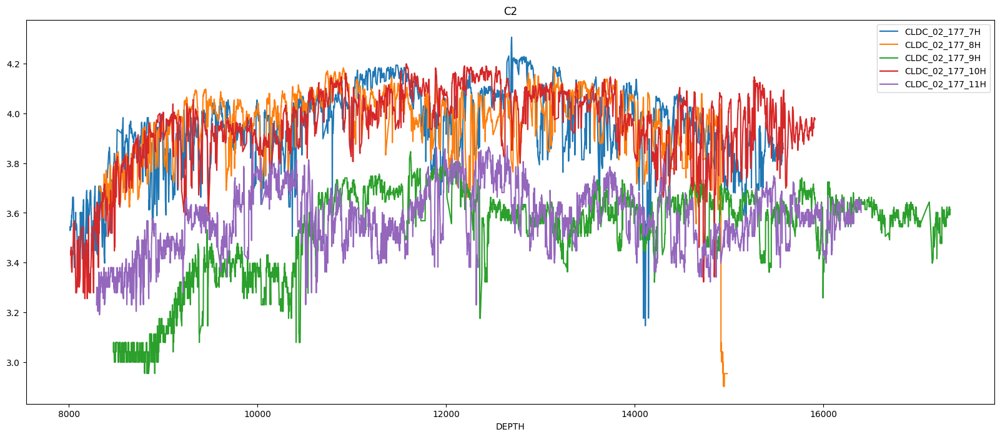

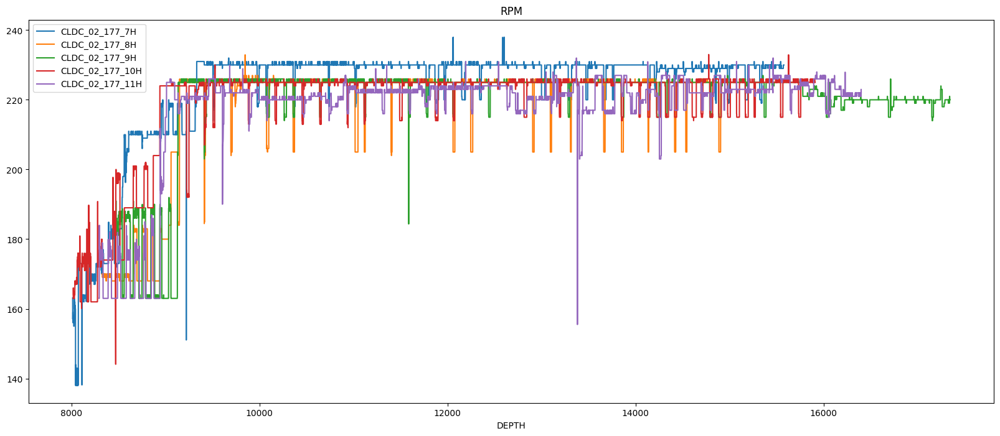

In [53]:
for feature in ["PHI"] + features_used_for_training_the_new_models:
    fig, ax = matplotlib.pyplot.subplots(1, 1, figsize=(20, 8))

    for well in new_wells_ids:
        
        well_df = marcellus_porosity_dataset[marcellus_porosity_dataset['well_id'] == well].set_index('DEPTH')
        ax.plot(
            well_df[feature],
            label=well
        )

    matplotlib.pyplot.title(feature)
    matplotlib.pyplot.xlabel("DEPTH")
    matplotlib.pyplot.legend()

2. **Similarities heatmaps**: Statistical techniques such as Dynamic Time Warping or Kolmogorov-Smirnov distance are used to create similarity heat maps between the wells variables to determine whether or not they are similar.

Heatmaps legend:
0: CLDC_02_177_10H
1: CLDC_02_177_11H
2: CLDC_02_177_7H
3: CLDC_02_177_8H
4: CLDC_02_177_9H


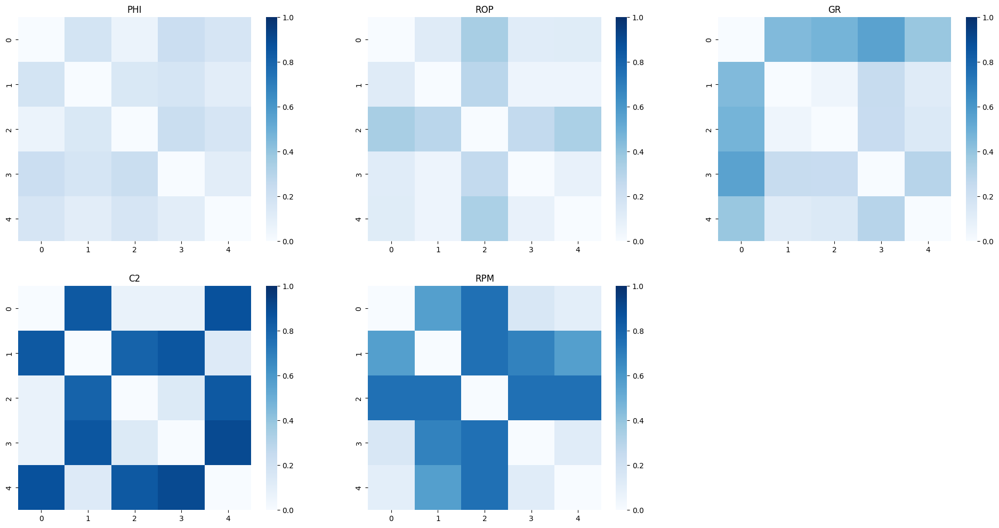

In [54]:
sim = src.data_modelling.well_similarity.obtain_well_similarity_to_subset(
    zone=zone,
    df=marcellus_porosity_dataset,
    subset_names=new_wells_ids,
    features=["PHI"] + features_used_for_training_the_new_models,
    distance='KS',
    splitted_variables=True,
    plot=True
)

The above heatmap matrices represent similarity between well variables using a color scheme to visually represent the degree of similarity or dissimilarity among variables. Technically, each cell in the heatmap matrix corresponds to the similarity score or distance metric between one variable in two wells. The color intensity in each cell is determined by the magnitude of the similarity or dissimilarity value. In this context, white color indicates high similarity, while blue color represents dissimilarity. For example, the cell in row 1 and column 2 of the PHI matrix shows the simillarity between the wells 1 and 2 in terms of the PHI variable.

### 3.2.3. Selecting the training wells set

These analysis performed are very useful to determine which wells are most similar to each other and to detect those wells with anomalous and outlying behavior.
The purpose of this is to facilitate the selection and creation of the subset of training wells, always keeping in mind that a balance must be maintained between the similarity and dissimilarity of the wells in order to ensure the greatest possible generality to new wells. 


In [55]:
wells_used_for_training_the_new_models = [
    'CLDC_02_177_7H',
    'CLDC_02_177_8H',
    'CLDC_02_177_9H',
    'CLDC_02_177_10H',
    'CLDC_02_177_11H',
]

## 3.3. Training the models

Once the wells have been analyzed in detail for outliers and the training subset has been selected, models training can proceed. 

In the Libya zone, the models developed cover the following two types: 

1. **Porosity value**: The central predictor used has been XGBoost, which uses a strong learning machine, to perform the prediction task. XGBoost is a popular model based on the gradient boosting technique, known for its high efficiency and predictive accuracy. In addition, hyperparameter optimization is applied in order to find the best combination of values resulting in optimal model performance.

In [39]:
warnings.simplefilter(action='ignore', category=FutureWarning)

new_porosity_model = src.porosity_model.train_model.train_porosity_model(
    zone=zone,
    model_features=features_used_for_training_the_new_models,
    training_wells_ids=wells_used_for_training_the_new_models,
    model_output_file_name=new_model_name
)

[INFO] Reading and processing .csv...
[INFO] Training model...
XGBRegressor(base_score=None, booster=None, callbacks=None,
             colsample_bylevel=None, colsample_bynode=None,
             colsample_bytree=0.100263370238668, early_stopping_rounds=None,
             enable_categorical=False, eval_metric=None, feature_types=None,
             gamma=None, gpu_id=None, grow_policy=None, importance_type=None,
             interaction_constraints=None, learning_rate=None, max_bin=None,
             max_cat_threshold=None, max_cat_to_onehot=None,
             max_delta_step=None, max_depth=10, max_leaves=None,
             min_child_weight=None, missing=nan, monotone_constraints=None,
             n_estimators=40, n_jobs=None, num_parallel_tree=None,
             predictor=None, random_state=0, ...)
{'n_estimators': 40, 'max_depth': 10, 'subsample': 0.7085786043663667, 'colsample_bytree': 0.100263370238668}
0.009011817193533733
[INFO] Saving model...
[INFO] Model performance:
[INFO] PH

Once the model is trained, it is saved as a _.pkl_ file in the folder: 

        CWS_DECOM_V2/models/Marcellus/PHI/<porosity_model_name>.pkl

<!-- It can be loaded as a python object using the function _load_model_artefact_ located in ***_src.data_modelling.save_and_load_artefacts_*** package, as follows: -->

2. **Porosity quantiles**: An algorithm has been designed to provide the degree of variability of the predictions by providing a confidence interval of the porosity value. For this purpose, a regression has to be performed for predicting the 5, 50 and 95 quantiles of the porosity. This modeling is performed using the QXGBoost method, _quantile extreme gradient boosting_, which combines regression with XGBoost.


In [ ]:
new_porosity_quantiles_models = src.porosity_quantiles_model.train_model.train_porosity_quantiles_models(
    zone=zone,
    model_features=["C2", "GR", "ROP", "TORQUE"],
    training_wells_ids=wells_used_for_training_the_new_models,
    model_output_file_name=new_model_name
)

After the training process is completed, the quantile models are saved in _.pkl_ format in the following paths:

    CWS_DECOM_V2/models/Marcellus/PHI/<porosity_model_name>_0.05.pkl
    CWS_DECOM_V2/models/Marcellus/PHI/<porosity_model_name>_0.5.pkl
    CWS_DECOM_V2/models/Marcellus/PHI/<porosity_model_name>_0.95.pkl


3. **Case 2 curtains model**:

In [41]:
new_case_2_curtains_model = src.curtains_model.train_model.train_curtains_model(
    zone=zone, 
    curtains_case=2,
    model_features=features_used_for_training_the_new_models,
    training_wells_ids=wells_used_for_training_the_new_models,
    model_output_file_name=new_model_name,
)

[INFO] Reading and processing Marcellus_curtains_data_clean_merged.csv
[INFO] Training model...


   CHECK ON SPLITTING
Fold 0:
  Train (#elements=20412):
                 ('CLDC_02_177_10H', 5322)
                 ('CLDC_02_177_7H', 5105)
                 ('CLDC_02_177_8H', 4693)
                 ('CLDC_02_177_9H', 5292)

  Train (#elements=20412):

  Test (#elements=5488):
                 ('CLDC_02_177_11H', 5488)
Unique classes test: [0 1 2]
Class 0 has originally 235 elements.
Class 1 has originally 332 elements.
Class 2 has originally 4921 elements.
Fold 1:
  Train (#elements=20578):
                 ('CLDC_02_177_11H', 5488)
                 ('CLDC_02_177_7H', 5105)
                 ('CLDC_02_177_8H', 4693)
                 ('CLDC_02_177_9H', 5292)

  Train (#elements=20578):

  Test (#elements=5322):
                 ('CLDC_02_177_10H', 5322)
Unique classes test: [0 1 2]
Class 0 has originally 247 elements.
Class 1 has originally 780 elements.
Class 2 has originally 4295 elemen

[Parallel(n_jobs=-1)]: Using backend LokyBackend with 8 concurrent workers.
[Parallel(n_jobs=-1)]: Done   2 out of   5 | elapsed:   14.6s remaining:   21.9s
[Parallel(n_jobs=-1)]: Done   3 out of   5 | elapsed:   14.7s remaining:    9.8s
[Parallel(n_jobs=-1)]: Done   5 out of   5 | elapsed:   14.9s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 8 concurrent workers.
[Parallel(n_jobs=-1)]: Done   2 out of   5 | elapsed:    4.4s remaining:    6.6s
[Parallel(n_jobs=-1)]: Done   3 out of   5 | elapsed:    6.4s remaining:    4.3s
[Parallel(n_jobs=-1)]: Done   5 out of   5 | elapsed:    6.5s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 8 concurrent workers.
[Parallel(n_jobs=-1)]: Done   2 out of   5 | elapsed:    4.6s remaining:    7.0s
[Parallel(n_jobs=-1)]: Done   3 out of   5 | elapsed:    4.7s remaining:    3.1s
[Parallel(n_jobs=-1)]: Done   5 out of   5 | elapsed:    4.8s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 8 concurrent worker

XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=0.5, early_stopping_rounds=None,
              enable_categorical=False, eval_metric=None, feature_types=None,
              gamma=0.16600095782565608, gpu_id=None, grow_policy=None,
              importance_type=None, interaction_constraints=None,
              learning_rate=0.28816508620357917, max_bin=None,
              max_cat_threshold=None, max_cat_to_onehot=None,
              max_delta_step=None, max_depth=7, max_leaves=None,
              min_child_weight=None, missing=nan, monotone_constraints=None,
              n_estimators=73, n_jobs=None, num_parallel_tree=None,
              objective='multi:softprob', predictor=None, ...)
{'colsample_bytree': 0.5, 'gamma': 0.16600095782565608, 'learning_rate': 0.28816508620357917, 'max_depth': 7.100913188161971, 'n_estimators': 73.06652021525419, 'reg_alpha': 0.10871475578816517, 'reg_

Once the training process of the curtains model is finished, this model is saved in the following path: 

    CWS_DECOM_V2/models/Marcellus/CURTAINS_2/<new_model_name>.pkl

4. **Case 3 curtains model**:

In [42]:
new_case_3_curtains_model = src.curtains_model.train_model.train_curtains_model(
    zone=zone, 
    curtains_case=3,
    model_features=features_used_for_training_the_new_models,
    training_wells_ids=wells_used_for_training_the_new_models,
    model_output_file_name=new_model_name,
)

[INFO] Reading and processing Marcellus_curtains_data_clean_merged.csv
[INFO] Training model...


   CHECK ON SPLITTING
Fold 0:
  Train (#elements=20608):
                 ('CLDC_02_177_10H', 5322)
                 ('CLDC_02_177_11H', 5488)
                 ('CLDC_02_177_7H', 5105)
                 ('CLDC_02_177_8H', 4693)

  Train (#elements=20608):
             Class 0 has originally 4689 elements.
             Class 1 has originally 21211 elements.
   Class to balance original  count  percentage
0                          0   4689        18.1
1                          1  21211        81.9
(20608, 5) (20608,)
             Class 0 has after resampling 16217 elements.
             Class 1 has after resampling 16217 elements.
   Class to balance original  count  percentage
0                        0.0  16217        50.0
1                        1.0  16217        50.0

  Test (#elements=5292):
                 ('CLDC_02_177_9H', 5292)
Unique classes test: [0 1]
Class 0 has originally 29

[Parallel(n_jobs=-1)]: Using backend LokyBackend with 8 concurrent workers.
[Parallel(n_jobs=-1)]: Done   2 out of   5 | elapsed:    3.8s remaining:    5.8s
[Parallel(n_jobs=-1)]: Done   3 out of   5 | elapsed:    3.8s remaining:    2.5s
[Parallel(n_jobs=-1)]: Done   5 out of   5 | elapsed:    4.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 8 concurrent workers.
[Parallel(n_jobs=-1)]: Done   2 out of   5 | elapsed:    3.3s remaining:    5.0s
[Parallel(n_jobs=-1)]: Done   3 out of   5 | elapsed:    3.4s remaining:    2.3s
[Parallel(n_jobs=-1)]: Done   5 out of   5 | elapsed:    3.5s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 8 concurrent workers.
[Parallel(n_jobs=-1)]: Done   2 out of   5 | elapsed:    3.7s remaining:    5.7s
[Parallel(n_jobs=-1)]: Done   3 out of   5 | elapsed:    3.9s remaining:    2.6s
[Parallel(n_jobs=-1)]: Done   5 out of   5 | elapsed:    4.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 8 concurrent worker

XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=0.6775698461620794, early_stopping_rounds=None,
              enable_categorical=False, eval_metric=None, feature_types=None,
              gamma=0.36067981251283565, gpu_id=None, grow_policy=None,
              importance_type=None, interaction_constraints=None,
              learning_rate=0.25935688000025253, max_bin=None,
              max_cat_threshold=None, max_cat_to_onehot=None,
              max_delta_step=None, max_depth=7, max_leaves=None,
              min_child_weight=None, missing=nan, monotone_constraints=None,
              n_estimators=71, n_jobs=None, num_parallel_tree=None,
              predictor=None, random_state=0, ...)
{'n_estimators': 71, 'max_depth': 7, 'subsample': 0.7757080267743688, 'gamma': 0.36067981251283565, 'reg_alpha': 0.8496056803934185, 'reg_lambda': 0.7601306583526453, 'learning_rate': 0.25935688000

In the same way as for case 2, the case 3 curtains model is saved in the below folder: 

    CWS_DECOM_V2/models/Marcellus/CURTAINS_3/<new_model_name>.pkl

## 3.4. Evaluating the models

After training the models, they must be analyzed to evaluate whether their performances and results are as expected. 

To do this, it is useful to observe different metrics of interest of each of the models on the different wells that have been considered as wells of interest. 

It is also useful to plot the predicted porosity values and quantiles against the actual porosity values, in order to obtain a detailed insight of the obtained predictions. These visualizations allow, not only to evaluate the quality of the model predictions, but also to identify patterns and trends crucial for interpreting the results. 

### 3.4.1. Models' scores

For evaluating porosity model results, it is useful to consider the following two metrics: 

1. **MAE (Mean Absolute Error)**:

    The Mean Absolute Error (MAE) measures the average absolute difference between the observed porosity values and the predicted ones. 
    
    It reflects the average magnitude of errors without considering their sign. 
    
    A lower MAE indicates better accuracy.

2. **RMSE (Root Mean Squared Error)**:

    The Root Mean Squared Error (RMSE) calculates the square root of the average of the squared differences between the observed and predicted porosity values. 
    
    It offers a measure of the overall magnitude of errors, assigning more weight to larger errors. 
    
    Importantly, RMSE is in the same unit as the target variable. 
    
    As well as the MAE metric, a lower RMSE is indicative of better accuracy.

In [56]:
porosity_scores = {}

for well in wells_used_for_training_the_new_models:

    well_df = marcellus_porosity_dataset[marcellus_porosity_dataset['well_id'] == well].set_index('DEPTH')

    well_predicted_porosity = src.porosity_model.predict_model.predict(
        zone=zone,
        input_data=well_df,
        model_name=new_model_name
    )

    well_mae = sklearn.metrics.mean_absolute_error(
        well_df["PHI"].values,
        well_predicted_porosity
    )

    well_rmse = sklearn.metrics.mean_squared_error(
        well_df["PHI"].values,
        well_predicted_porosity,
        squared=False
    )

    porosity_scores[well] = {
        'MAE': well_mae,
        'RMSE': well_rmse
    }

display(pandas.DataFrame(porosity_scores).round(4).T)

,MAE,RMSE
CLDC_02_177_7H,0.0040,0.0052
CLDC_02_177_8H,0.0055,0.0071
CLDC_02_177_9H,0.0044,0.0055
CLDC_02_177_10H,0.0042,0.0053
CLDC_02_177_11H,0.0045,0.0057


In the other hand, for the evaluation of porosity quantiles models, the following metrics are of interest:

1. **PICP (Prediction Interval Coverage Probability)**:

    Measures the percentage of observed porosity values (PHI) that fall within the predicted 5-95% quantile range (PHI_PRED_05 to PHI_PRED_95).
    
    High PICP indicates the model's ability to provide accurate and reliable prediction intervals.
    
2. **PICP Prediction (Prediction Interval Coverage Probability for Predictions)**:

    Similar to PICP but applied to the predicted porosity values (PHI_PRED) rather than observed values.
    
    Assesses how well the prediction intervals cover the predicted values.

3. **PINAW (Prediction Interval Normalized Average Width)**:

    Measures the average width of the prediction intervals normalized by the range of the target variable.

    A lower PINAW suggests narrower and more precise prediction intervals.

4. **PWC (Prediction Interval Width Criterion)**:

    Combines the PICP and PINAW into a single metric to evaluate the overall performance of prediction intervals.

    Balances the trade-off between coverage probability and interval width. In this case, the interval width is 90.

    Higher PWC indicates a better trade-off between coverage and precision.


These metrics are essential for assessing the reliability and quality of prediction intervals produced by quantile regression models. A well-performing model should achieve a high coverage probability (PICP) while maintaining narrow and precise prediction intervals (low PINAW and high PWC).

In [57]:
porosity_quantiles_scores = {}

for well in wells_used_for_training_the_new_models:

    well_df = marcellus_porosity_dataset[marcellus_porosity_dataset['well_id'] == well].set_index('DEPTH')

    well_predicted_porosity = src.porosity_model.predict_model.predict(
        zone=zone,
        input_data=well_df,
        model_name=new_model_name
    )

    well_predicted_porosity_005 = src.porosity_quantiles_model.predict_model.predict(
        zone=zone,
        input_data=well_df,
        model_name=f"{new_model_name}_0.05"
    )

    well_predicted_porosity_050 = src.porosity_quantiles_model.predict_model.predict(
        zone=zone,
        input_data=well_df,
        model_name=f"{new_model_name}_0.5"
    )

    well_predicted_porosity_095 = src.porosity_quantiles_model.predict_model.predict(
        zone=zone,
        input_data=well_df,
        model_name=f"{new_model_name}_0.95"
    )

    picp = src.data_modelling.quantile_regression.prediction_interval_coverage_probability(
        well_df["PHI"],
        well_predicted_porosity_005, 
        well_predicted_porosity_095
    )

    picp_pred = src.data_modelling.quantile_regression.prediction_interval_coverage_probability(
        well_predicted_porosity,
        well_predicted_porosity_005, 
        well_predicted_porosity_095
    )

    pinaw = src.data_modelling.quantile_regression.prediction_interval_normalized_average_width(
        well_predicted_porosity, 
        well_predicted_porosity_005, 
        well_predicted_porosity_095, 
    )

    cwc = src.data_modelling.quantile_regression.coverage_width_based_criterion(
        90, 
        picp, 
        pinaw
    )

    porosity_quantiles_scores[well] = {
        "PICP": picp,
        "PICP Prediction": picp_pred,
        "PINAW": pinaw,
        "PWC": cwc,
    }
    
display(pandas.DataFrame(porosity_quantiles_scores).round(4).T)

,PICP,PICP Prediction,PINAW,PWC
CLDC_02_177_7H,0.9734,0.9800,2.0569,499.8239
CLDC_02_177_8H,0.9751,0.9980,2.3446,569.7300
CLDC_02_177_9H,0.9435,0.9926,2.1941,533.3482
CLDC_02_177_10H,0.9861,0.9981,2.2876,555.7969
CLDC_02_177_11H,0.9385,0.9894,1.9846,482.4382


It is important to remember that it is essential that the well is similar to the training wells in order to obtain optimal values for the model metrics. If the well is not similar, there is no guarantee that these values will be accurate.

It should also be emphasised that the data used for this example has been generated synthetically and does not follow the logic of a real well, so it is to be expected that the models will not give the best possible results.

In third and last place, metrics for evaluating the curtains models are calculated. The main metric calculated for this purpose is the accuracy score:

1. **Accuracy score**: This metric measures the number of correct predictions made by the model in relation to the total number of predictions made. In other words, it reflects the percentage of correct predicted samples divided by 100.

In [58]:
curtains_case_2_marcellus_dataset = src.processing.training_processing.append_curtains_ids_to_dataframe(
    curtains_case=2,
    df=marcellus_curtains_dataset
)

curtains_case_3_marcellus_dataset = src.processing.training_processing.append_curtains_ids_to_dataframe(
    curtains_case=3,
    df=marcellus_curtains_dataset
)

In [59]:
warnings.filterwarnings("ignore", category=FutureWarning)

curtains_scores = {}

for well_id in wells_used_for_training_the_new_models:

    curtains_case_2_well_df = curtains_case_2_marcellus_dataset.query(f"well_id==\"{well_id}\"")

    curtains_case_3_well_df = curtains_case_3_marcellus_dataset.query(f"well_id==\"{well_id}\"")
    
    curtains_case_2_well_predictions = src.curtains_model.predict_model.predict(
        zone=zone, 
        curtains_case=2,
        input_data=curtains_case_2_well_df,
        model_name=new_model_name
    )

    curtains_case_3_well_predictions = src.curtains_model.predict_model.predict(
        zone=zone, 
        curtains_case=3,
        input_data=curtains_case_3_well_df,
        model_name=new_model_name
    )

    curtains_case_2_accuracy = sklearn.metrics.accuracy_score(
        y_true=curtains_case_2_well_df['RW_CURTAIN_IDS'],
        y_pred=curtains_case_2_well_predictions['CURTAINS'],
    )

    curtains_case_3_accuracy = sklearn.metrics.accuracy_score(
        y_true=curtains_case_3_well_df['RW_CURTAIN_IDS'],
        y_pred=curtains_case_3_well_predictions['CURTAINS'],
    )

    curtains_scores[well_id] = {
        'Curtains Case 2 Accuracy Score': curtains_case_2_accuracy,
        'Curtains Case 3 Accuracy Score': curtains_case_3_accuracy,
    }
    
display(pandas.DataFrame(curtains_scores).round(4).T)

,Curtains Case 2 Accuracy Score,Curtains Case 3 Accuracy Score
CLDC_02_177_7H,0.8988,0.8619
CLDC_02_177_8H,0.9091,0.8804
CLDC_02_177_9H,0.9646,0.9654
CLDC_02_177_10H,0.9179,0.8824
CLDC_02_177_11H,0.9559,0.9567


It is important to remember that it is essential that the well is similar to the training wells in order to obtain optimal values for the model metrics. If the well is not similar, there is no guarantee that these values will be accurate.

### 3.4.2. Models' predictions plots

The next step delves into the visual representation of the obtained results. Through a series of plots and graphs, the goal is to provide a comprehensive view of the model performance. In first place, the following graphics are showed.

1. **Real vs. Predicted Values Plot**:
    the first plot offers a visual comparison between the actual porosity values and those predicted by the model. Real values are represented in blue, while predicted values are depicted in orange. 

2. **Absolute Error Plot**: 
    the second plot focuses on the absolute error between real and predicted values. The magnitude of absolute errors is represented, providing a deeper understanding of the model's accuracy across different porosity ranges.


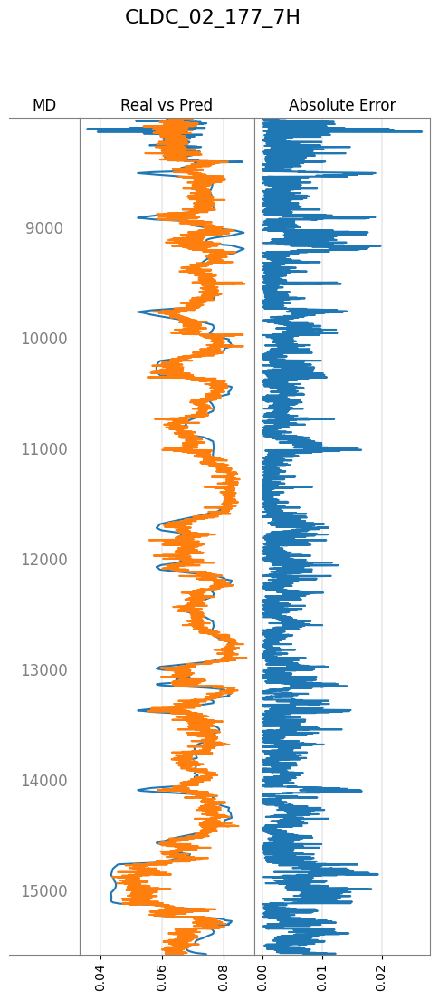

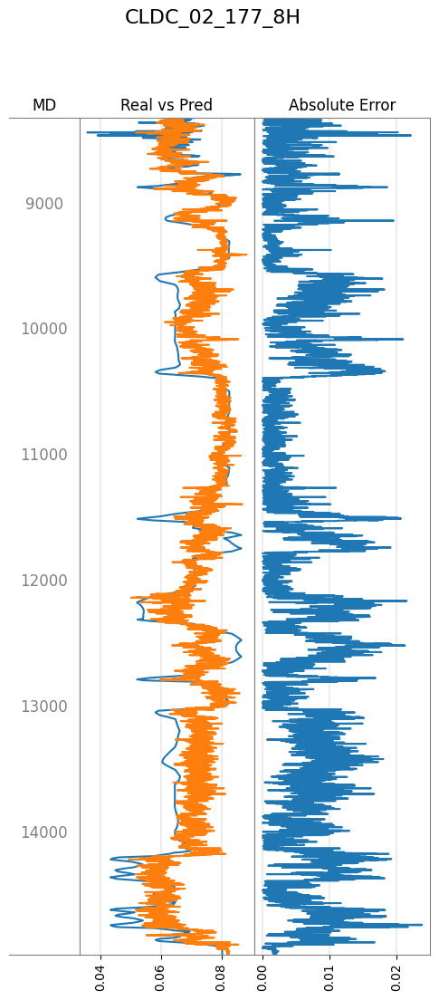

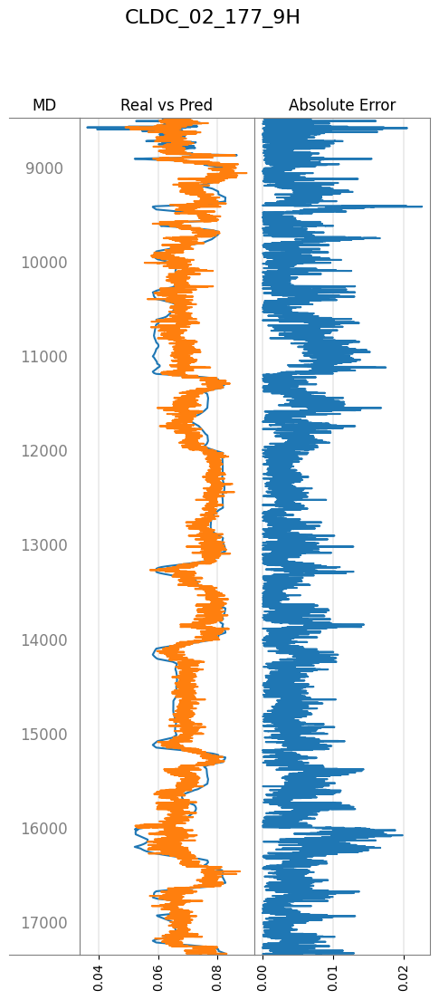

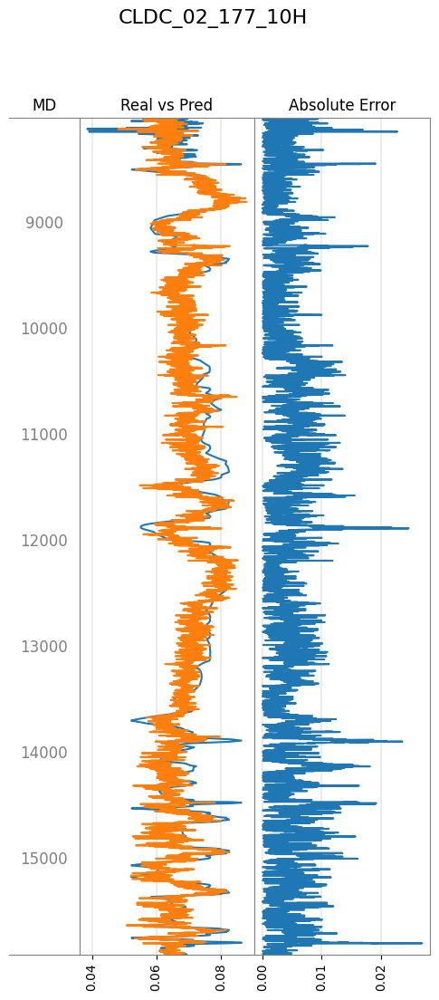

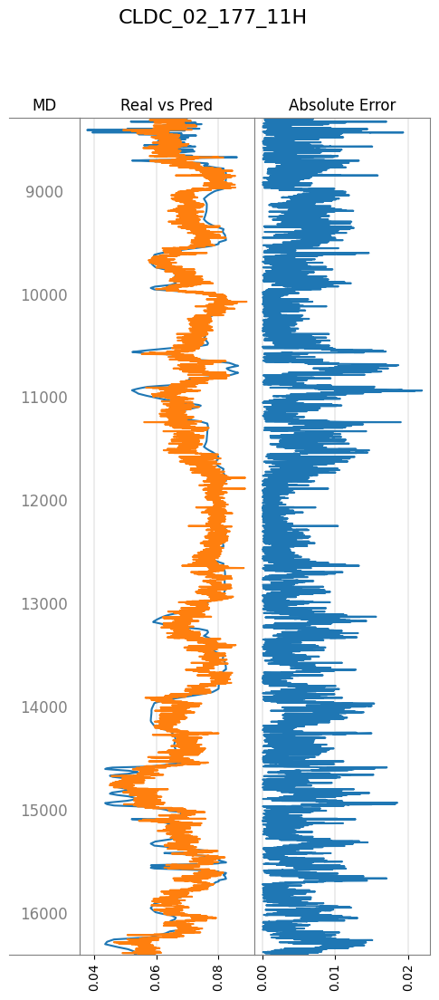

In [60]:
for well in wells_used_for_training_the_new_models:

    well_df = marcellus_porosity_dataset[marcellus_porosity_dataset['well_id'] == well]

    well_porosity_predictions = src.porosity_model.predict_model.predict(
        zone=zone, 
        input_data=well_df,
        model_name=new_model_name
    )

    src.data_modelling.error_along_depth_analysis.validate_well_performance_based_on_estimations(
        well_info=well,
        X=well_df,
        y_real=well_df["PHI"].values,
        y_pred=well_porosity_predictions,
        depth=well_df["DEPTH"].values,
        model_info=new_model_name,
        metric='mae',
        save_plot=False
    )


Secondly, we delve into a set of plots that provide a view of porosity quantiles model's performance. For that purpose, the following plots are displayed.

1. **Real vs. Predicted Porosity Plot**:
    the initial plot combines the previously explained Real vs. Predicted Porosity values, showcasing a side-by-side comparison of actual and predicted porosity values. The real values are depicted in blue, while the predicted values are represented in orange.

2. **Absolute Error Plot**: 
    as before, the second plot focuses on the absolute error between real and predicted values.

3. **Model features**:
    the next plots offers the visualization of the features used for porosity and porosity quantiles models. 

3. **Quantile Interval and Prediction Plot**:
    the final plot integrates various elements, featuring a shaded blue region representing the interval between the 5th and 95th quantiles, a red line indicating the 50th quantile, a black line for the actual porosity values, and an orange line for the predicted porosity values. This comprehensive visualization allows for a thorough examination of the model's performance across quantiles, highlighting areas of greater variability.

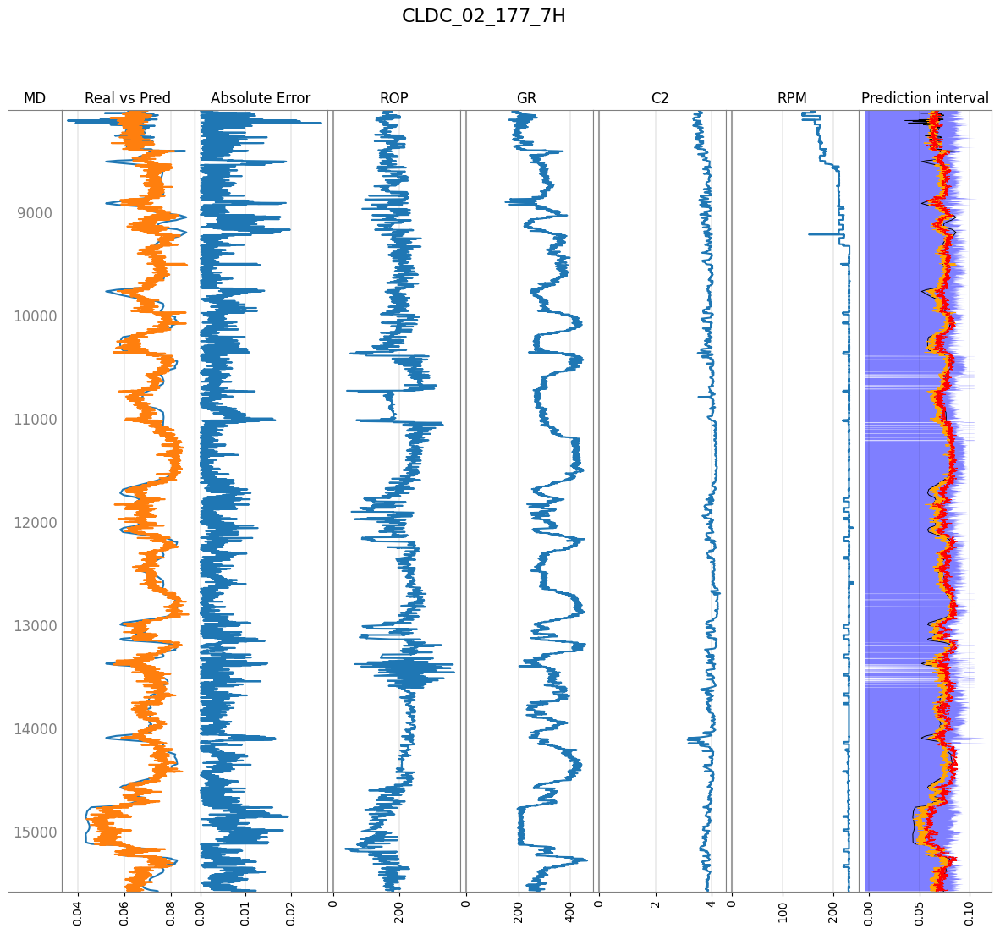

Prediction interval coverage probabilities... 
Test data: 0.97
Test prediction: 0.98
Prediction Interval Normalized Averaged Width (PINAW): 1.8
Coverage width based criterion (PWC): 1.8 



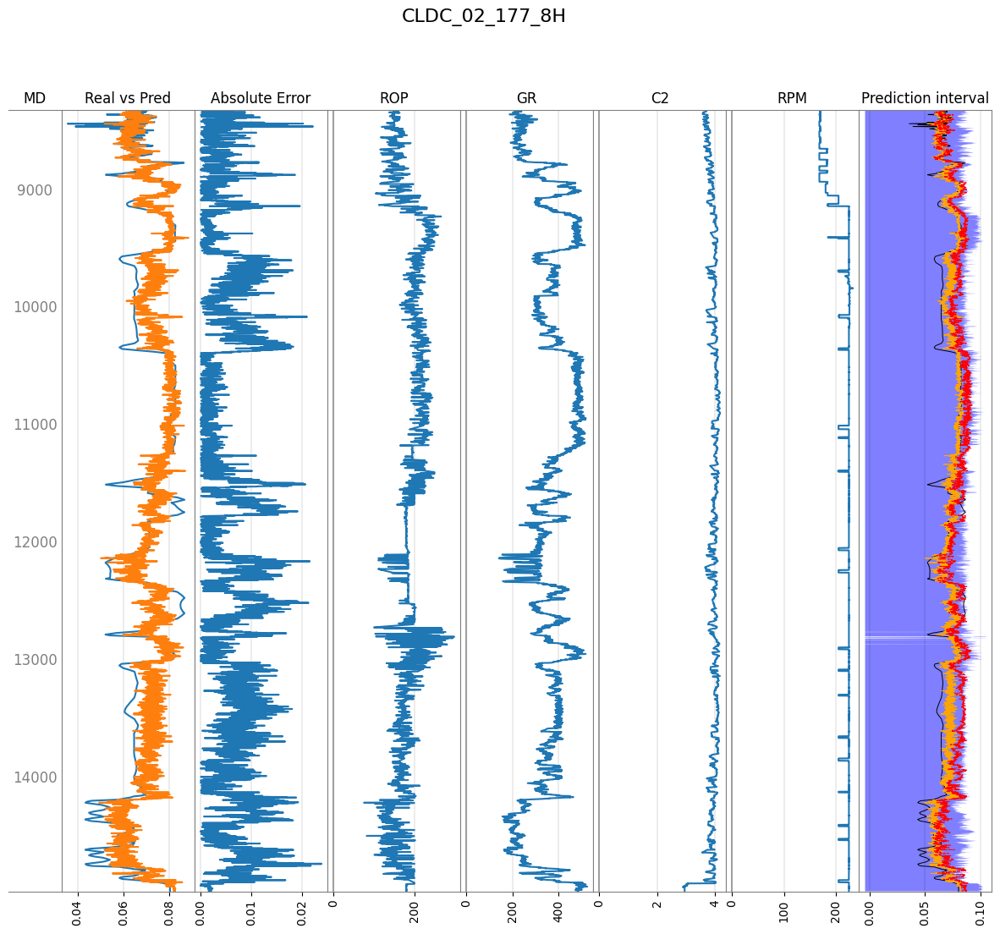

Prediction interval coverage probabilities... 
Test data: 0.98
Test prediction: 1.0
Prediction Interval Normalized Averaged Width (PINAW): 1.8
Coverage width based criterion (PWC): 1.8 



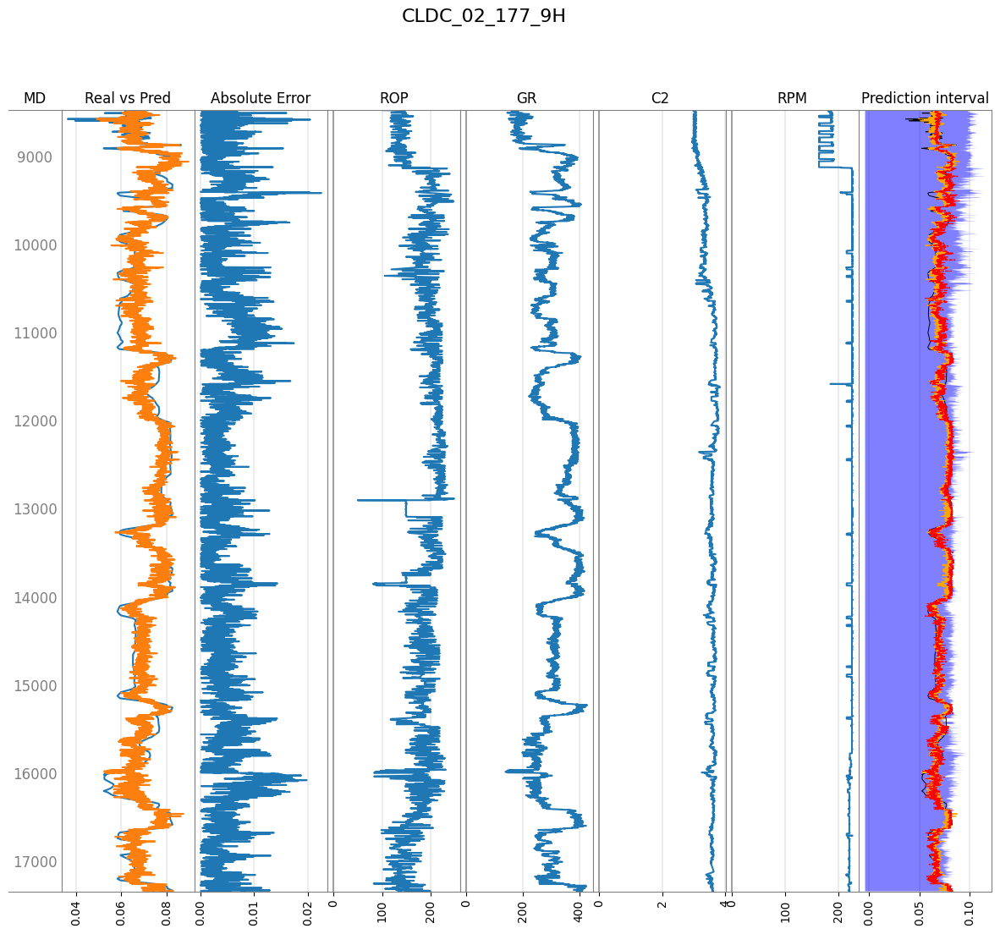

Prediction interval coverage probabilities... 
Test data: 0.94
Test prediction: 0.99
Prediction Interval Normalized Averaged Width (PINAW): 1.8
Coverage width based criterion (PWC): 1.8 



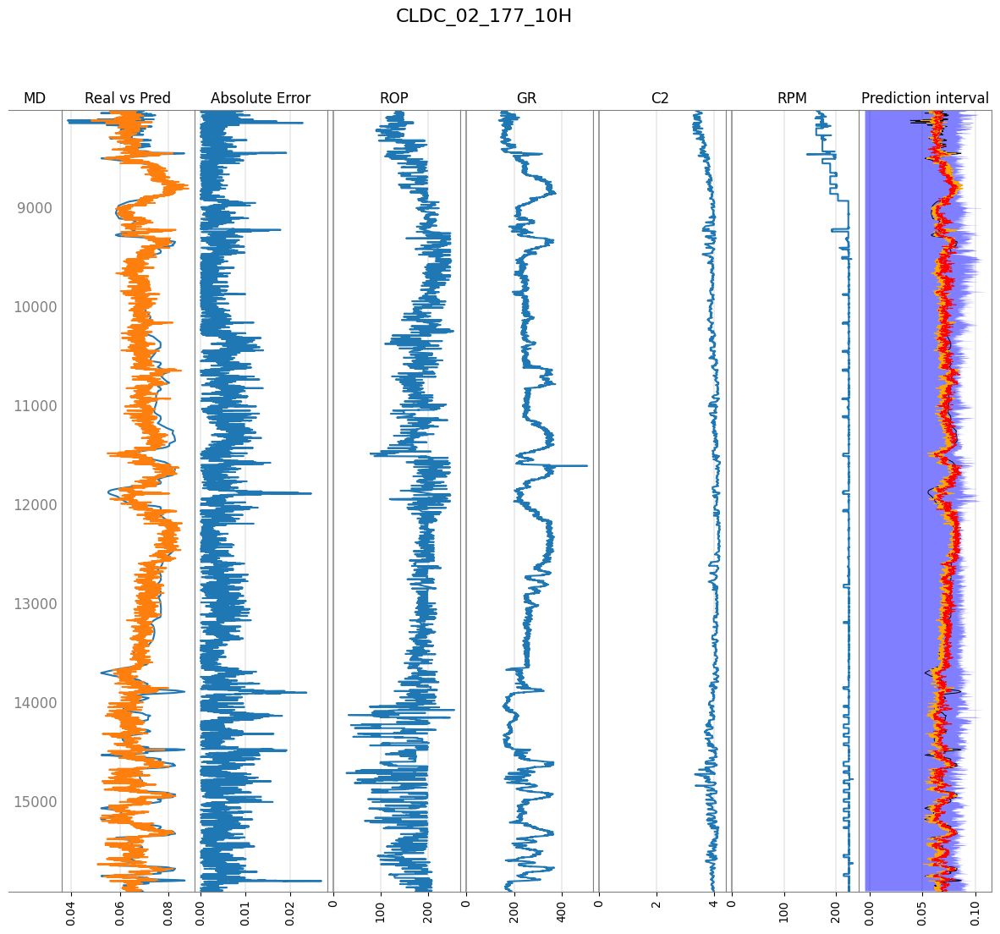

Prediction interval coverage probabilities... 
Test data: 0.99
Test prediction: 1.0
Prediction Interval Normalized Averaged Width (PINAW): 1.9
Coverage width based criterion (PWC): 1.9 



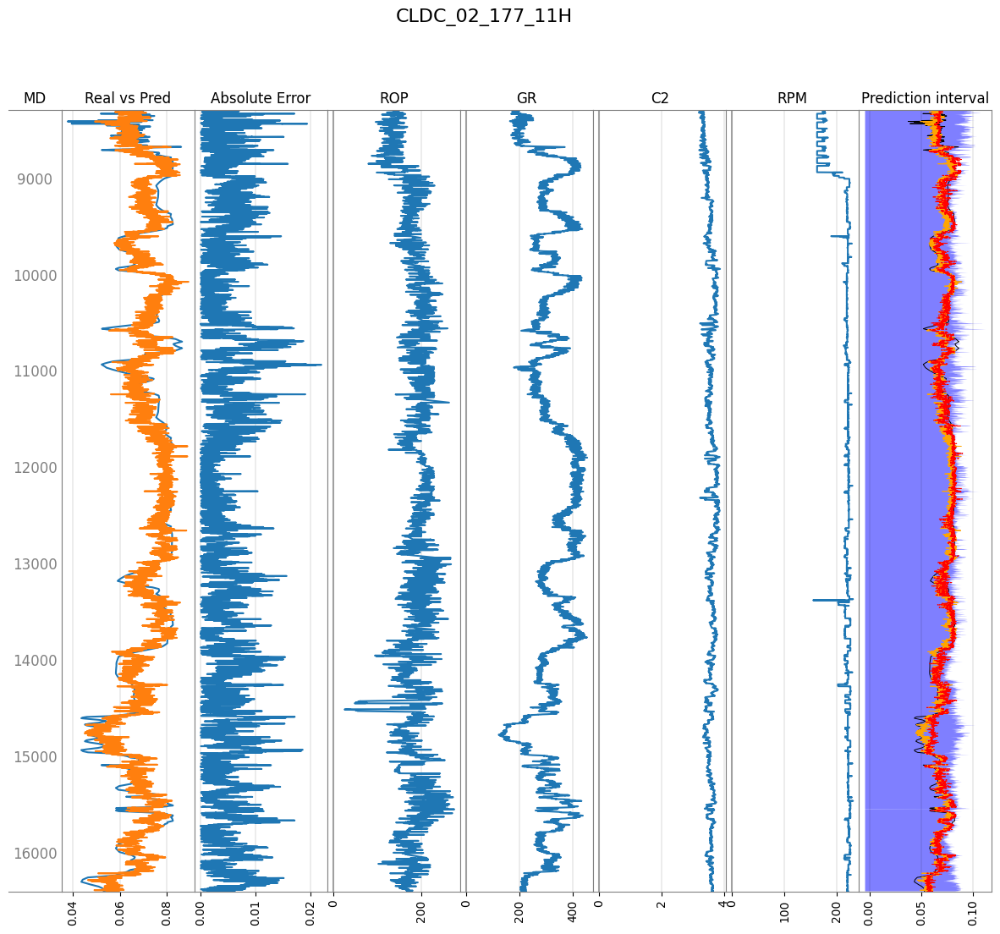

Prediction interval coverage probabilities... 
Test data: 0.94
Test prediction: 0.99
Prediction Interval Normalized Averaged Width (PINAW): 1.8
Coverage width based criterion (PWC): 1.8 



In [61]:
for well in wells_used_for_training_the_new_models:

    well_df = marcellus_porosity_dataset[marcellus_porosity_dataset['well_id'] == well]

    well_porosity_predictions = src.porosity_model.predict_model.predict(
        zone=zone, 
        input_data=well_df,
        model_name=new_model_name
    )

    well_porosity_005_predictions = src.porosity_quantiles_model.predict_model.predict(
        zone=zone,
        input_data=well_df,
        model_name=f'{new_model_name}_0.05'
    )

    well_porosity_050_predictions = src.porosity_quantiles_model.predict_model.predict(
        zone=zone,
        input_data=well_df,
        model_name=f'{new_model_name}_0.5'
    )

    well_porosity_095_predictions = src.porosity_quantiles_model.predict_model.predict(
        zone=zone,
        input_data=well_df,
        model_name=f'{new_model_name}_0.95'
    )

    src.data_modelling.quantiles_along_depth_analysis.validate_well_performance_and_quantiles_based_on_estimations(
        well_info=well, 
        X=well_df[features_used_for_training_the_new_models].values, 
        y_real=well_df["PHI"].values,
        y_pred=well_porosity_predictions,
        y_lower=well_porosity_005_predictions,
        y_upper=well_porosity_095_predictions,
        y_median=well_porosity_050_predictions,
        list_of_quantiles=[0.05, 0.5, 0.95],
        depth=well_df["DEPTH"].values,
        feature_names=features_used_for_training_the_new_models,
        metric="mae", 
        model_info=new_model_name,
        save_plot=False
    )

Thirdly and lastly, in the case of the graphs that can be obtained to analyse the curtain predictions, there are more columns to look at. These columns are the following:

1. **Features used to train the curtain model**: The first columns represent the variables used to predict the curtains, together with the depth of the well.
2. **REAL**: Using a coloured legend associated with the corresponding prediction case, the real rock types obtained in the well are plotted.
3. **PREDICTED**: Using the same coloured legend, the predictions obtained for the rock type are plotted. 
4. **PERFORMANCE**: This column compares the actual values of the curtains with the predictions, so that the depths where the predictions do not match the actual values are shown in black, and those where they do match are shown in white.
5. **Class probabilities**: These columns represent the probability that the actual rock type belongs to the respective class (0, 1 or 2). The further to the right the value is, the closer it is to a probability of 1.
6. **Maximum probability**: Finally, this column contains the maximum value of the probabilities of the classes to give a measure of the uncertainty in the prediction.

In first instance, these graphics can be obtained for case 2 curtains predictions executing the following cell: 

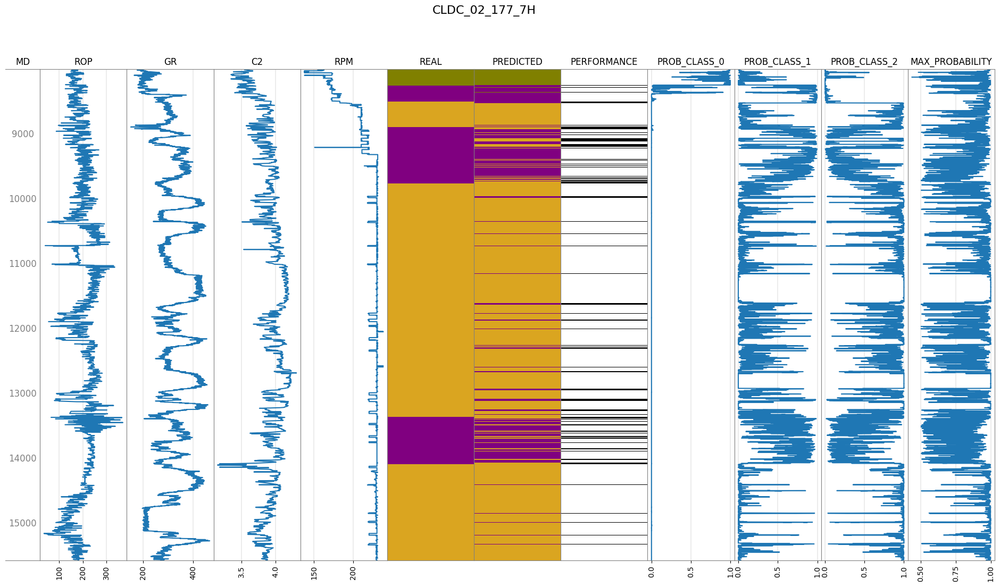

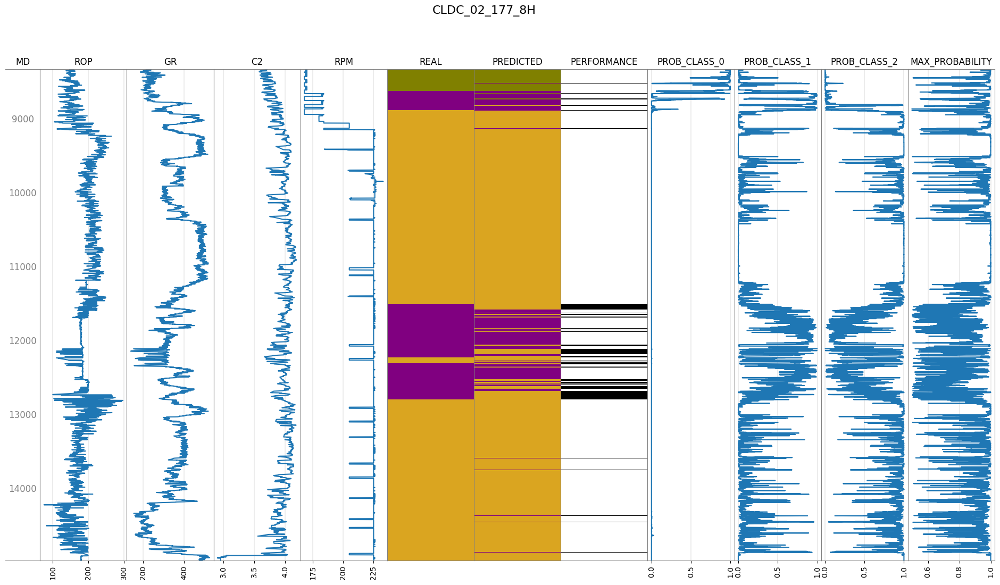

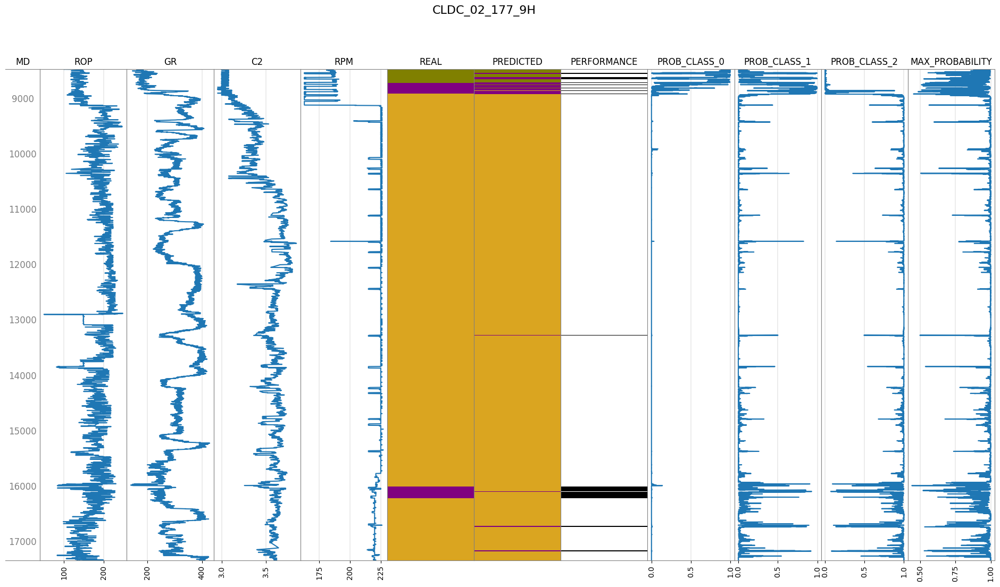

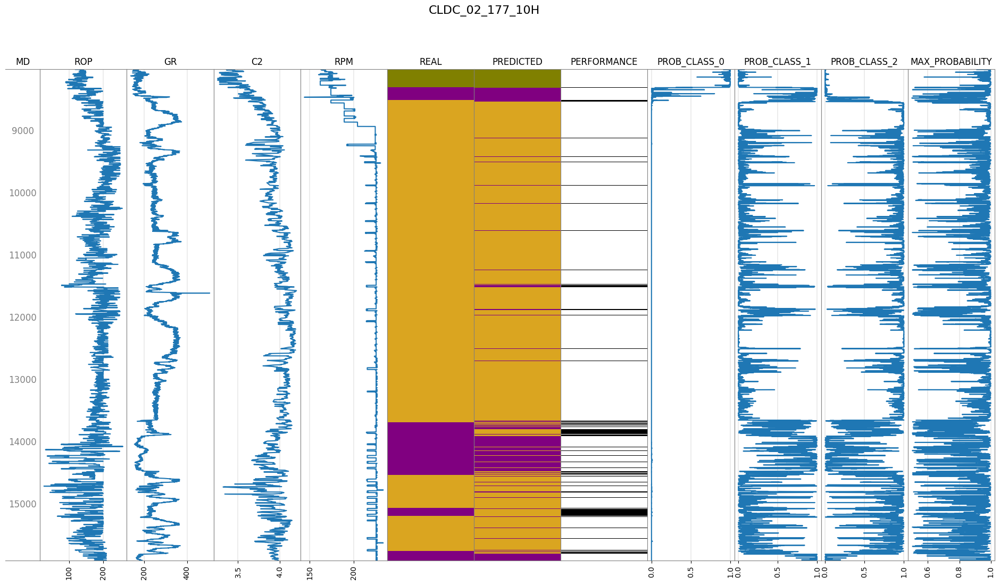

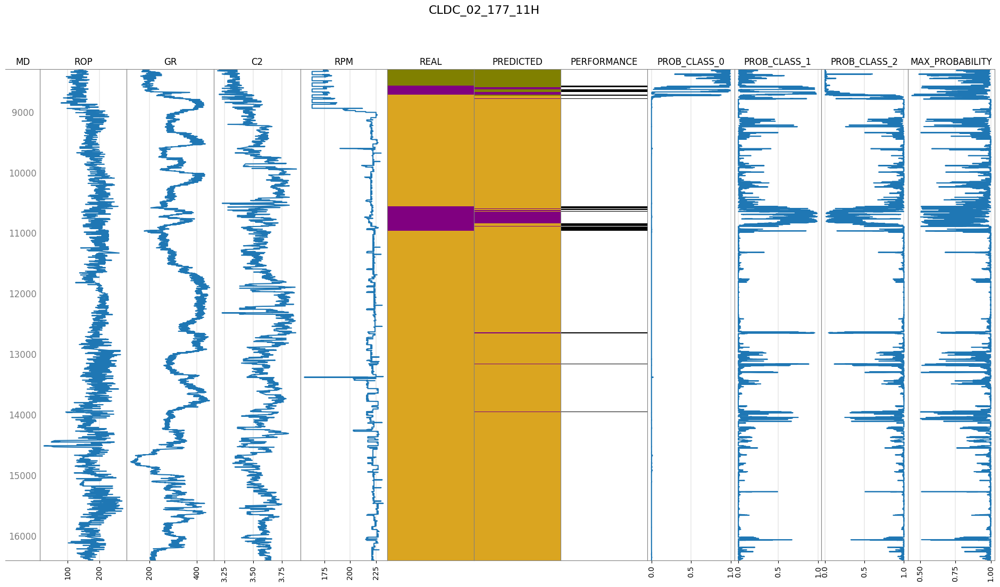

In [62]:
case_2_color_dict = {
    0: 'olive',
    1: 'purple',
    2: 'goldenrod'
}

color_dict_prob = src.data_modelling.utils.create_probabilities_color_dict(
    n_classes=3, 
    top_prob=95
)

for well_id in wells_used_for_training_the_new_models:

    real_curtains_well_df = curtains_case_2_marcellus_dataset.query(f"well_id==\"{well_id}\"")

    well_curtains_predictions = src.curtains_model.predict_model.predict(
        zone=zone,
        curtains_case=2,
        input_data=real_curtains_well_df,
        model_name=new_model_name
    )

    well_curtains_predictions = pandas.DataFrame(well_curtains_predictions)
  
    src.data_modelling.curtain_along_depth_analysis.validate_curtain_well_performance_w_predictors_probabilities_based_on_estimations(
        well_info=well_id,
        X=real_curtains_well_df,
        y_real=real_curtains_well_df["RW_CURTAIN_IDS"].values,
        y_pred=well_curtains_predictions["CURTAINS"].values,
        depth=real_curtains_well_df["DEPTH"],
        y_prob_classes=well_curtains_predictions[["PROB_CLASS_0", "PROB_CLASS_1", "PROB_CLASS_2" ]].values,
        color_dict=case_2_color_dict,
        color_dict_prob=color_dict_prob,
        model_info=new_model_name,
        feature_names=features_used_for_training_the_new_models
    )

Secondly, the case 3 curtains predictions graphics can be obtained executing the below cell.

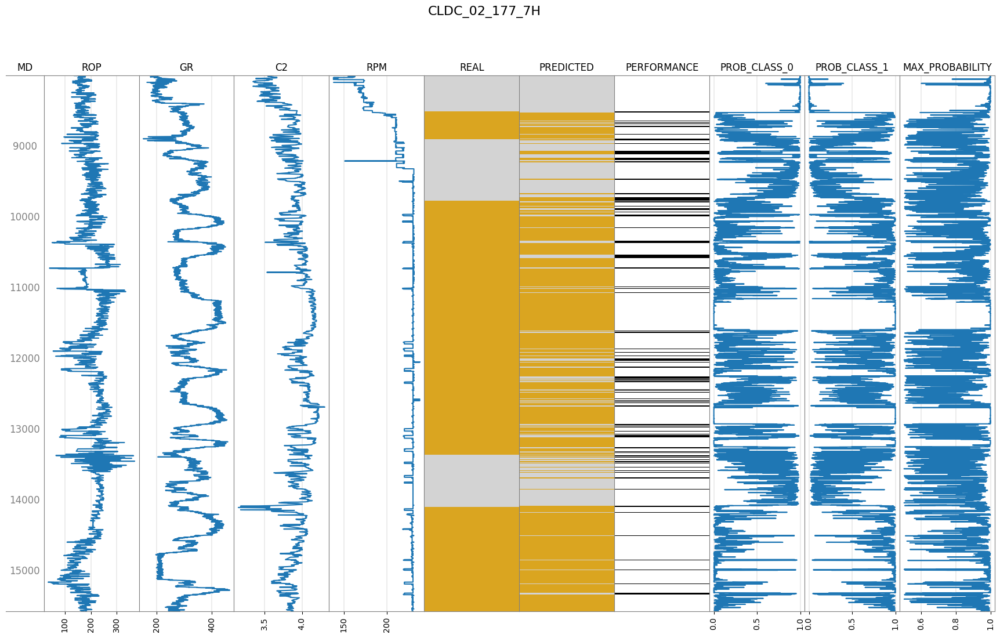

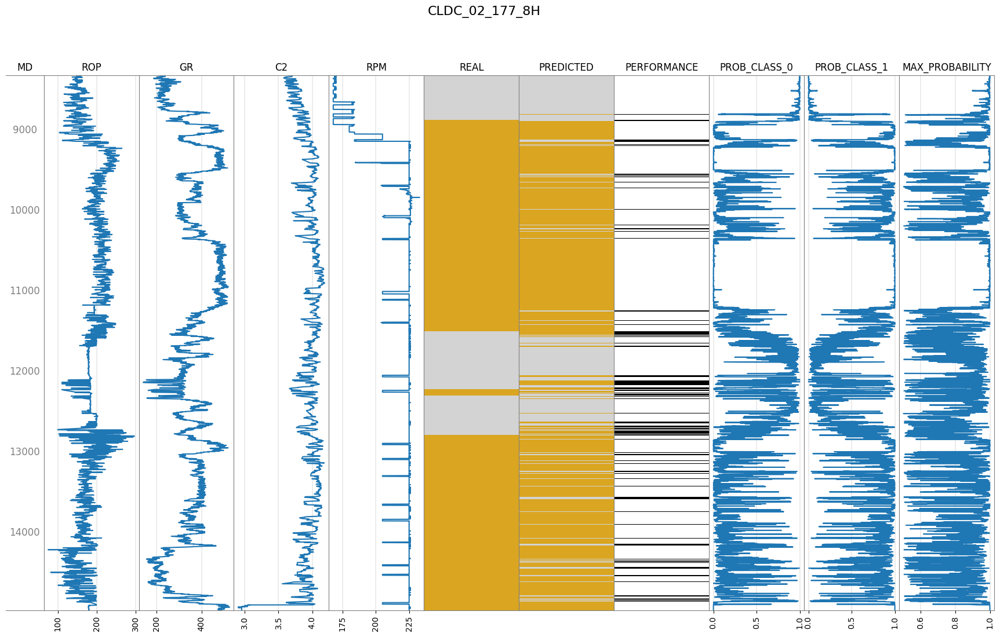

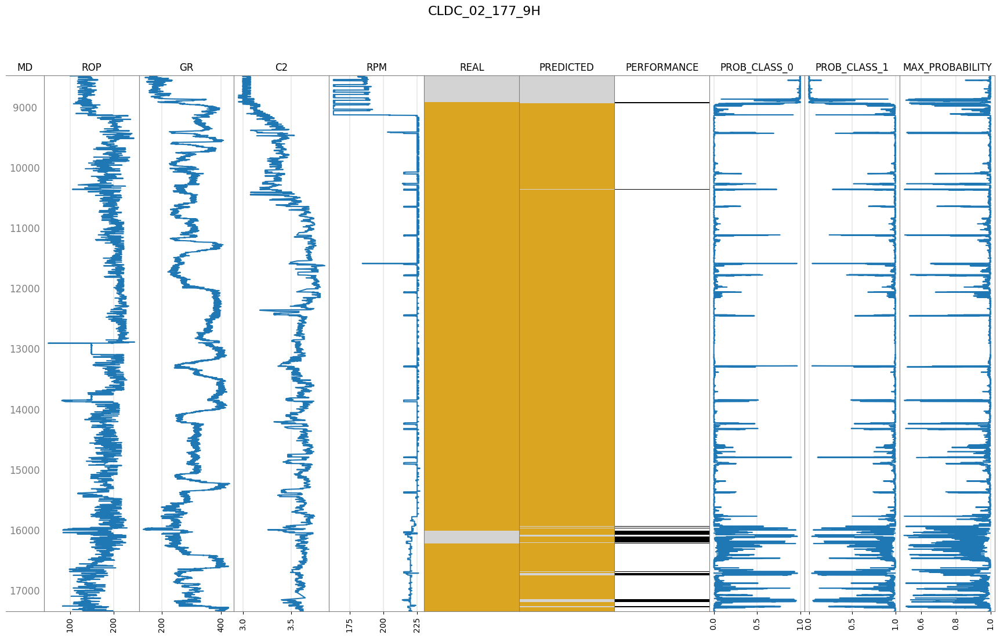

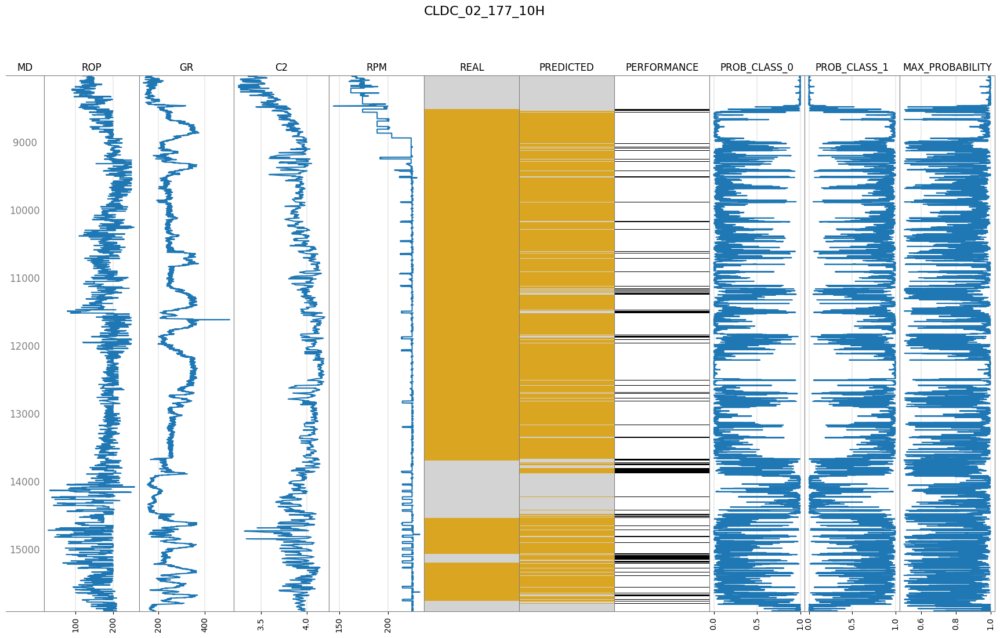

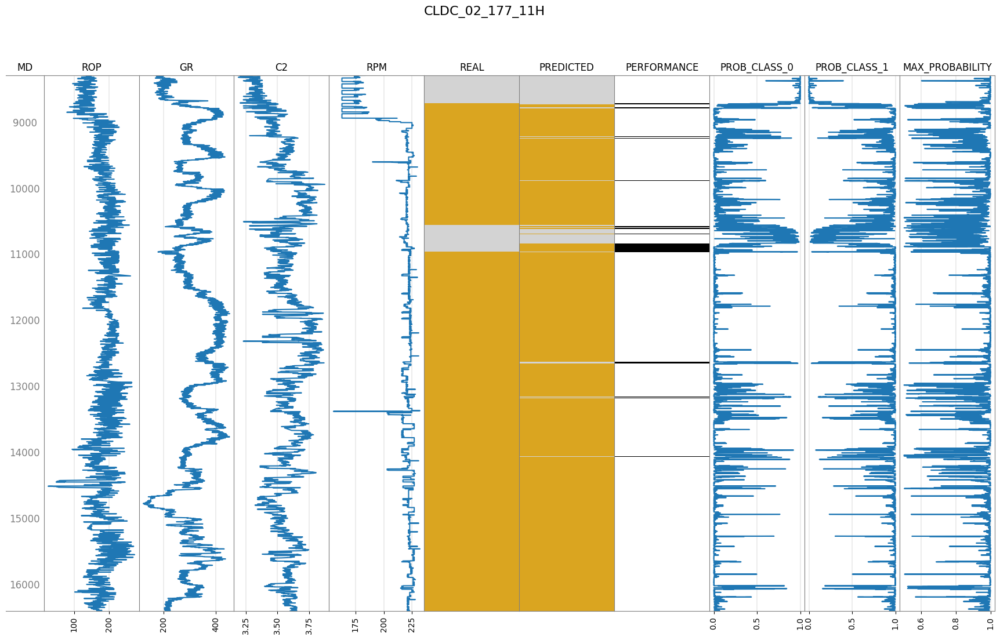

In [63]:
case_3_color_dict = {
    0: 'lightgray',
    1: 'goldenrod'
}

color_dict_prob = src.data_modelling.utils.create_probabilities_color_dict(
    n_classes=2, 
    top_prob=95
)

for well_id in wells_used_for_training_the_new_models:

    real_curtains_well_df = curtains_case_3_marcellus_dataset.query(f"well_id==\"{well_id}\"")

    well_curtains_predictions = src.curtains_model.predict_model.predict(
        zone=zone,
        curtains_case=3,
        input_data=real_curtains_well_df,
        model_name=new_model_name
    )

    well_curtains_predictions = pandas.DataFrame(well_curtains_predictions)
  
    src.data_modelling.curtain_along_depth_analysis.validate_curtain_well_performance_w_predictors_probabilities_based_on_estimations(
        well_info=well_id,
        X=real_curtains_well_df,
        y_real=real_curtains_well_df["RW_CURTAIN_IDS"].values,
        y_pred=well_curtains_predictions["CURTAINS"].values,
        depth=real_curtains_well_df["DEPTH"],
        y_prob_classes=well_curtains_predictions[["PROB_CLASS_0", "PROB_CLASS_1"]].values,
        color_dict=case_3_color_dict,
        color_dict_prob=color_dict_prob,
        model_info=new_model_name,
        feature_names=features_used_for_training_the_new_models
    )

Therefore, using the results obtained from the evaluation metrics and the conclusions drawn from the graphs shown, it is possible to assess whether the performance of the model is as expected. If not, the model can be retrained by changing parameters such as the set of training wells or the set of variables used to build the model.